In [1]:
#%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=True, use_cache=True)
%config IPCompleter.greedy=True

import libpysal as lp

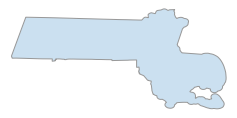

{'init': 'epsg:4326'}


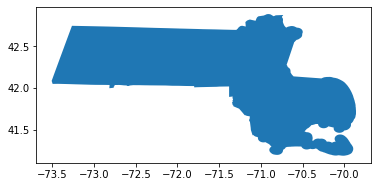

time: 336 ms


In [2]:
city = ox.gdf_from_place('Massachusetts, USA')
#city = ox.project_gdf(city)
fig, ax = ox.plot_shape(city, figsize=(4,4))
ox.save_gdf_shapefile(city)
crs = {'init': 'epsg:4326'}
city = city.to_crs(crs)
print(city.crs)
city.plot()

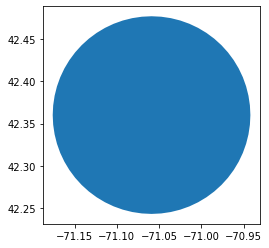

time: 165 ms


In [3]:
#39.9042° N, 116.4074° E
circle = Point(-71.0589, 42.3601).buffer(13*0.00899928)
c = gpd.GeoSeries(circle)
df1 = gpd.GeoDataFrame({'geometry': c, 'df1':[1]}, crs=crs)
city_union = gpd.overlay(df1, city, how='intersection')
city_union.plot()

In [4]:
data1 = pd.read_csv('data/Airbnb_Boston_1.csv', header=0, index_col=0)
data1 = data1[['room_id','latitude', 'longitude', 'bedrooms', 'price']]
print(len(data1))

1442
time: 14 ms


In [5]:
data2 = pd.read_csv('data/Airbnb_Boston_2.csv', header=0, index_col=0)
data2 = data2[['room_id','latitude', 'longitude', 'bedrooms', 'price']]
print(len(data2))

3486
time: 19 ms


In [6]:
data = pd.concat([data1, data2], axis=0, ignore_index=True)
print(len(data))
data.tail()

4928


,room_id,latitude,longitude,bedrooms,price
4923,15068478,42.351717,-71.066803,1.0,189.0
4924,15071185,42.360653,-71.068004,2.0,154.0
4925,15071413,42.365444,-71.031848,1.0,119.0
4926,15073826,42.352201,-71.085635,0.0,150.0
4927,15073943,42.357876,-71.069570,2.0,250.0


time: 11 ms


data max index: 4927
number of NA prices: 0
average bedroom price 132.1245103160094
pointinpoly length: 4879
check contains: True
check if there are NAs: False


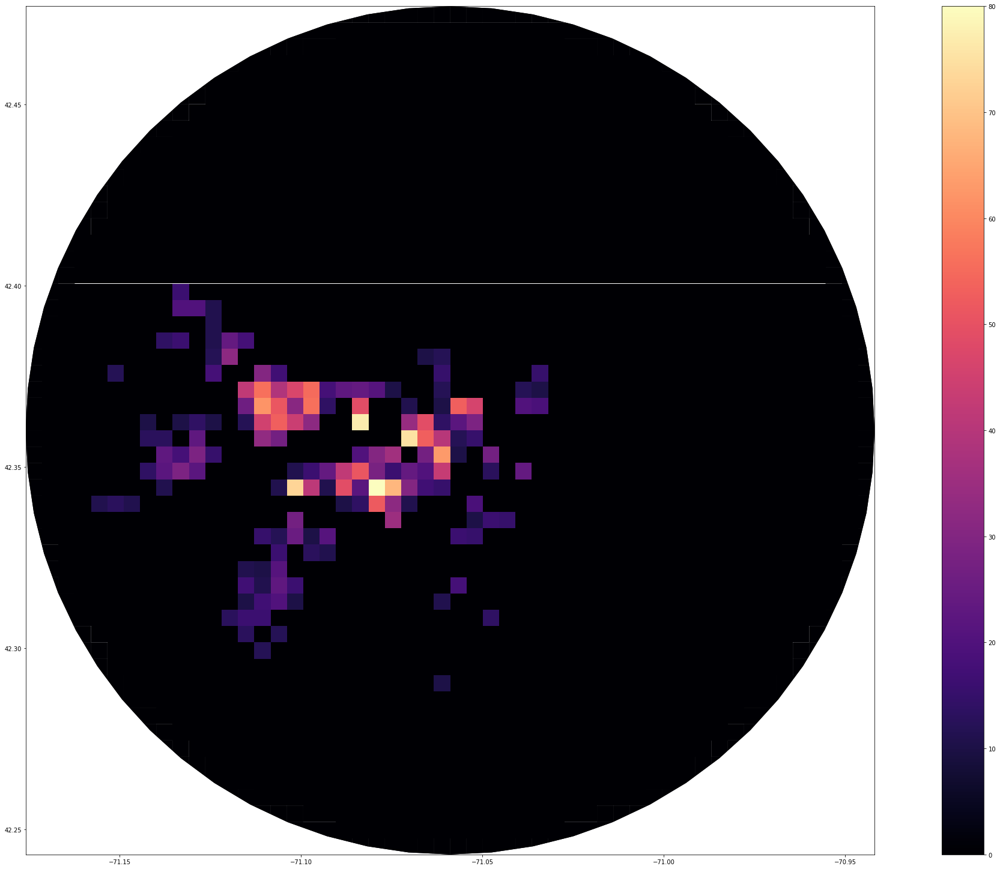

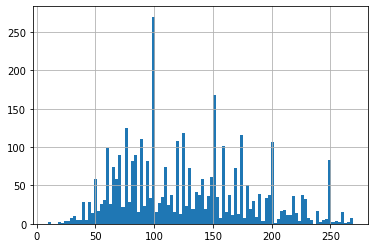

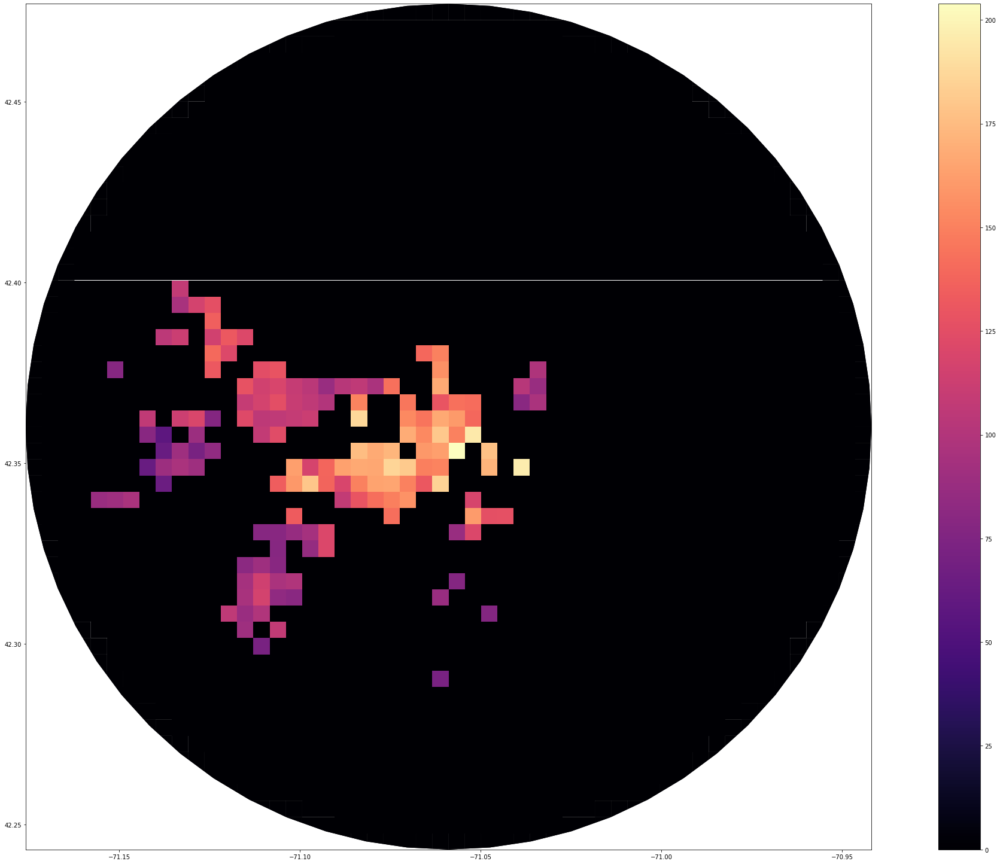

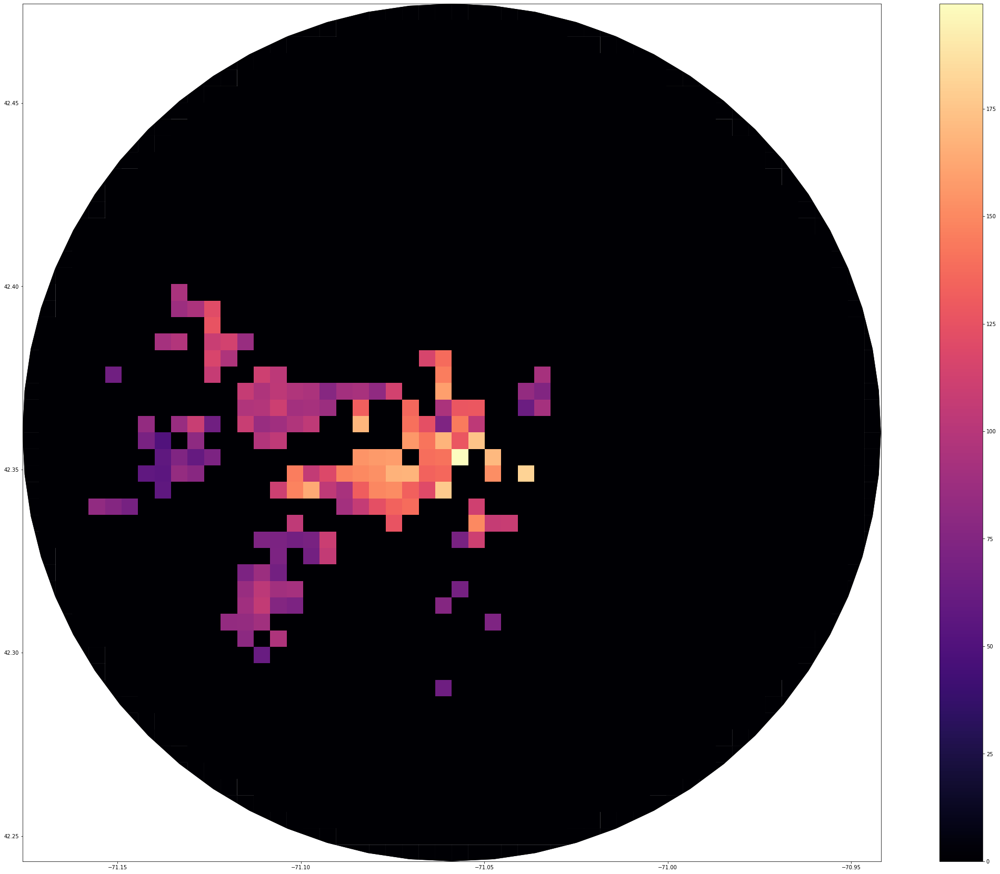

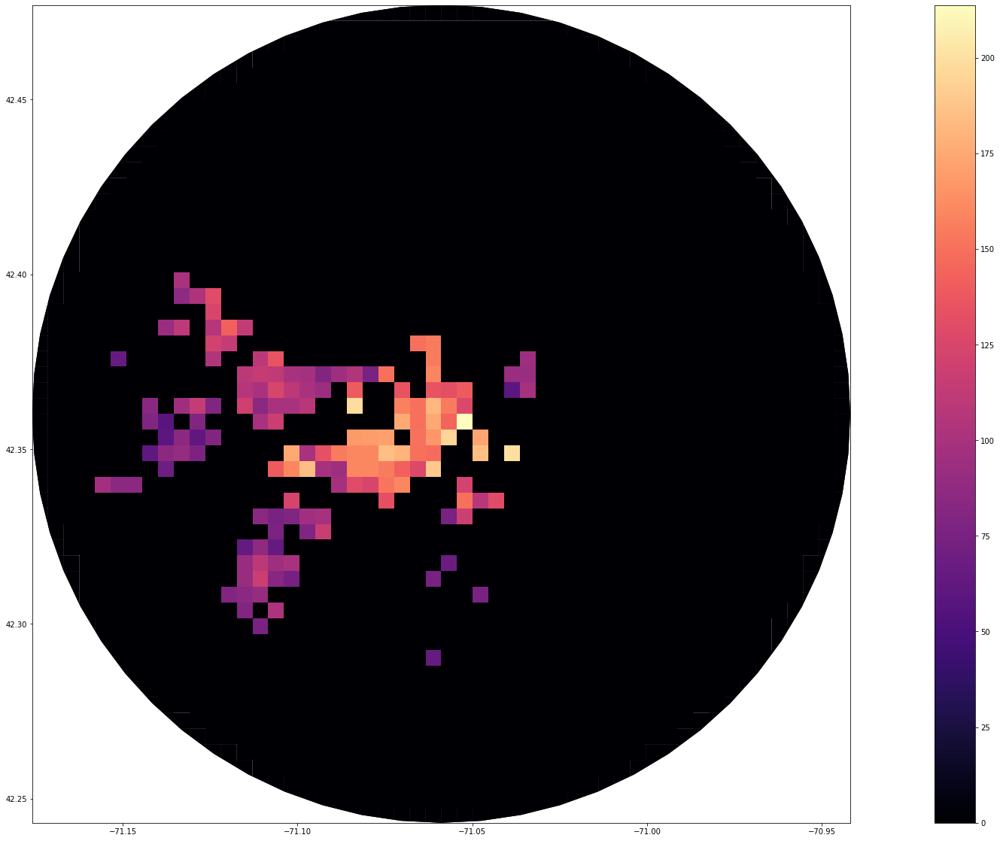

time: 9.78 s


In [7]:
data.reset_index(drop=True, inplace=True)
print("data max index:", data.index.max())
print("number of NA prices:", data.price.isna().sum())

data.loc[data.bedrooms == 0, 'bedrooms'] = 1

price_proom = np.divide(np.array(data[pd.notnull(data['bedrooms'])].price),np.array(data[pd.notnull(data['bedrooms'])].bedrooms))
mean_bed = np.mean(price_proom)
print("average bedroom price",mean_bed)

nan_list = data[data.bedrooms.isna()].index.tolist()
data.loc[data.bedrooms.isna(), 'bedrooms'] = np.ceil(data.loc[data.bedrooms.isna(), 'price']/mean_bed)

geometry = [Point(xy) for xy in zip(data.longitude, data.latitude)]
crs = {'init': 'epsg:4326'}
gdf = gpd.GeoDataFrame(data, crs=crs, geometry=geometry)

meter_500 = 0.00899928/2


# make the geometry a multipolygon if it's not already
geometry = city_union['geometry'].iloc[0]
if isinstance(geometry, Polygon):
    geometry = MultiPolygon([geometry])
    
# quadrat_width is in the units the geometry is in, so we'll do a tenth of a degree
geometry_cut = ox.quadrat_cut_geometry(geometry, quadrat_width=meter_500)

city_union['coords'] = city_union['geometry'].apply(lambda x: x.representative_point().coords[:])
city_union['coords'] = [coords[0] for coords in city_union['coords']]

polylist = [p for p in geometry_cut]

polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_union.geometry.crs
polyframe['center_lon'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][0])
polyframe['center_lat'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][1])


pointInPoly = gpd.sjoin(polyframe, gdf, op='contains')
print("pointinpoly length:",len(pointInPoly))

#pointInPoly.sort_values(['PlateID', 'Time'], inplace=True)
pointInPoly['index'] = pointInPoly.index
pointInPoly.reset_index(drop=True, inplace=True)


present_ind = list(pointInPoly['index_right'])
gdf_test_dropped = gdf.iloc[present_ind,:]
gdf_dropped = gdf_test_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)

print("check contains:",polyframe.iloc[pointInPoly.loc[len(pointInPoly)-1, 'index']].geometry.contains(gdf_dropped.loc[len(pointInPoly)-1,'geometry']))
gdf_dropped['pindex'] = pointInPoly['index']

print("check if there are NAs:", gdf_dropped.isna().values.any())

pindex = gdf_dropped.pindex.unique()
airbnb_dict = dict(gdf_dropped.pindex.value_counts())
counts = pd.DataFrame(list(airbnb_dict.items()), columns=['key', 'count'])
counts = counts[counts['count']>9]
counts = counts.copy()
airbnb_dict = dict(zip(list(counts['key']), list(counts['count'])))
polyair = polyframe.copy()
polyair['count'] = 0
polyair['count'].update(pd.Series(airbnb_dict))

# plot the city_union
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='count',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


gdf_dropped = gdf_dropped[gdf_dropped.pindex.isin(airbnb_dict.keys())]
gdf_dropped = gdf_dropped.copy()
gdf_dropped = gdf_dropped[gdf_dropped['price'] > 0]
gdf_dropped = gdf_dropped.copy()
gdf_dropped['price_normalized'] = gdf_dropped.price.divide(gdf_dropped.bedrooms)
gdf_dropped = gdf_dropped[gdf_dropped.price_normalized<270]
gdf_dropped = gdf_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)
gdf_dropped.price_normalized.hist(bins=100)

prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].mean())
from scipy import stats
hmean_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].apply(lambda x: stats.hmean(x)))
median_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].median())

polyair['prices'] = 0
polyair['hmean_prices'] = 0
polyair['median_prices'] = 0
polyair['prices'].update(pd.Series(prices_dict))
polyair['hmean_prices'].update(pd.Series(hmean_prices_dict))
polyair['median_prices'].update(pd.Series(median_prices_dict))


# plot the city_union
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()



# plot the city_union
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,30))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


# plot the city_union
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


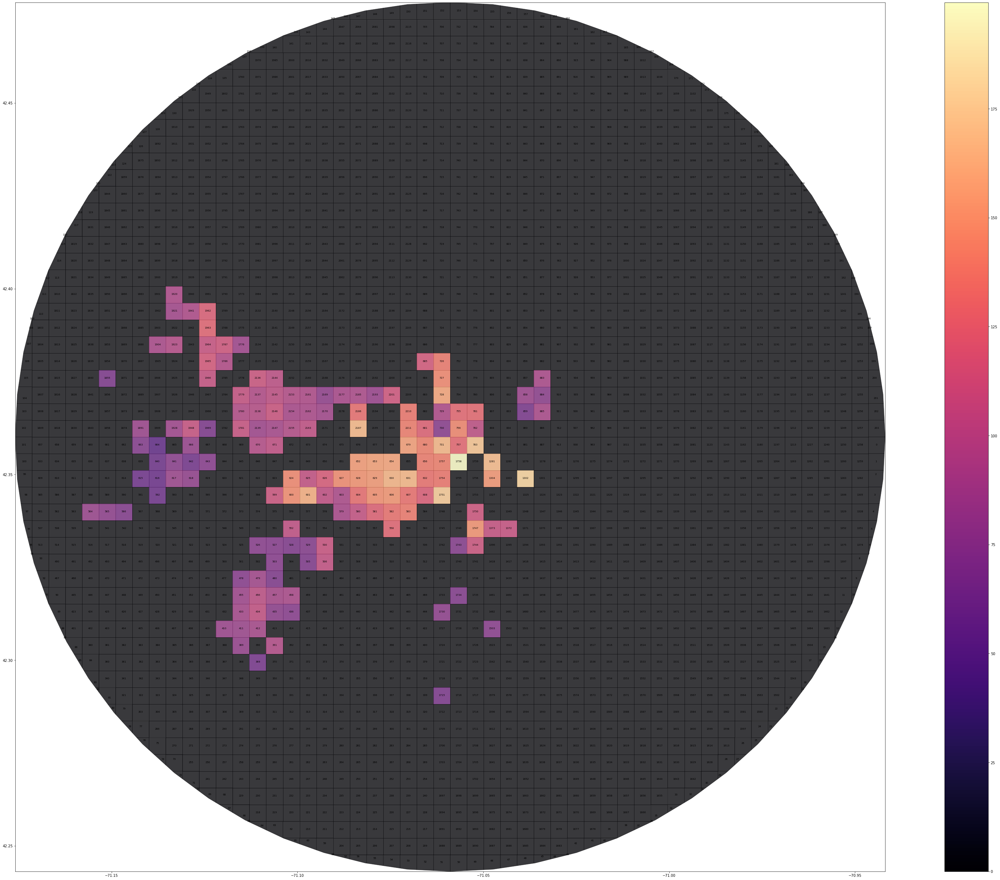

time: 20.9 s


In [8]:
# plot the city
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(60,45))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p,
                 horizontalalignment='center', size=7)
polyframe.plot(ax=ax, color='#000004', alpha=0.5)
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax, alpha=0.7, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

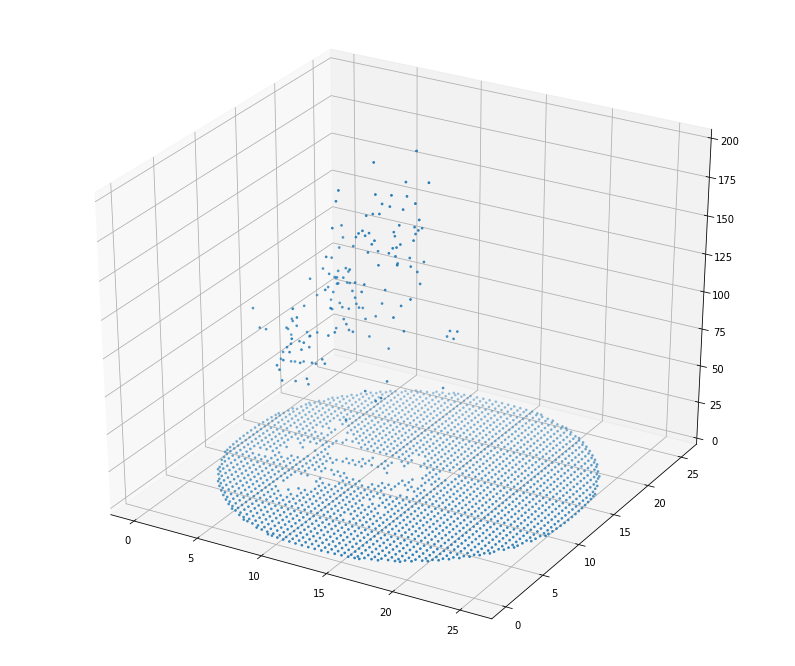

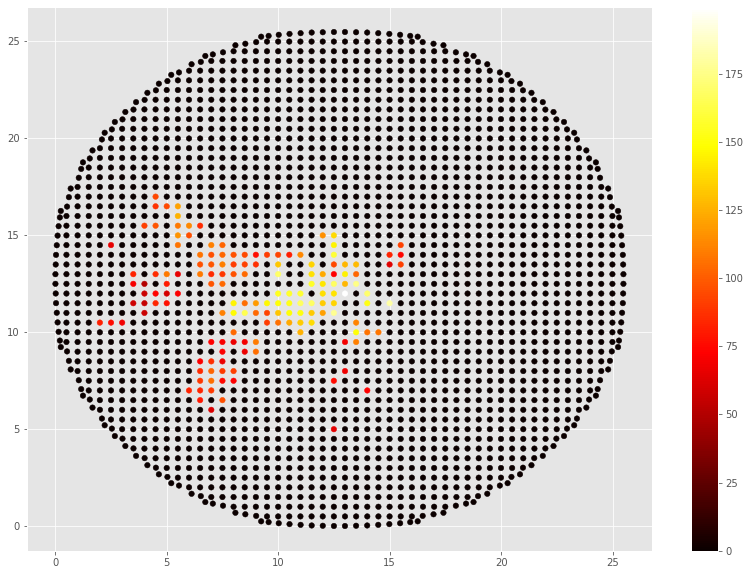

time: 2.14 s


In [9]:
import plotly.plotly as py
import plotly.graph_objs as go

# MatPlotlib
import matplotlib.pyplot as plt
from matplotlib import pylab
from mpl_toolkits.mplot3d import Axes3D
#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

y = np.array(polyair.center_lat)*500/meter_500 
y = y-y.min()
y = y/1000


# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, np.array(polyair.median_prices), cmap='plasma', s=3)
ax.set_zlim(0,np.max(np.array(polyair.hmean_prices))+2)
ax.view_init(30, 300)
plt.show()


plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(14,10))
scat = ax.scatter(x, y, c=np.array(polyair.hmean_prices), s=30, cmap='hot')
cbar = fig.colorbar(scat)
#cbar.set_clim(0, 250)
plt.savefig('images/Boston_observed.jpg')
plt.show()

In [10]:
cdf = polyair[polyair.index.isin([1758,1747,434, 2187, 601, 1948, 1963])]
cdf["cen_lon_km"] = cdf['center_lon'].apply(lambda x: (x*500/meter_500 - (polyair.center_lon*500/meter_500).min())/1000)
cdf["cen_lat_km"] = cdf['center_lat'].apply(lambda x: (x*500/meter_500 - (polyair.center_lat*500/meter_500).min())/1000)
cdf

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,geometry,center_lon,center_lat,count,prices,hmean_prices,median_prices,cen_lon_km,cen_lat_km
434,"POLYGON ((-71.11289567999549 42.3106039600045,...",-71.110646,42.312854,17,116.426471,105.492246,117.50,6.993911,7.493911
601,"POLYGON ((-71.09939675999549 42.3421014400045,...",-71.097147,42.344351,41,179.514706,163.763430,184.50,8.493911,10.993911
1747,"POLYGON ((-71.05440035999548 42.3331021600045,...",-71.052151,42.335352,10,161.111111,150.326799,150.00,13.493911,9.993911
1758,"POLYGON ((-71.05889999999549 42.3511007200045,...",-71.056650,42.353351,10,203.888889,199.412368,195.00,12.993911,11.993911
1948,"POLYGON ((-71.13089423999548 42.3645996399955,...",-71.128644,42.362350,14,119.535714,108.873593,113.75,4.993911,12.993911
1963,"POLYGON ((-71.12639459999549 42.3915974799955,...",-71.124145,42.389348,11,134.606061,125.493711,125.00,5.493911,15.993911
2187,"POLYGON ((-71.08589783999548 42.3645996399955,...",-71.083648,42.362350,77,187.272059,168.997764,198.50,9.993911,12.993911


time: 337 ms


Fitted parameters:
[ 2.37188947e+02  9.04742088e+00  1.37305257e+01  1.45200247e+00
  6.24970223e-01  4.76959028e-02  5.16814250e-01  3.76334295e+02
  1.05617430e+01  1.12839179e+01  1.46078517e+00  1.11586925e+00
  2.76237251e+00  6.91165749e-01 -1.83978755e+02  1.01406645e+01
  1.19413117e+01  1.40603255e+00  2.38047846e+00  2.87831314e+00
  1.35898558e+00]
RMS residual = 20.38406617320678


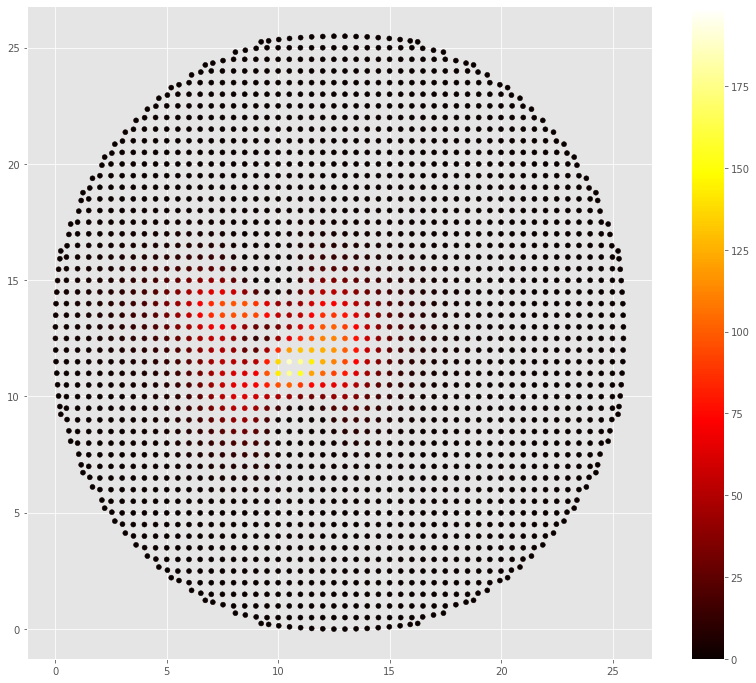

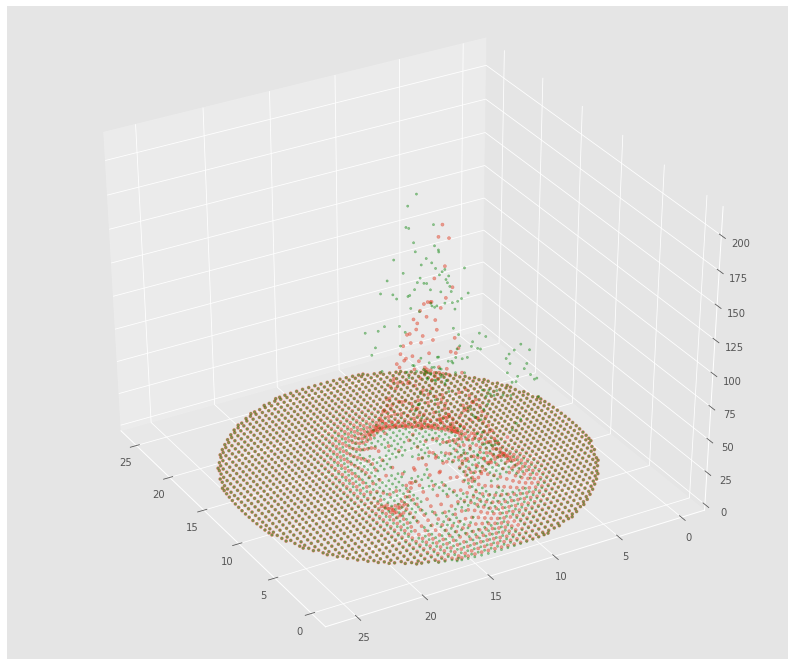

{'Boston': 0.8556551936920211}
time: 2.01 s


In [11]:
alphas = {}
xy = np.vstack([x, y])
zobs = np.array(polyair.hmean_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//7):
        arr += twoD_Gaussian_alpha(xy, *args[i*7:i*7+7])
    return arr




guess_prms = [#(105.49,6.993911,7.493911, 0.8, 0.6,0.58, 1.1),
              (163.76,8.493911,10.993911, 2.2, 1.7,2.4, 1.3),
              #(150.32,13.493911, 9.993911, 2, 1.5,0.87, 1.7),
              (199.41,12.993911,11.993911, 2, 1,2.87, 1.5),
              #(108.87,4.993911, 12.993911, 2.5, 1.5,1.87, 1.12),
              #(125.49,5.493911, 15.993911, 1, 1,1.87, 1.5),
              (169,9.993911, 12.993911, 1.5, 2,3.87, 2.1)
             ]

# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian_alpha(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, alpha):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2))**alpha)
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//7):
    zpred += twoD_Gaussian_alpha(xy, *popt[i*7:i*7+7])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=25, cmap='hot')
fig.colorbar(scat)
plt.savefig('Boston_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=10, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=5, alpha=0.4)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(35, 150)
plt.show()

alphas['Boston'] = np.mean(popt[6::7])
print(alphas)

In [12]:
import pickle
pickle_in = open("alphas.pickle","rb")
alphas_dict = pickle.load(pickle_in)
#prices_params_dict = {}
alphas_dict['Boston'] = 1.35898558
print(alphas_dict)
pickle_out = open("alphas.pickle","wb")
pickle.dump(alphas_dict, pickle_out)
pickle_out.close()

{'Paris': 1.9119263949210794, 'Amsterdam': 1.6077156181165682, 'Stockholm': 1.4869621148124246, 'Arezzo': 1.5291330654483044, 'Berlin': 1.3281036059479567, 'Bordeaux': 1.387341915093677, 'Denver': 0.9886695315944182, 'Edinburgh': 1.7431661910906637, 'Lyon': 1.840995035260712, 'Madrid': 1.561423826026336, 'Buenos_Aires': 2.0626361633770363, 'Los_Angeles': 1.7386638625850566, 'Beijing': 1.77233254047711, 'Florence': 1.052999973906332, 'Moscow': 1.822610958759147, 'Porto': 1.4172416677632145, 'Prague': 1.3671832768992007, 'Reykjavik': 1.4194582940670377, 'Riga': 1.4587192546215861, 'Rome': 1.8608390724186512, 'Seoul': 1.3208669147673713, 'Siena': 0.6212787996336754, 'Sydney': 2.584174464016137, 'Tallin': 2.014994948135572, 'Treviso': 1.07320426583068, 'Valencia': 1.5432619, 'Venezia': 1.3156028460923, 'Verona': 1.4364606330705336, 'Vicenza': 1.20971848439062, 'Vienna': 1.3399164167136137, 'Wellington': 1.46363348, 'Zurich': 1.72383878, 'Aarhus': 1.87621535, 'Milan': 2.1468310347956194, 'B

Fitted parameters:
[ 1.09688074e+02  7.06825238e+00  7.76834985e+00  6.15572192e-01
  1.09806127e+00  4.28905072e-01  1.01276805e+02  8.94185644e+00
  1.36924287e+01  4.53587286e-01  1.59339699e+00  1.45259964e+00
  1.44835072e+02  1.38938030e+01  9.99373419e+00  5.16884293e-01
  5.46112762e-02  3.14176834e+00  1.68961776e+02  1.12251195e+01
  1.16036454e+01  1.92240965e+00  8.48880408e-01  2.76071574e+00
  8.08095965e+01  4.49073402e+00  1.20830731e+01  6.93590654e-01
  8.55983297e-01  6.91709028e-01  8.59567102e+01  6.30282116e+00
  1.44995982e+01  2.42889318e+00  5.38302199e-01  1.01478217e+00
  1.54852550e+02  1.29259525e+01  1.35038666e+01  1.68753173e+00
  1.60767244e-01 -2.10794146e+00]
RMS residual = 17.54277947003527


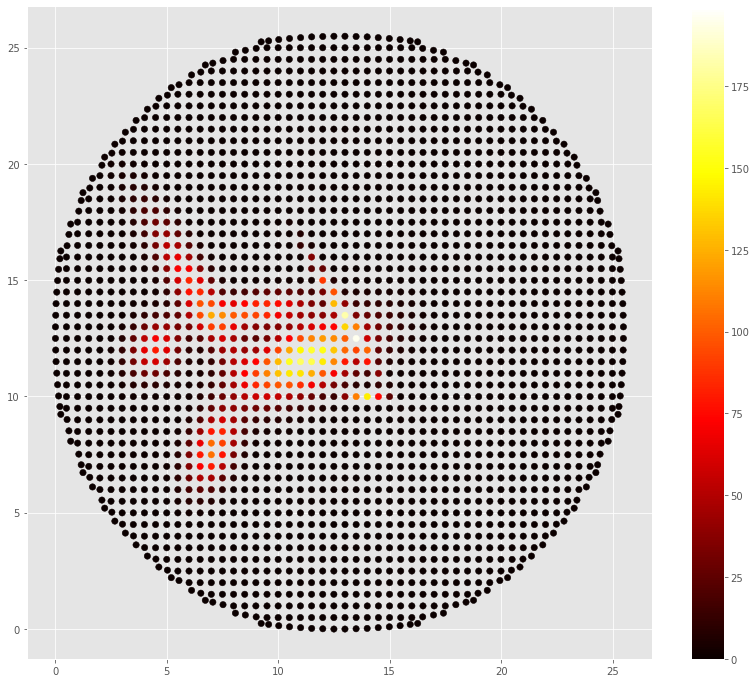

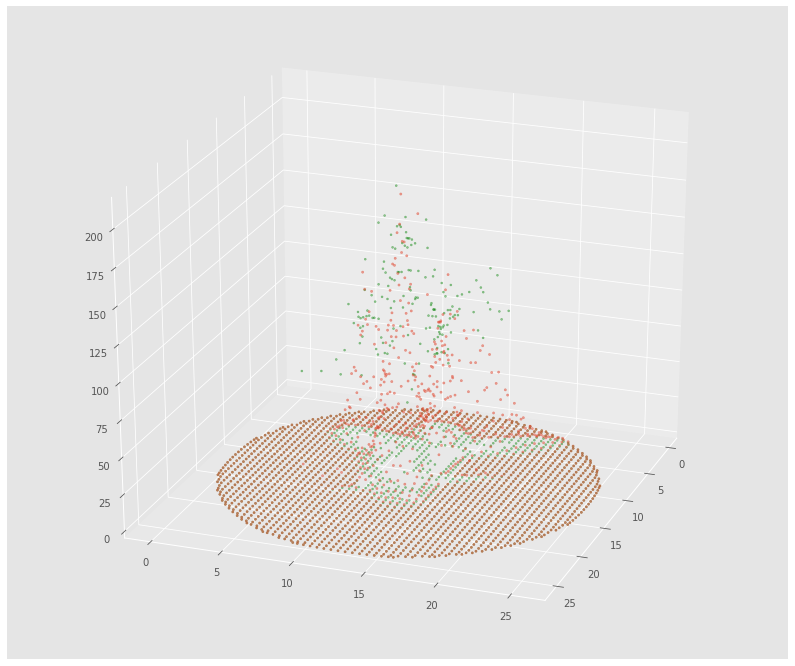

time: 3.31 s


In [13]:
xy = np.vstack([x, y])
zobs = np.array(polyair.hmean_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//6):
        arr += twoD_Gaussian(xy, *args[i*6:i*6+6])
    return arr


guess_prms = [(105.49,6.993911,7.493911, 0.8, 0.6,0.58),
              (163.76,8.493911,10.993911, 1.2, 1.7,2.4),
              (150.32,13.493911, 9.993911, 1, 0.5,1.87),
              (199.41,12.993911,11.993911, 1, 1,0.87),
              (108.87,4.993911, 12.993911, 0.5, 1,1.87),
              (125.49,5.493911, 15.993911, 1, 1,0.87),
              (169,9.993911, 12.993911, 1.5, 2,0.87)
             ]

# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//6):
    zpred += twoD_Gaussian(xy, *popt[i*6:i*6+6])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=40, cmap='hot')
fig.colorbar(scat)
plt.savefig('Boston_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=5, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=4, alpha=0.4)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(25, 20)
plt.show()

In [14]:
def is_pos_def(x):
    return np.all(np.linalg.eigvals(x) > 0)

sqrt_eigs_long = np.array([])
sqrt_eigs_short = np.array([])
for i in range(0, len(popt), 6):
    a = (np.cos(popt[i+5])**2)/(2*popt[i+3]**2) + (np.sin(popt[i+5])**2)/(2*popt[i+4]**2)
    b = -(np.sin(2*popt[i+5]))/(4*popt[i+3]**2) + (np.sin(2*popt[i+5]))/(4*popt[i+4]**2)
    c = (np.sin(popt[i+5])**2)/(2*popt[i+3]**2) + (np.cos(popt[i+5])**2)/(2*popt[i+4]**2)
    cov = np.array([a, b, b, c]).reshape(-1, 2)
    print("Is cov_{} positive definite?: ".format(i//6+1), is_pos_def(cov))
    eigenvalues = np.linalg.eigvals(cov)
    eigenvalues = eigenvalues[eigenvalues>0]
    if eigenvalues.size!=0:
        stds = np.sqrt(eigenvalues)/popt[i]
        #stds = stds[stds>=0]
        sqrt_eigs_long = np.append(sqrt_eigs_long,max(stds))
        sqrt_eigs_short = np.append(sqrt_eigs_short,min(stds))

print('long stds: ', sqrt_eigs_long, 'mean: ', np.mean(sqrt_eigs_long))
print('short stds: ', sqrt_eigs_short, 'mean: ', np.mean(sqrt_eigs_short))

Is cov_1 positive definite?:  True
Is cov_2 positive definite?:  True
Is cov_3 positive definite?:  True
Is cov_4 positive definite?:  True
Is cov_5 positive definite?:  True
Is cov_6 positive definite?:  True
Is cov_7 positive definite?:  True
long stds:  [0.01047241 0.01539268 0.08939823 0.00493004 0.01261592 0.01528196
 0.02840332] mean:  0.025213507021571668
short stds:  [0.00587082 0.00438178 0.00944535 0.00217696 0.01022249 0.00338686
 0.00270592] mean:  0.005455740386563733
time: 10 ms


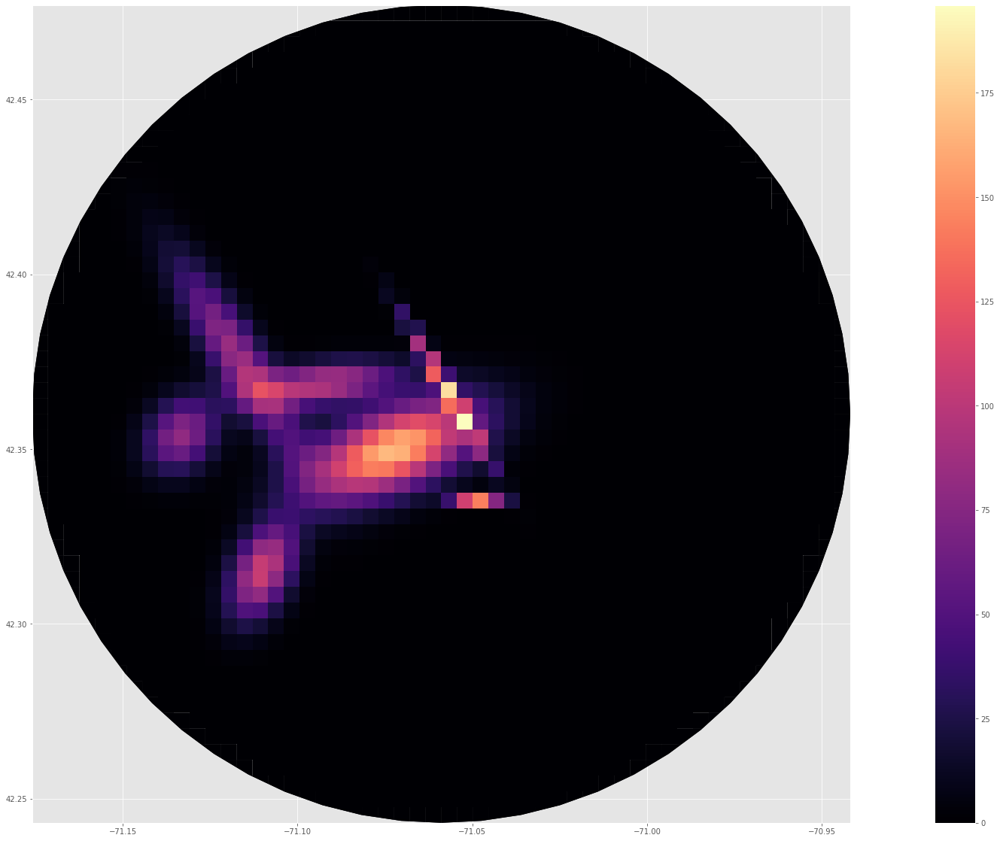

time: 1.74 s


In [15]:
polyair['zpred'] = zpred
# plot the city
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='zpred',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [16]:
import pickle
pickle_in = open("Prices_params.pickle","rb")
prices_params_dict = pickle.load(pickle_in)
#prices_params_dict = {}
prices_params_dict['Boston'] = popt
pickle_out = open("Prices_params.pickle","wb")
pickle.dump(prices_params_dict, pickle_out)
pickle_out.close()

#average_slopes = {}
pickle_in_long = open("Average_price_slopes_long.pickle","rb")
average_slopes_long = pickle.load(pickle_in_long)
average_slopes_long['Boston'] = np.mean(sqrt_eigs_long)
pickle_out_long = open("Average_price_slopes_long.pickle","wb")
pickle.dump(average_slopes_long, pickle_out_long)
pickle_out_long.close()

pickle_in_short = open("Average_price_slopes_short.pickle","rb")
average_slopes_short = pickle.load(pickle_in_short)
average_slopes_short['Boston'] = np.mean(sqrt_eigs_short)
pickle_out_short = open("Average_price_slopes_short.pickle","wb")
pickle.dump(average_slopes_short, pickle_out_short)
pickle_out_short.close()

print('long: ', average_slopes_long, '\n', '\n', ' short: ', average_slopes_short)

long:  {'Paris': 0.010453121182320417, 'Amsterdam': 0.017790862401138207, 'Stockholm': 0.01160078748441716, 'Arezzo': 0.012661960610292892, 'Berlin': 0.017168942092868542, 'Bordeaux': 0.0057209390468692745, 'Denver': 0.00873766709683174, 'Edinburgh': 0.012921100209712873, 'Lyon': 0.00594530194011358, 'Madrid': 0.01315080289968449, 'Buenos_Aires': 0.00938788752473718, 'Palermo': 0.02659431146972356, 'Los_Angeles': 0.0056655377791732745, 'Beijing': 0.03548021455387483, 'Florence': 0.011913882705309832, 'Moscow': 0.026524810524746, 'Porto': 0.03745056113103571, 'Prague': 0.01850581507565583, 'Reykjavik': 0.04000475004839031, 'Riga': 0.02150786435094239, 'Rome': 0.009635062558537275, 'Seoul': 0.013154650694260608, 'Siena': 0.013838139160990736, 'Sydney': 0.009200022664460229, 'Tallin': 0.024848430854086192, 'Treviso': 0.015264513943951563, 'Valencia': 0.01982718757582555, 'Venezia': 0.013133572970121148, 'Verona': 0.01119208328282184, 'Vicenza': 0.029546407262138693, 'Vienna': 0.0120270170

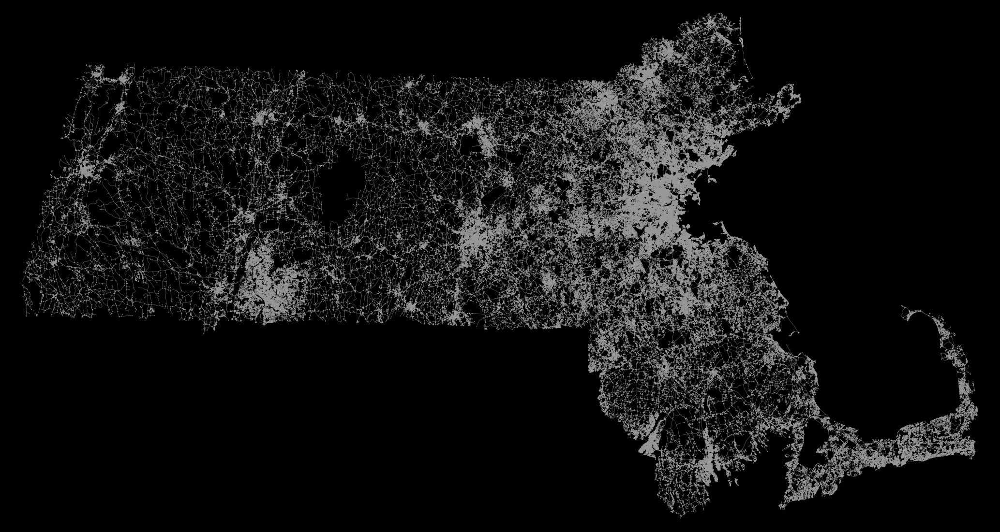

time: 33min 28s


In [17]:
# download and project a street network
G = ox.graph_from_place('Massachusetts, USA', network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, fig_height=20, bgcolor='k', node_size=2, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=0.5, edge_alpha=1)

In [18]:
centers = {}
for i in range(0, len(popt), 6):
    lon = popt[i+1]*1000 + (np.array(polyair.center_lon)*500/meter_500).min()
    lon = lon*meter_500/500
    lat = popt[i+2]*1000 + (np.array(polyair.center_lat)*500/meter_500).min()
    lat = lat*meter_500/500
    centers['center_node_{}'.format(i//6+1)] = ox.get_nearest_node(G, (lat,lon))

centers

{'center_node_1': 61471964,
 'center_node_2': 61321745,
 'center_node_3': 61344177,
 'center_node_4': 61342377,
 'center_node_5': 61567583,
 'center_node_6': 61329142,
 'center_node_7': 61367217}

time: 5.44 s


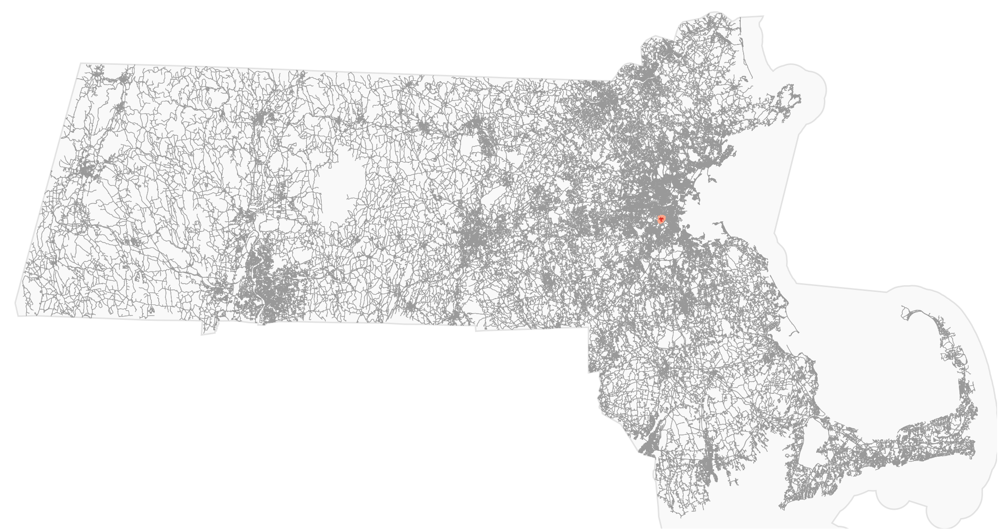

time: 2min 11s


In [19]:
import networkx as nx
#center_node = ox.get_nearest_node(G, (popt[8],popt[7]))
center_node = centers['center_node_1']
# list of distances from center
dists = np.arange(500, 2000, 500)
dists

# get one color for each isochrone
iso_colors = ox.get_colors(n=len(dists), cmap='Reds', start=0.3, return_hex=True)
# color the nodes according to isochrone then plot the street network
node_colors = {}
for dist, color in zip(sorted(dists, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=dist, distance='length')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, fig_height=20,show=False, close=False, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2)
plt.close()
# to this matplotlib axis, add the place shape as descartes polygon patches
for geometry in city['geometry'].tolist():
    if isinstance(geometry, (Polygon, MultiPolygon)):
        if isinstance(geometry, Polygon):
            geometry = MultiPolygon([geometry])
        for polygon in geometry:
            patch = PolygonPatch(polygon, fc='#cccccc', ec='k', linewidth=3, alpha=0.1, zorder=-1)
            ax.add_patch(patch)
            
fig

2212
2212 354
Number of cells with price above 5th percentile:  354



[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.00449964 0.00899928]
 [0.         0.         0.         ... 0.         0.         0.00449964]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Yes


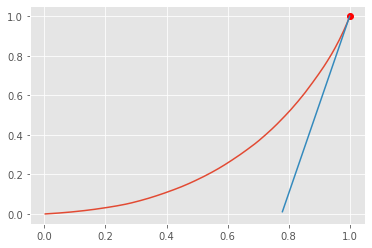

Loubar price:  70.88347129852579
Average price:  44.68443503945569
average city distance:  5610.60832524716
eta =  0.7060111878267434
time: 5.41 s


In [20]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.02*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.02*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))



mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)
    
print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True

  
if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No") 
    
    
L1= L
F1 = np.arange(1, len(L1)+1)/len(L1)

L1 = (L1 - L1.min())/(L1.max()-L1.min())

from scipy import interpolate
tck = interpolate.splrep(F1,L1)
x0_1 =1
y0_1 = interpolate.splev(x0_1,tck)
dydx = interpolate.splev(x0_1,tck,der=1)
tngnt1 = lambda x: dydx*x + (y0_1-dydx*x0_1)
plt.plot(F1, L1)
plt.plot(x0_1,y0_1, "or")
plt.plot(F1[tngnt1(F1)>0],tngnt1(F1[tngnt1(F1)>0]), label="tangent")
plt.show()

indlist = poly_prices.index.tolist()

loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

print('Loubar price: ', loubar_val)
print('Average price: ', np.mean(vals_cut))

if loubar_val > np.mean(vals_cut):
    loubar_keys = keys[vals_cut>loubar_val]
else:
    loubar_keys = keys[vals_cut>np.mean(vals_cut)]
#loubar_keys = keys[vals_cut>loubar_val]
dist_mat = mat[keys.reshape(-1,1), keys]

total_dist = dist_mat.sum()
dist_corr = dist_mat[dist_mat>0]

loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]
loubar_dist = loubar_dist_mat.sum()

loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
eta_loubar = loubar_dist_corr.mean()/dist_corr.mean()

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

avg_dist_meters = (dist_corr.mean()/0.00899928)*1000
print('average city distance: ', avg_dist_meters)
print('eta = ', eta_loubar)

In [21]:
pickle_in = open("City_spreading_index.pickle","rb")
spreading_index_dict = pickle.load(pickle_in)
#spreading_index_dict = {}
spreading_index_dict['Boston'] = eta_loubar


pickle_out = open("City_spreading_index.pickle","wb")
pickle.dump(spreading_index_dict, pickle_out)
pickle_out.close()

spreading_index_dict

{'Paris': 0.7251609142253275,
 'Amsterdam': 0.6513935879350918,
 'Stockholm': 0.6839327295656318,
 'Arezzo': 0.5574311537992848,
 'Berlin': 0.7499866909236614,
 'Bordeaux': 0.5818334466519048,
 'Denver': 0.6312111392217781,
 'Edinburgh': 0.6813298654934006,
 'Lyon': 0.6138305864151811,
 'Madrid': 0.6426066210787698,
 'Buenos_Aires': 0.8337988194080271,
 'Palermo': 0.8841435007903967,
 'Los_Angeles': 0.7889452782510832,
 'Beijing': 0.6425383574699105,
 'Florence': 0.5049117106731263,
 'Moscow': 0.6925493573699144,
 'Porto': 0.7058843952576399,
 'Prague': 0.5522963433539414,
 'Reykjavik': 0.8276260142343259,
 'Riga': 0.6850021296374689,
 'Rome': 0.5803964773671335,
 'Seoul': 0.8924742030382572,
 'Siena': 0.5646389917673048,
 'Sydney': 0.7909301400958108,
 'Tallin': 0.5690189423395199,
 'Treviso': 0.5345662066021125,
 'Valencia': 0.6956994914059091,
 'Venezia': 0.656650370883064,
 'Verona': 0.5707647012625697,
 'Vicenza': 0.5117751186840898,
 'Vienna': 0.6189242538490607,
 'Wellington': 0

time: 16 ms


In [22]:
pickle_in = open("avg_distances_dict.pickle","rb")
avg_distances_dict = pickle.load(pickle_in)
#avg_distances_dict = {}
avg_distances_dict['Boston'] = avg_dist_meters


pickle_out = open("avg_distances_dict.pickle","wb")
pickle.dump(avg_distances_dict, pickle_out)
pickle_out.close()

avg_distances_dict

{'Venezia': 2398.636425932576,
 'Verona': 3141.8502884813342,
 'Vicenza': 1988.2224372858566,
 'Vienna': 5125.89366602888,
 'Wellington': 2806.4963410749997,
 'Zurich': 2068.4583585914684,
 'Aarhus': 2857.919349359045,
 'Milan': 6008.128043000454,
 'Busan': 7348.804402235624,
 'Valencia': 4090.433301180094,
 'Bologna': 2104.4589605649485,
 'Barcelona': 4218.232625020259,
 'Bremen': 3772.1380465457137,
 'Brno': 2231.9772664038364,
 'Budapest': 3463.3335339061914,
 'Dublin': 4138.1465107736385,
 'Boston': 5610.60832524716,
 'Rio': 8357.334811118957,
 'NY': 8563.096975538809,
 'Ottawa': 2220.3476963993976,
 'Nashville': 5606.900406329212,
 'New_Orleans': 5048.047130029565,
 'Shanghai': 5452.583570486633,
 'Portland': 5406.388840795854,
 'Amsterdam': 7020.480387015727,
 'Arezzo': 1662.0178383704194,
 'Beijing': 6586.560663166117,
 'Berlin': 8495.253652229821,
 'Bordeaux': 3886.5511701192345}

time: 6.99 ms


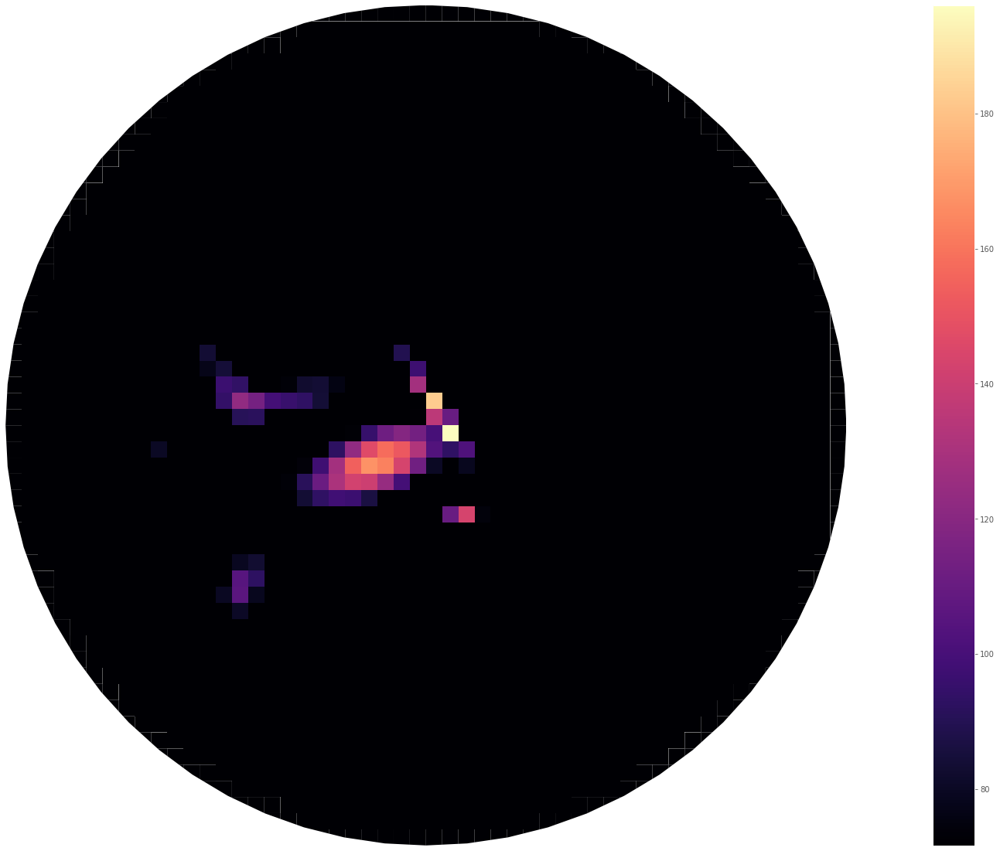

time: 853 ms


In [23]:
# plot the city
west, south, east, north = city_union.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
poly_prices[poly_prices.index.isin(loubar_keys)].plot(ax=ax, column='zpred', cmap='magma', legend=True)    
ax.set_aspect(aspect=1)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [24]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    
print(len(keys))
vals = np.array(vals)
keys = np.array(keys)
keys = keys[vals>=0.01*vals.max()]
print(len(keys))

indlist = poly_prices.index.tolist()
mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)

print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True


if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No")

2212
404



[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.00449964 0.00899928]
 [0.         0.         0.         ... 0.         0.         0.00449964]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Yes
time: 6.19 s


2212


2212 404
Number of cells with price above 1.0th percentile:  404
Loubar price:  64.16461741997645
Average price:  39.51481721585363
eta =  0.6969785865808881
2212 354
Number of cells with price above 2.0th percentile:  354
Loubar price:  70.88347129852579
Average price:  44.68443503945569
eta =  0.7060111878267434
2212 328
Number of cells with price above 3.0th percentile:  328
Loubar price:  73.14202614311293
Average price:  47.84217177565737
eta =  0.7114266368531978
2212 310
Number of cells with price above 4.0th percentile:  310
Loubar price:  75.85126889480212
Average price:  50.21592096063763
eta =  0.7273590522943812
2212 294
Number of cells with price above 5.0th percentile:  294
Loubar price:  79.3030249774782
Average price:  52.47740231887013
eta =  0.7172329686339678
2212 273
Number of cells with price above 6.000000000000001th percentile:  273
Loubar price:  82.33268862697061
Average price:  55.70266028370299
eta =  0.6915261425856749
2212 261
Number of cells with price abo

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning:

Mean of empty slice.

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning:

invalid value encountered in double_scalars



eta =  nan
2212 7
Number of cells with price above 75.0th percentile:  7
Loubar price:  182.78578200815838
Average price:  167.71441841089765
eta =  nan
2212 7
Number of cells with price above 76.0th percentile:  7
Loubar price:  182.78578200815838
Average price:  167.71441841089765
eta =  nan
2212 7
Number of cells with price above 77.0th percentile:  7
Loubar price:  182.78578200815838
Average price:  167.71441841089765
eta =  nan
2212 6
Number of cells with price above 78.0th percentile:  6
Loubar price:  182.78578200815838
Average price:  170.28386297945465
eta =  nan
2212 5
Number of cells with price above 79.0th percentile:  5
Loubar price:  182.78578200815838
Average price:  173.4566856774781
eta =  nan
2212 5
Number of cells with price above 80.0th percentile:  5
Loubar price:  182.78578200815838
Average price:  173.4566856774781
eta =  nan
2212 4
Number of cells with price above 81.0th percentile:  4
Loubar price:  196.03541880087562
Average price:  177.3896296412794
eta =  na

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:37: RuntimeWarning:

invalid value encountered in true_divide



Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan
2212 1
Number of cells with price above 95.0th percentile:  1
Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan
2212 1
Number of cells with price above 96.00000000000001th percentile:  1
Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan
2212 1
Number of cells with price above 97.0th percentile:  1
Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan
2212 1
Number of cells with price above 98.0th percentile:  1
Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan
2212 1
Number of cells with price above 99.0th percentile:  1
Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan
2212 1
Number of cells with price above 100.0th percentile:  1
Loubar price:  196.03541880087562
Average price:  196.03541880087562
eta =  nan



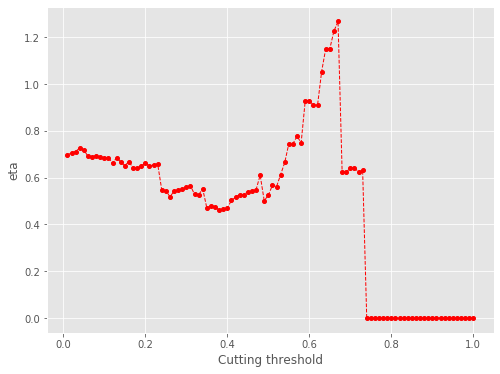

time: 1.61 s


In [25]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_cut = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    
    
        
    L1= L
    F1 = np.arange(1, len(L1)+1)/len(L1)

    L1 = (L1 - L1.min())/(L1.max()-L1.min())
    

    loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

    print('Loubar price: ', loubar_val)
    print('Average price: ', np.mean(vals_cut))
    
    
    loubar_keys = keys[vals_cut>loubar_val]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas_cut.append(eta)
    print('eta = ', eta)
etas_cut = np.array(etas_cut)
etas_cut = np.where(np.isnan(etas_cut), 0, etas_cut)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(perc_vals, etas_cut, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Cutting threshold")
plt.ylabel("eta")
plt.show()

In [26]:
pickle_in = open("etas_cut_dict.pickle","rb")
etas_cut_dict = pickle.load(pickle_in)
#etas_cut_dict = {}
etas_cut_dict['Boston'] = etas_cut


pickle_out = open("etas_cut_dict.pickle","wb")
pickle.dump(etas_cut_dict, pickle_out)
pickle_out.close()

etas_cut_dict

{'Boston': array([0.69697859, 0.70601119, 0.71142664, 0.72735905, 0.71723297,
        0.69152614, 0.68969459, 0.69338651, 0.68627389, 0.68571239,
        0.68565242, 0.66080855, 0.68568495, 0.66662135, 0.65169235,
        0.66853925, 0.64080339, 0.6392735 , 0.64870117, 0.66369008,
        0.64936606, 0.65513408, 0.65817401, 0.54708479, 0.54484174,
        0.5177247 , 0.54225619, 0.54660686, 0.55128317, 0.55836993,
        0.56571414, 0.52792612, 0.52759205, 0.55096732, 0.46941853,
        0.48021089, 0.47484233, 0.46129546, 0.46439344, 0.4699713 ,
        0.50255475, 0.51573036, 0.52765377, 0.52765377, 0.53943229,
        0.54404083, 0.54813213, 0.6100999 , 0.50092562, 0.52536404,
        0.56707558, 0.56150998, 0.61316219, 0.66467806, 0.74541769,
        0.74541769, 0.77652679, 0.74895419, 0.92876367, 0.92876367,
        0.90963119, 0.90963119, 1.05344906, 1.15130075, 1.15130075,
        1.22651104, 1.26738008, 0.62257449, 0.62257449, 0.64231201,
        0.64231201, 0.62403947, 0.6307

time: 28 ms


100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100


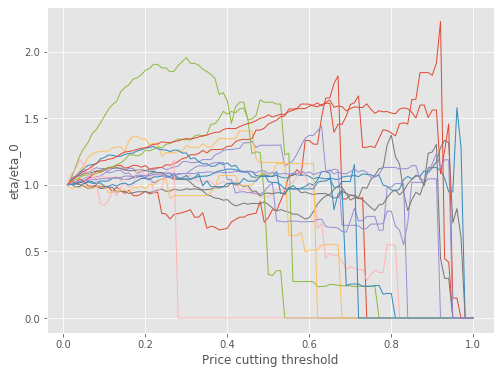

time: 249 ms


In [27]:
fig, ax = plt.subplots(figsize=(8, 6))
for key in etas_cut_dict:
    print(len(etas_cut_dict[key]))
    etas = etas_cut_dict[key]#[1:]
    vals = etas/etas[0]
    plt.plot(np.linspace(0.01, 1, 100), vals, linestyle='-', linewidth=1)
plt.xlabel("Price cutting threshold")
plt.ylabel("eta/eta_0")
plt.show()

2212 354
Number of cells with price above 5th percentile:  354


eta =  1.0
eta =  1.0
eta =  1.0
eta =  0.9734055560738049
eta =  0.949930898897174
eta =  0.9226047577014832
eta =  0.897475139715299
eta =  0.8866137221496638
eta =  0.8837669615816305
eta =  0.874336198188555
eta =  0.8600474753534416
eta =  0.8467187851791738
eta =  0.8431708244418804
eta =  0.826723122365871
eta =  0.824502399087772
eta =  0.8186018361579236
eta =  0.8036681028106707
eta =  0.7981294233773586
eta =  0.7873326210544972
eta =  0.7830354254800492
eta =  0.7793963558219696
eta =  0.7751491400320014
eta =  0.7737654864906381
eta =  0.7727905227953802
eta =  0.7646663727852543
eta =  0.761490706702145
eta =  0.7665771296124123
eta =  0.7467369870336169
eta =  0.745296262548004
eta =  0.7471058251619633
eta =  0.7419005495607037
eta =  0.7327770139406578
eta =  0.7296672081748908
eta =  0.735043280200091
eta =  0.7114680269056586
eta =  0.7133500962757506
eta =  0.7060111878267434
eta =  0.6925066410518038
eta =  0.6904924852087572
eta =  0.6842763133872638
eta =  0.6721

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan



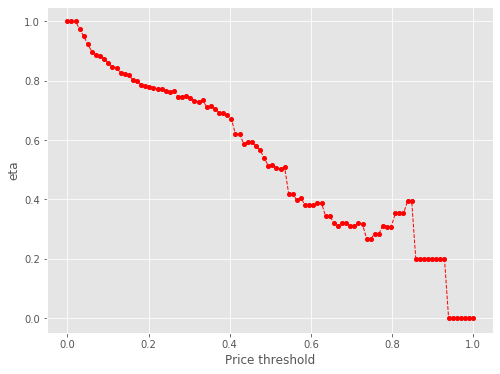

time: 778 ms


In [28]:
lval = np.linspace(0, max(vals_cut), 100)
etas = []

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)
vals_cut = vals[vals>0.02*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.02*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

for i in tqdm_notebook(lval):
    loubar_keys = keys[vals_cut>=i]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas.append(eta)
    print('eta = ', eta)
etas = np.array(etas)
etas = np.where(np.isnan(etas), 0, etas)
lval = lval/lval.max()
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lval, etas, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Price threshold")
plt.ylabel("eta")
plt.show()

etas_cut_threshold = etas

In [29]:
pickle_in = open("etas_cut_threshold_dict.pickle","rb")
etas_cut_threshold_dict = pickle.load(pickle_in)
#etas_cut_threshold_dict = {}
etas_cut_threshold_dict['Boston'] = etas_cut_threshold


pickle_out = open("etas_cut_threshold_dict.pickle","wb")
pickle.dump(etas_cut_threshold_dict, pickle_out)
pickle_out.close()

etas_cut_threshold_dict

{'NY': array([1.        , 1.        , 1.        , 1.        , 1.        ,
        0.99991145, 0.98955316, 0.97868522, 0.96344498, 0.95205618,
        0.94615067, 0.93194961, 0.92540239, 0.92150344, 0.91822455,
        0.91569734, 0.91218202, 0.90337978, 0.898264  , 0.89376519,
        0.89441924, 0.88573077, 0.88617046, 0.87902683, 0.87195329,
        0.87101443, 0.87158631, 0.86935351, 0.86321974, 0.86053312,
        0.86079304, 0.86069179, 0.86140605, 0.85888874, 0.8617884 ,
        0.85709178, 0.8579834 , 0.85179248, 0.84947743, 0.84847717,
        0.84228408, 0.82983947, 0.82767187, 0.82334824, 0.81678545,
        0.81788964, 0.81304395, 0.807866  , 0.79902867, 0.79698224,
        0.78820712, 0.76853775, 0.76312442, 0.75071909, 0.7481045 ,
        0.73389742, 0.71700231, 0.70245218, 0.68328343, 0.67990807,
        0.66811743, 0.61552082, 0.58620924, 0.57826542, 0.57372339,
        0.55441141, 0.5326264 , 0.53706259, 0.53126932, 0.52772792,
        0.5331439 , 0.51700595, 0.49034259

time: 25 ms


2212 404
Number of cells with price above 1.0th percentile:  404


eta =  1.0
eta =  0.9462136729228725
eta =  0.9229971172005279
eta =  0.9007381103907722
eta =  0.874827071163126
eta =  0.8509988067641092
eta =  0.8406998547607653
eta =  0.8380005155374993
eta =  0.8290581303512894
eta =  0.818578974387375
eta =  0.8021929344276449
eta =  0.7987635376759542
eta =  0.7820784652713604
eta =  0.7838008925689938
eta =  0.7762100084535929
eta =  0.766345681652721
eta =  0.7599684270926069
eta =  0.7522156948567689
eta =  0.7424854274503189
eta =  0.7390348093777785
eta =  0.7329477565150683
eta =  0.7336955382715863
eta =  0.7327710637044512
eta =  0.7261070403894264
eta =  0.720157455678014
eta =  0.7257885730523589
eta =  0.7080667272118772
eta =  0.7024309241881661
eta =  0.7067006115793915
eta =  0.7078388526595588
eta =  0.6986495570999441
eta =  0.6965375412033218
eta =  0.6969785865808881
eta =  0.6813283007967025
eta =  0.6764087982741231
eta =  0.6764879108833982
eta =  0.6494285592995386
eta =  0.6547348834404931
eta =  0.6566338959990695
eta =

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan


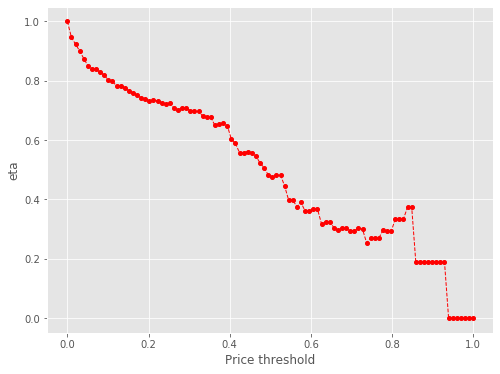

2212 354
Number of cells with price above 2.0th percentile:  354


eta =  1.0
eta =  0.9734055560738049
eta =  0.9520679064847138
eta =  0.9261655918722003
eta =  0.897475139715299
eta =  0.8866137221496638
eta =  0.8835997208421861
eta =  0.8758847915354442
eta =  0.8632847350277855
eta =  0.8486249834356345
eta =  0.8458860536160975
eta =  0.8247907920772225
eta =  0.826607287784744
eta =  0.8208394738228248
eta =  0.8081987803563848
eta =  0.800551912513136
eta =  0.795881798188451
eta =  0.7839888446174936
eta =  0.7777054911774773
eta =  0.7791249918549389
eta =  0.7717458974745887
eta =  0.7739293800147825
eta =  0.7649324252471421
eta =  0.7662797560394384
eta =  0.7654266913496278
eta =  0.7601408088628931
eta =  0.7407933910310023
eta =  0.745296262548004
eta =  0.7443177565071869
eta =  0.7402833765078791
eta =  0.7327770139406578
eta =  0.734065678789481
eta =  0.728278632265909
eta =  0.7133500962757506
eta =  0.7220935017197349
eta =  0.6950826877568329
eta =  0.6971458800627571
eta =  0.6904924852087572
eta =  0.6842763133872638
eta =  0

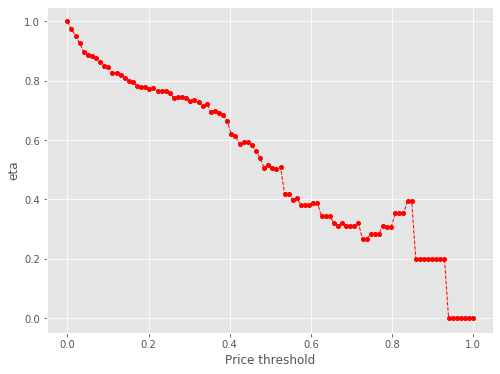

2212 328
Number of cells with price above 3.0th percentile:  328


eta =  1.0
eta =  0.9670898243577828
eta =  0.9478112714116563
eta =  0.9219950863391737
eta =  0.9108369236413519
eta =  0.907912386637972
eta =  0.8998148675751276
eta =  0.8868705645258615
eta =  0.8718102933976789
eta =  0.8689965331900791
eta =  0.8473249273447602
eta =  0.8491910515888504
eta =  0.8432656549995978
eta =  0.8302796047479167
eta =  0.8224238165869243
eta =  0.8176261099213473
eta =  0.8049841212066545
eta =  0.8026510809505796
eta =  0.8004114903530144
eta =  0.7948656507508967
eta =  0.7950306154396612
eta =  0.7890690336265325
eta =  0.7855578468952937
eta =  0.7855208362381609
eta =  0.7809086398981457
eta =  0.7610326306529057
eta =  0.7656585252647712
eta =  0.7646532854295233
eta =  0.7605086820068961
eta =  0.752797237871013
eta =  0.7496024690037485
eta =  0.7481759557685225
eta =  0.7328395567753093
eta =  0.7355985292542201
eta =  0.7253001417768904
eta =  0.7114266368531978
eta =  0.7093574521947799
eta =  0.7114148936788185
eta =  0.690535213424717
eta 

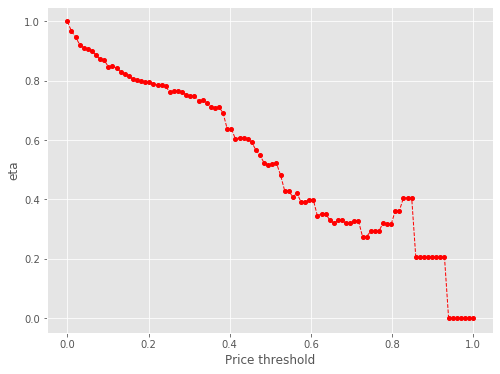

2212 310
Number of cells with price above 4.0th percentile:  310


eta =  1.0
eta =  0.9727936269712611
eta =  0.9426587469259564
eta =  0.9362158657666774
eta =  0.9280847666682407
eta =  0.9235278923434322
eta =  0.9067470178836934
eta =  0.891349217482797
eta =  0.8879166543440566
eta =  0.8724939559548844
eta =  0.8698288390253974
eta =  0.8664995202639177
eta =  0.8470595340887251
eta =  0.8435276845256946
eta =  0.8351596706763639
eta =  0.8230253438821566
eta =  0.819213002854303
eta =  0.818635257541352
eta =  0.8154260714210034
eta =  0.8108429130259767
eta =  0.8112019929360037
eta =  0.8031636898764968
eta =  0.7998281441013696
eta =  0.8051706442272774
eta =  0.7843316447781199
eta =  0.7828183866630213
eta =  0.784719052152987
eta =  0.7840792261633845
eta =  0.7739001639032423
eta =  0.771560665606919
eta =  0.7720492153905963
eta =  0.74728706015581
eta =  0.749263882772425
eta =  0.7493515164947433
eta =  0.7193776384423612
eta =  0.7322438612985116
eta =  0.7273590522943812
eta =  0.7187263731153303
eta =  0.6842820296806483
eta =  0.

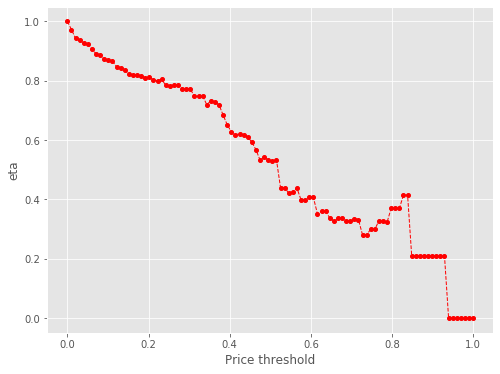

2212 294
Number of cells with price above 5.0th percentile:  294


eta =  1.0
eta =  0.9690223299065723
eta =  0.9623992590098821
eta =  0.9540407553427144
eta =  0.948314914580672
eta =  0.9321062481739316
eta =  0.9162778134741315
eta =  0.9127492509470234
eta =  0.8968952219304169
eta =  0.8941555689808137
eta =  0.890733138293387
eta =  0.8771155783722931
eta =  0.8671188432349944
eta =  0.8585167989603171
eta =  0.847805497770543
eta =  0.843846571601931
eta =  0.8415302432542937
eta =  0.8369444371876025
eta =  0.8335199682079446
eta =  0.8343977897442945
eta =  0.8256259782222282
eta =  0.8228858845538294
eta =  0.8263041224512911
eta =  0.806267252407988
eta =  0.7998498298058376
eta =  0.804711672608591
eta =  0.8060077743360343
eta =  0.7955440315873958
eta =  0.7968742237607853
eta =  0.7936413171150479
eta =  0.7758205208063417
eta =  0.7702187411580977
eta =  0.779659175482925
eta =  0.7504950452237767
eta =  0.7527227163055253
eta =  0.7455389093142177
eta =  0.7388271810055385
eta =  0.7172329686339678
eta =  0.6696993821553241
eta =  0

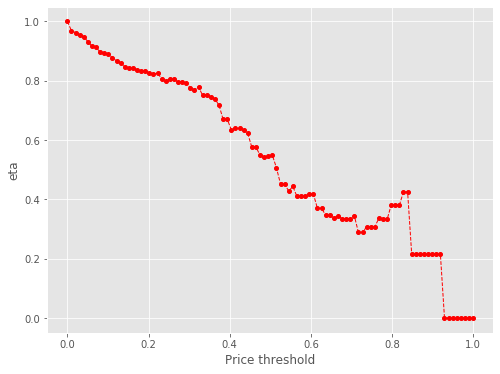

2212 273
Number of cells with price above 6.000000000000001th percentile:  273


eta =  1.0
eta =  0.9878978067636718
eta =  0.9847258408316277
eta =  0.9742177353970114
eta =  0.9619037863284329
eta =  0.9455693488120896
eta =  0.9419279853282901
eta =  0.9217275266209006
eta =  0.9210364178410156
eta =  0.9192080623975574
eta =  0.9020639101239892
eta =  0.8948388664259131
eta =  0.8859618323172083
eta =  0.8749081126461593
eta =  0.8708226276718412
eta =  0.8684322510250402
eta =  0.8636998460791879
eta =  0.8601659038015232
eta =  0.8610717875043628
eta =  0.8532409618180559
eta =  0.8462496656327705
eta =  0.8528667341052364
eta =  0.8320419741882767
eta =  0.8254193996571314
eta =  0.8304366656712409
eta =  0.8295603566697832
eta =  0.8248511226090508
eta =  0.8164872557618837
eta =  0.8179231338066305
eta =  0.8114749924961004
eta =  0.7948410654606463
eta =  0.8008176175088636
eta =  0.786663782186443
eta =  0.7716165166106816
eta =  0.7693722696628658
eta =  0.7716037799111554
eta =  0.7489575851933449
eta =  0.691108307297617
eta =  0.6915261425856749
eta

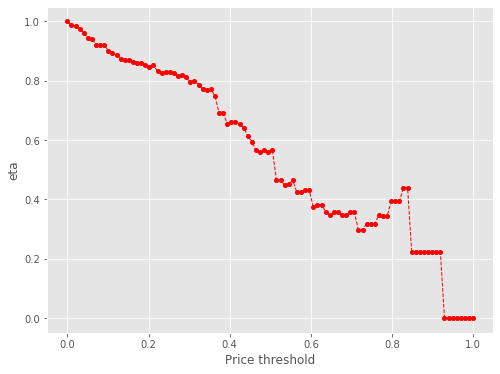

2212 261
Number of cells with price above 6.999999999999999th percentile:  261


eta =  1.0
eta =  0.9967891760561395
eta =  0.9861523415954572
eta =  0.9736875411026625
eta =  0.9541965897638011
eta =  0.9540637963116351
eta =  0.9302707272310801
eta =  0.9323195289382286
eta =  0.930468775316811
eta =  0.9095936337782469
eta =  0.9058010457148221
eta =  0.8968152639386829
eta =  0.8856261312213417
eta =  0.8814905972153476
eta =  0.8790709373776243
eta =  0.874280558338971
eta =  0.8727199536395439
eta =  0.8716203048625162
eta =  0.8636935480333251
eta =  0.8566166053197981
eta =  0.8633147358624129
eta =  0.8422348632537461
eta =  0.8355311592007522
eta =  0.8406098889840947
eta =  0.8395062448419258
eta =  0.8349559205027919
eta =  0.8264895925183551
eta =  0.8279430607160937
eta =  0.8214159267692597
eta =  0.8024554652511457
eta =  0.8045782266331023
eta =  0.7963007679544644
eta =  0.7781360751556148
eta =  0.7787974266116754
eta =  0.7810562738659274
eta =  0.7717862878641024
eta =  0.7347990936386533
eta =  0.6995746954451395
eta =  0.6767706018630522
eta

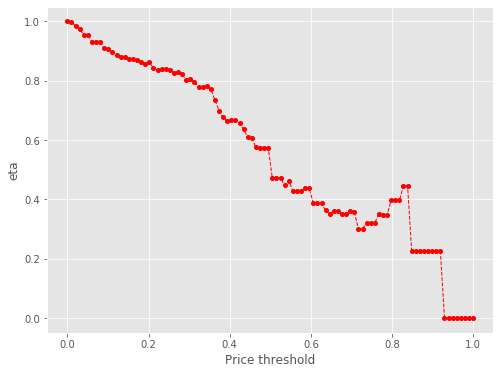

2212 256
Number of cells with price above 8.0th percentile:  256


eta =  1.0
eta =  0.9893289025240345
eta =  0.9768239508329333
eta =  0.9602361485847987
eta =  0.957136994691746
eta =  0.9332672841731248
eta =  0.9353226854117846
eta =  0.9334659702047233
eta =  0.9160558936507361
eta =  0.9087187817374605
eta =  0.8997040552617056
eta =  0.8884788804844155
eta =  0.8843300252346458
eta =  0.881902571269609
eta =  0.8770967616222703
eta =  0.8755311299551993
eta =  0.8744279390263225
eta =  0.8653380199963392
eta =  0.8593759100686233
eta =  0.8660956164052395
eta =  0.860114534608207
eta =  0.8382225442160046
eta =  0.8433176334338037
eta =  0.8422104342700493
eta =  0.8376454525783965
eta =  0.8291518531415182
eta =  0.8256330456945851
eta =  0.8317161787589608
eta =  0.8050403079476769
eta =  0.8071699070975749
eta =  0.8072643134944782
eta =  0.7730068751407775
eta =  0.7888345122283282
eta =  0.7835721862031315
eta =  0.7742723400325479
eta =  0.7516421475139939
eta =  0.7018281420481027
eta =  0.6910250067571923
eta =  0.6652918489094102
eta 

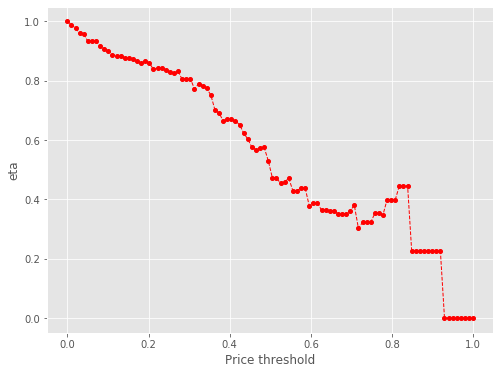

2212 248
Number of cells with price above 9.0th percentile:  248


eta =  1.0
eta =  0.9873601674233939
eta =  0.9705934458550511
eta =  0.9674608638743307
eta =  0.9461959968449815
eta =  0.9471598264908478
eta =  0.9435345190292224
eta =  0.9291097297201389
eta =  0.9185204024860522
eta =  0.9094084413851928
eta =  0.903065973926458
eta =  0.893868584025485
eta =  0.8914149470612319
eta =  0.8865573009992623
eta =  0.8849747821189621
eta =  0.8809618357294091
eta =  0.87487219084824
eta =  0.8764131664993542
eta =  0.8745266957837547
eta =  0.8693919003213509
eta =  0.8472637785851415
eta =  0.8524138244443095
eta =  0.8512946828110977
eta =  0.8485300632614425
eta =  0.8427027388343826
eta =  0.8401552505228845
eta =  0.8406872341817136
eta =  0.8218100466706832
eta =  0.8158762015728795
eta =  0.8168355086594928
eta =  0.7949833132802936
eta =  0.7926763413655513
eta =  0.7897333847544179
eta =  0.7826237948342339
eta =  0.7687784342050918
eta =  0.709398199382993
eta =  0.7098270925070621
eta =  0.6724678185506135
eta =  0.6724678185506135
eta = 

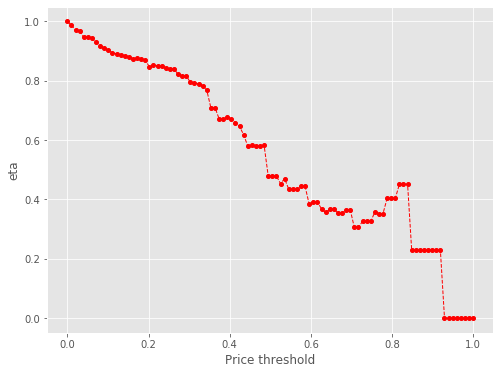

2212 239
Number of cells with price above 10.0th percentile:  239


eta =  1.0
eta =  0.9830186368444485
eta =  0.9798459526669054
eta =  0.9583088603970786
eta =  0.9592850286461804
eta =  0.9556133112919285
eta =  0.9410038609768259
eta =  0.9302789729537243
eta =  0.9251493813168078
eta =  0.91201962586441
eta =  0.9070418990495027
eta =  0.9028265231596898
eta =  0.8953904014742217
eta =  0.8939644895374519
eta =  0.896493762269378
eta =  0.8926580245849213
eta =  0.885763806261028
eta =  0.8805605761647101
eta =  0.8879771627002526
eta =  0.8649950088710681
eta =  0.8633261220864934
eta =  0.8633261220864934
eta =  0.8647166306577881
eta =  0.8534907186234705
eta =  0.8549178007570742
eta =  0.8514494121993632
eta =  0.8436134715650554
eta =  0.8263207576035628
eta =  0.8325340110839653
eta =  0.8178196129044492
eta =  0.8021764001532067
eta =  0.7998432697718594
eta =  0.8021631590165076
eta =  0.7926426654181947
eta =  0.7546559472318218
eta =  0.7184796620206303
eta =  0.6929128521763198
eta =  0.681076511629469
eta =  0.6857123864516542
eta = 

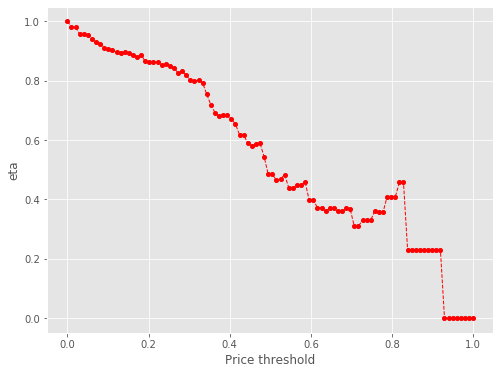

2212 230
Number of cells with price above 11.0th percentile:  230


eta =  1.0
eta =  0.9998608321874228
eta =  0.9749256465707516
eta =  0.9770727949981587
eta =  0.9751332013742959
eta =  0.9602253302848646
eta =  0.9492813697217691
eta =  0.9440469981872341
eta =  0.9306490470324422
eta =  0.9255696423954086
eta =  0.9212681608883416
eta =  0.9136801448369994
eta =  0.9122251064283148
eta =  0.9147562071966318
eta =  0.907896856295718
eta =  0.9038569114248518
eta =  0.8985473972507031
eta =  0.9061154791162599
eta =  0.8826638790044621
eta =  0.8809609026083155
eta =  0.8809609026083155
eta =  0.882379814482651
eta =  0.8750355319436579
eta =  0.8661628027018434
eta =  0.8676860403798343
eta =  0.860845590501
eta =  0.8431996459264911
eta =  0.8431996459264911
eta =  0.8345248521078642
eta =  0.8154882164777305
eta =  0.8240458118629
eta =  0.8185485907670951
eta =  0.8088336262605467
eta =  0.7851932871558502
eta =  0.7331557280227863
eta =  0.7218703719012398
eta =  0.6949885600360741
eta =  0.6997191298210601
eta =  0.6997191298210601
eta =  0.6

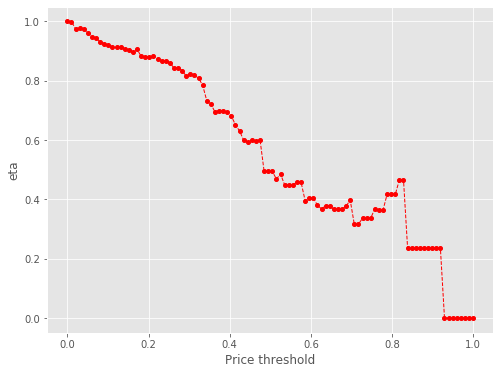

2212 219
Number of cells with price above 12.0th percentile:  219


eta =  1.0
eta =  0.9750613437250865
eta =  0.9772087910080345
eta =  0.9752689274175992
eta =  0.960358981343587
eta =  0.9494134975214504
eta =  0.944178397429487
eta =  0.9307785814516164
eta =  0.9256984698265603
eta =  0.9213963896083999
eta =  0.9138073174024793
eta =  0.9123520764710975
eta =  0.9148835295362002
eta =  0.9062821936104026
eta =  0.9039827167221456
eta =  0.9002284686534683
eta =  0.9062415987772282
eta =  0.882786734503275
eta =  0.8757602609289605
eta =  0.8810835210746413
eta =  0.879926738743695
eta =  0.8751573256743328
eta =  0.8662833614623301
eta =  0.8626069729553052
eta =  0.8689625240395414
eta =  0.8410920405463451
eta =  0.8433170085098746
eta =  0.8434156426630072
eta =  0.807624069937586
eta =  0.8241605084780774
eta =  0.8162949161497051
eta =  0.8089462055344635
eta =  0.7946351763795513
eta =  0.7332577739032355
eta =  0.7337010922224404
eta =  0.6950852935359301
eta =  0.6950852935359301
eta =  0.6998165217555982
eta =  0.6938884152622793
eta = 

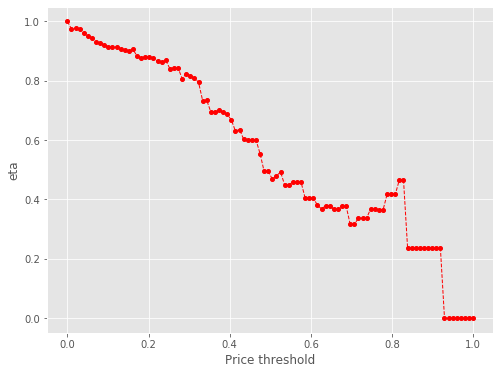

2212 207
Number of cells with price above 13.0th percentile:  207


eta =  1.0
eta =  1.0022023714679775
eta =  0.9952093084787642
eta =  0.9777730365499323
eta =  0.9736961716627469
eta =  0.9640368525923887
eta =  0.9573133913968064
eta =  0.9493745965664662
eta =  0.9449624841944129
eta =  0.9371793100846408
eta =  0.9356868491838504
eta =  0.9382830479577979
eta =  0.9294617199653074
eta =  0.9271034305068491
eta =  0.9232531619131474
eta =  0.9294200868583898
eta =  0.9053653292527329
eta =  0.8981591430783628
eta =  0.903618553586161
eta =  0.9024321848121443
eta =  0.8975407868503081
eta =  0.8884398576943014
eta =  0.8846694400373161
eta =  0.8911875438726664
eta =  0.8626042309636334
eta =  0.8648861058198647
eta =  0.8649872626893964
eta =  0.8282802668108761
eta =  0.8452396495685971
eta =  0.8371728829195132
eta =  0.8296362180085992
eta =  0.8149591628191903
eta =  0.7520119412199504
eta =  0.7524665980700632
eta =  0.7274985464472664
eta =  0.7128631424156897
eta =  0.7177153788930308
eta =  0.7177153788930308
eta =  0.703286883435831
eta

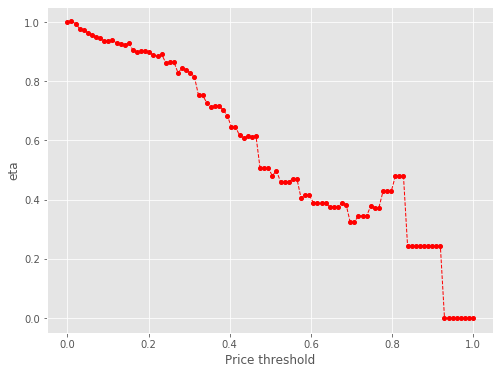

2212 197
Number of cells with price above 14.000000000000002th percentile:  197


eta =  1.0
eta =  0.9903152902894498
eta =  0.9777300446047447
eta =  0.9718574464941053
eta =  0.9619183510614868
eta =  0.9499169584379901
eta =  0.945481210952679
eta =  0.9428858991924729
eta =  0.9377477690879702
eta =  0.9336306476837622
eta =  0.9362721469452138
eta =  0.9292008343118682
eta =  0.9250660913412855
eta =  0.9196319883744142
eta =  0.9273776567670861
eta =  0.9033757602534881
eta =  0.8961854099015777
eta =  0.9016328231817934
eta =  0.9004490614907498
eta =  0.895568412530928
eta =  0.8864874829551218
eta =  0.8827253509104105
eta =  0.8892291310060441
eta =  0.860708630832845
eta =  0.8629854911967743
eta =  0.8640001893773972
eta =  0.8408862322271694
eta =  0.8384460540638856
eta =  0.8353331689818921
eta =  0.8377559941873498
eta =  0.8131682642353735
eta =  0.7704972917380335
eta =  0.7503593711501996
eta =  0.7236581346765879
eta =  0.7112966030718149
eta =  0.7161381766057449
eta =  0.7161381766057449
eta =  0.7100718102898997
eta =  0.6972984189564597
eta 

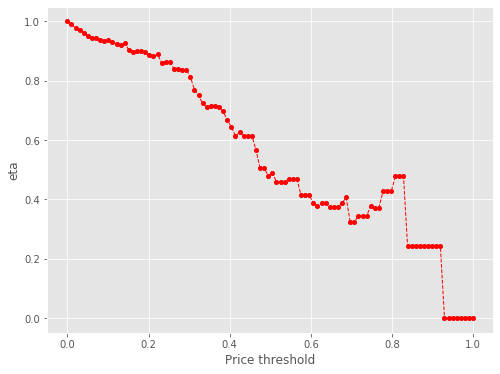

2212 190
Number of cells with price above 15.000000000000002th percentile:  190


eta =  1.0
eta =  0.9814956871066506
eta =  0.9790757898196348
eta =  0.9690878585234596
eta =  0.957716938795441
eta =  0.9538532816193892
eta =  0.9536874164395167
eta =  0.9502807606749151
eta =  0.9430439568958892
eta =  0.9440371236185384
eta =  0.9342235979613573
eta =  0.9360836027878255
eta =  0.9275536011131317
eta =  0.9285842949370662
eta =  0.9122102517365445
eta =  0.9104502697502164
eta =  0.9104502697502164
eta =  0.9119166784125255
eta =  0.9043265526771488
eta =  0.8951568168719468
eta =  0.8967310435495603
eta =  0.8871245641355271
eta =  0.8691258625132171
eta =  0.8714249892522011
eta =  0.871526910907956
eta =  0.8345423955206982
eta =  0.8516299979667584
eta =  0.8435022433489244
eta =  0.8359085982495331
eta =  0.8211205786772214
eta =  0.7576974510116715
eta =  0.7576974510116715
eta =  0.7307350919171174
eta =  0.7182526716960179
eta =  0.7231415930137074
eta =  0.7231415930137074
eta =  0.7170159011503898
eta =  0.7041175934511251
eta =  0.6731405184971463
eta

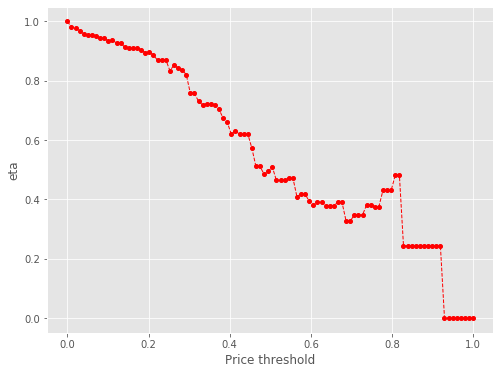

2212 184
Number of cells with price above 16.0th percentile:  184


eta =  1.0
eta =  0.9916783578053696
eta =  0.98475995947123
eta =  0.9695337770594253
eta =  0.9650427933690096
eta =  0.9643622024253558
eta =  0.959107040090051
eta =  0.9573950187717891
eta =  0.9530536805081641
eta =  0.9535006299866067
eta =  0.9461365091989691
eta =  0.9405786325674209
eta =  0.9485007256189882
eta =  0.9239521330437228
eta =  0.916598006624485
eta =  0.9221694967410824
eta =  0.9209587722700735
eta =  0.915966955779669
eta =  0.9066791880303643
eta =  0.9028313651415503
eta =  0.909483283154628
eta =  0.8890613167250218
eta =  0.8826418866422818
eta =  0.8934602714957318
eta =  0.8735613131158395
eta =  0.8568518759041369
eta =  0.8543597218796548
eta =  0.8568377322658828
eta =  0.8466683321218625
eta =  0.821922171934253
eta =  0.7674504586320026
eta =  0.7679144494132835
eta =  0.7274979499677361
eta =  0.7324498010033531
eta =  0.7324498010033531
eta =  0.7262452598323825
eta =  0.719898815260482
eta =  0.6997618021451092
eta =  0.6600808677095822
eta =  0.

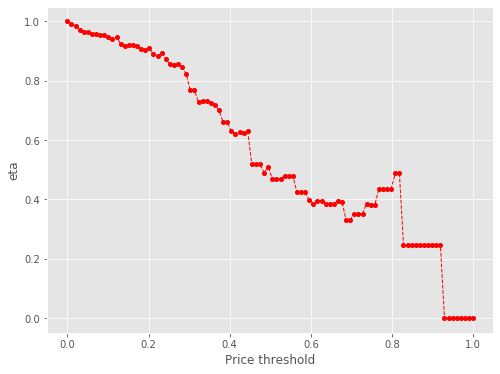

2212 174
Number of cells with price above 17.0th percentile:  174


eta =  1.0
eta =  0.9902087863463839
eta =  0.9781846806485445
eta =  0.9742384517495911
eta =  0.9724546218388129
eta =  0.9671553609504996
eta =  0.9654289732515177
eta =  0.9642125088114464
eta =  0.9544079424665276
eta =  0.9560890101881395
eta =  0.9512123546377103
eta =  0.9564600438775981
eta =  0.9317054524497962
eta =  0.9242896140770471
eta =  0.9299078572026986
eta =  0.9286869729699437
eta =  0.9236532677860859
eta =  0.9142875619841977
eta =  0.9104074501933854
eta =  0.9171151875970722
eta =  0.8965218507869385
eta =  0.890048552229787
eta =  0.9009577192679701
eta =  0.8808917793154943
eta =  0.860797451639029
eta =  0.8615290584443052
eta =  0.8640278629878588
eta =  0.8537731265967918
eta =  0.8288193096733552
eta =  0.7738904984579941
eta =  0.7743583828054026
eta =  0.7336027293947636
eta =  0.7336027293947636
eta =  0.7385961337547979
eta =  0.7385961337547979
eta =  0.7237478648253749
eta =  0.6974265701726622
eta =  0.6875264667928844
eta =  0.6659293639952377
eta

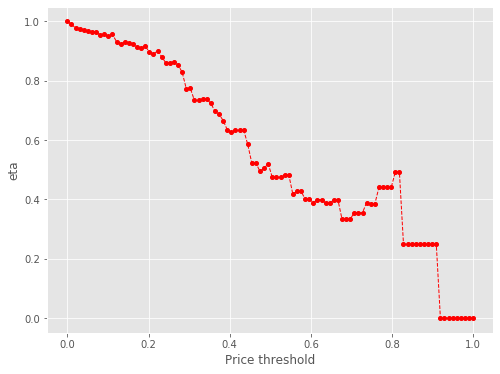

2212 168
Number of cells with price above 18.000000000000004th percentile:  168


eta =  1.0
eta =  0.9878569995907578
eta =  0.983871750264185
eta =  0.9820702817906927
eta =  0.9767186216545851
eta =  0.9749751633831716
eta =  0.9705541073928141
eta =  0.9638451563210703
eta =  0.9635099196802192
eta =  0.9578499866633765
eta =  0.9659175489713538
eta =  0.9409181834141768
eta =  0.9334290170131073
eta =  0.939102813492314
eta =  0.9378698571202949
eta =  0.9327863785112727
eta =  0.9287781833198765
eta =  0.9255975641299887
eta =  0.9261836495927205
eta =  0.9176599252343602
eta =  0.8988493785374674
eta =  0.8988493785374674
eta =  0.889602063182815
eta =  0.8629965464971756
eta =  0.8784314242275464
eta =  0.8725713959536754
eta =  0.8622152604270413
eta =  0.8469618509353319
eta =  0.7815427505076493
eta =  0.7820152613092701
eta =  0.756066737528595
eta =  0.7408566147969351
eta =  0.7458993940864007
eta =  0.7458993940864007
eta =  0.7395809221669989
eta =  0.7262766951794093
eta =  0.6943247487529176
eta =  0.6808152912461749
eta =  0.6471396751774461
eta =

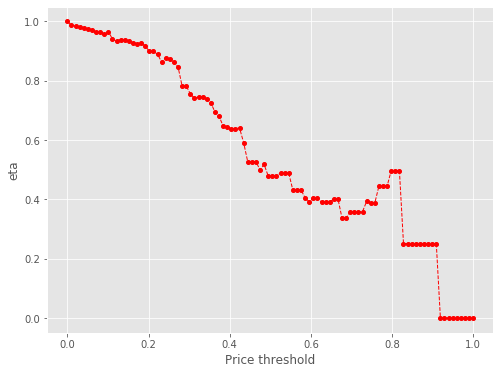

2212 161
Number of cells with price above 19.0th percentile:  161


eta =  1.0
eta =  0.9889910526458514
eta =  0.990796200590877
eta =  0.9872558498085914
eta =  0.9817069103097543
eta =  0.9827407949209487
eta =  0.9727478242473595
eta =  0.9744611953288955
eta =  0.9714025483945786
eta =  0.9748393587934729
eta =  0.9496090836877403
eta =  0.9420507427298698
eta =  0.9477769458903825
eta =  0.9465326011733833
eta =  0.9414021684227443
eta =  0.9373569510701236
eta =  0.9341469537210347
eta =  0.934738452630332
eta =  0.926135997900231
eta =  0.9071517054002326
eta =  0.9071517054002326
eta =  0.8978189761414149
eta =  0.8709677145054522
eta =  0.8865451582797722
eta =  0.8780841816569078
eta =  0.8701792119956312
eta =  0.8547849126124721
eta =  0.7887615610524114
eta =  0.7887615610524114
eta =  0.7606937980941477
eta =  0.7476996231155191
eta =  0.7527889806226011
eta =  0.7527889806226011
eta =  0.7464121474021842
eta =  0.7329850343741245
eta =  0.7182107509583978
eta =  0.6871037208941894
eta =  0.6787258478326358
eta =  0.6471534783074172
eta 

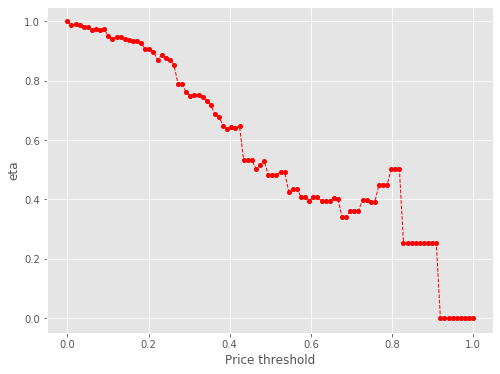

2212 153
Number of cells with price above 20.0th percentile:  153


eta =  1.0
eta =  0.9945506342719694
eta =  0.9927753455744696
eta =  0.988273574089952
eta =  0.9887370404901474
eta =  0.9811007802042123
eta =  0.9770262601485468
eta =  0.9819066267373572
eta =  0.9580965852041875
eta =  0.9504706886263847
eta =  0.9562480719607639
eta =  0.9549926054275838
eta =  0.9577882444475317
eta =  0.9453540594226728
eta =  0.9442756944459172
eta =  0.9418387362298072
eta =  0.9430930420824166
eta =  0.9128449492881292
eta =  0.9152597275405977
eta =  0.9163358897586265
eta =  0.8918218343781996
eta =  0.8885166525079145
eta =  0.8859324014679895
eta =  0.8885019861945537
eta =  0.8779567780575649
eta =  0.8522961288477832
eta =  0.7958114251075755
eta =  0.7962925625682868
eta =  0.7543824800869322
eta =  0.7543824800869322
eta =  0.7595173257114946
eta =  0.7595173257114946
eta =  0.7530834970573164
eta =  0.7395363739702284
eta =  0.7070010788707465
eta =  0.6932449783581539
eta =  0.6898663649377352
eta =  0.6544991870866647
eta =  0.6440175617708156
et

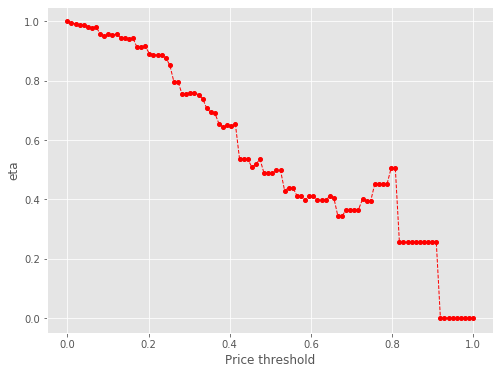

2212 150
Number of cells with price above 21.000000000000004th percentile:  150


eta =  1.0
eta =  0.9984074969595139
eta =  1.0046009522211867
eta =  0.9991494152520642
eta =  0.989248717433933
eta =  0.9825495054410589
eta =  0.9902323413925858
eta =  0.9833939963880026
eta =  0.966053475050538
eta =  0.9641896101019892
eta =  0.9641896101019892
eta =  0.9629237170532943
eta =  0.9577044405400362
eta =  0.9479934609461902
eta =  0.9503235872023602
eta =  0.9509253291050346
eta =  0.9295728034371784
eta =  0.9228608618576448
eta =  0.9228608618576448
eta =  0.9133665176195149
eta =  0.8860502723787071
eta =  0.9018974709250247
eta =  0.8932899754732149
eta =  0.8852481153619056
eta =  0.8695872327202654
eta =  0.8428233606137763
eta =  0.8024205540261371
eta =  0.7910879563735401
eta =  0.7606475460403707
eta =  0.7658250360096093
eta =  0.7658250360096093
eta =  0.7593377750953832
eta =  0.752702144727062
eta =  0.7301752249650038
eta =  0.7128726473458877
eta =  0.690479351102068
eta =  0.6563507878603116
eta =  0.6692019594248134
eta =  0.6558024744794801
eta =

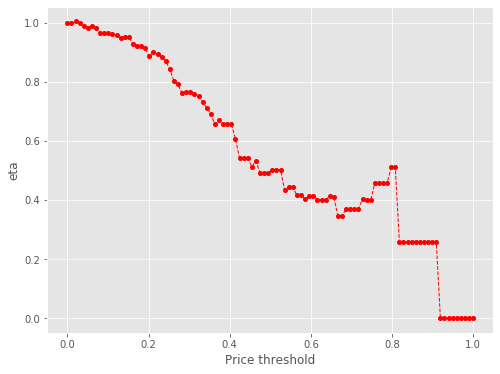

2212 144
Number of cells with price above 22.0th percentile:  144


eta =  1.0
eta =  0.9987399752091816
eta =  0.9885843173445772
eta =  0.9882404761335992
eta =  0.9824352687504668
eta =  0.9907099024139366
eta =  0.9650688743179705
eta =  0.9573874823376025
eta =  0.9632069090187074
eta =  0.9619423061669378
eta =  0.9647582896947421
eta =  0.9593372670715303
eta =  0.947027266961879
eta =  0.943008212325737
eta =  0.9499561469636374
eta =  0.9286253837685197
eta =  0.9219202829931101
eta =  0.9332200961750593
eta =  0.9124356153811024
eta =  0.8916217303277166
eta =  0.9009782579274968
eta =  0.8949678194117743
eta =  0.884345871370864
eta =  0.8687009502851002
eta =  0.8016027278025112
eta =  0.8016027278025112
eta =  0.7730780170893792
eta =  0.7598722948245746
eta =  0.7650445079012309
eta =  0.7650445079012309
eta =  0.7585638587968202
eta =  0.7519349914563132
eta =  0.729431031108276
eta =  0.6894550888267399
eta =  0.6897756152401561
eta =  0.6556818357958158
eta =  0.6685199094591521
eta =  0.6551340812554318
eta =  0.6551340812554318
eta =

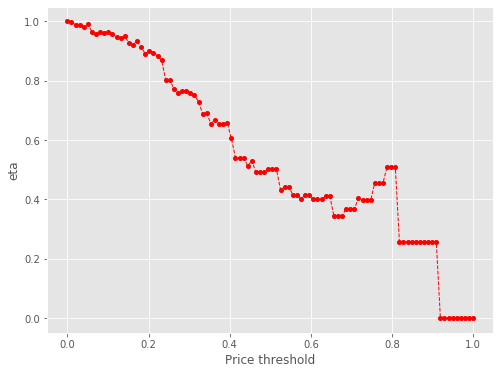

2212 137
Number of cells with price above 23.0th percentile:  137


eta =  1.0
eta =  0.9909057226122774
eta =  0.9915749914577229
eta =  0.9884626275972577
eta =  0.9919597963488314
eta =  0.9662864191611447
eta =  0.9585953362256098
eta =  0.9644221047795429
eta =  0.9631559064865339
eta =  0.9600280123481075
eta =  0.9534349699454434
eta =  0.9523473870774637
eta =  0.9498895976805958
eta =  0.9511546253715071
eta =  0.9206479711113659
eta =  0.9230833909496995
eta =  0.9343974601393126
eta =  0.9135867573439191
eta =  0.8927466131922581
eta =  0.9021149451225189
eta =  0.8960969237506762
eta =  0.8854615749065633
eta =  0.86979691596219
eta =  0.8026140413921242
eta =  0.8026140413921242
eta =  0.792960145475912
eta =  0.7608309606966746
eta =  0.7660096991121196
eta =  0.7660096991121196
eta =  0.7595208739271124
eta =  0.7528836435117396
eta =  0.72331209541386
eta =  0.7130445420588623
eta =  0.690645846127953
eta =  0.6565090534785956
eta =  0.6600938627696605
eta =  0.655960607883165
eta =  0.655960607883165
eta =  0.6581740072300315
eta =  0.

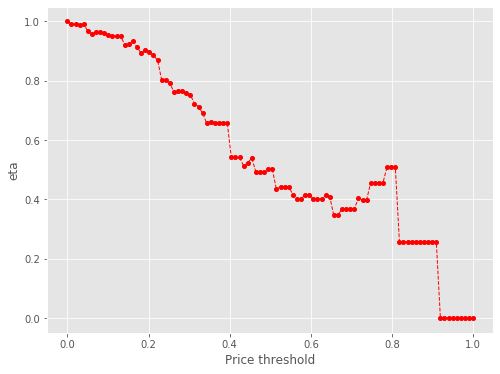

2212 129
Number of cells with price above 24.000000000000004th percentile:  129


eta =  1.0
eta =  1.0019909632239297
eta =  0.9968801788302
eta =  1.0023798102872548
eta =  0.9764367478269121
eta =  0.9686648741257788
eta =  0.9745528498070285
eta =  0.9732733507694625
eta =  0.9761225047220927
eta =  0.9634503009223434
eta =  0.9581826222601728
eta =  0.9541162258166789
eta =  0.961146002532605
eta =  0.9395639770449149
eta =  0.9327798946138869
eta =  0.9397936333749306
eta =  0.9231835038859887
eta =  0.8955736599646867
eta =  0.9115911863339431
eta =  0.9028911763624863
eta =  0.8947628812563019
eta =  0.8789336733401437
eta =  0.8518821395339551
eta =  0.8110450781430726
eta =  0.8115354256765569
eta =  0.7688230882450128
eta =  0.7688230882450128
eta =  0.774056226573308
eta =  0.774056226573308
eta =  0.7674992397056192
eta =  0.7536927936605705
eta =  0.7205346985090711
eta =  0.7065152747320484
eta =  0.7030719869139471
eta =  0.6654363869913839
eta =  0.6563455326634894
eta =  0.6628511277433021
eta =  0.6586562902837909
eta =  0.6650877776817053
eta =  

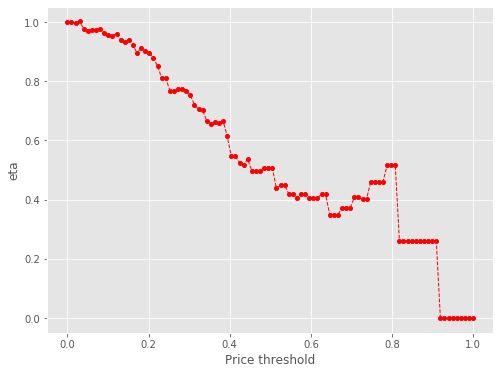

2212 125
Number of cells with price above 25.0th percentile:  125


eta =  1.0
eta =  1.0078192863657065
eta =  1.0008594894631437
eta =  0.9832109931365585
eta =  0.9813140251586325
eta =  0.9813140251586325
eta =  0.9800256493142758
eta =  0.9747136762438551
eta =  0.9701344498921828
eta =  0.9717565665835833
eta =  0.9665269801850271
eta =  0.9589073124056507
eta =  0.9367731844884881
eta =  0.939251260875023
eta =  0.9403556323335003
eta =  0.9295882930697845
eta =  0.9083831323408861
eta =  0.9179155512578165
eta =  0.9117921238222295
eta =  0.9009704961018982
eta =  0.8850314695643905
eta =  0.8385894782102722
eta =  0.8166718822640257
eta =  0.8041009745106912
eta =  0.7741569679981893
eta =  0.7794264123779049
eta =  0.7794264123779049
eta =  0.7794264123779049
eta =  0.772823934967554
eta =  0.7589217036577949
eta =  0.7255335669075368
eta =  0.7114168802858118
eta =  0.7079497038989903
eta =  0.6700529987007205
eta =  0.6608990745657665
eta =  0.6674498036463775
eta =  0.6632258635767401
eta =  0.6697019708370637
eta =  0.6177967231701931
eta

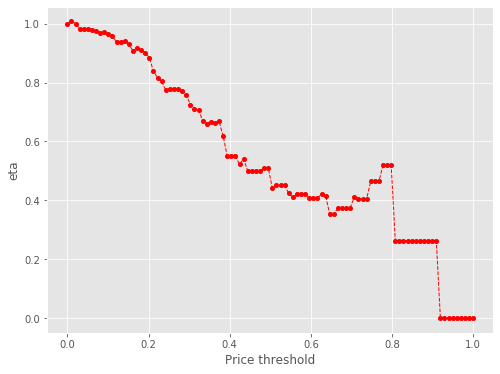

2212 116
Number of cells with price above 26.0th percentile:  116


eta =  1.0
eta =  0.993094201513388
eta =  0.9678175577138665
eta =  0.9737003830293282
eta =  0.9737003830293282
eta =  0.9726728965928019
eta =  0.9671512437103349
eta =  0.9573444749471683
eta =  0.9596975855847113
eta =  0.9603052630736411
eta =  0.9514675154347988
eta =  0.9295051177940666
eta =  0.9319639677288313
eta =  0.9320729700088511
eta =  0.9080983138061702
eta =  0.9047328096577757
eta =  0.902101393918281
eta =  0.9047178756721752
eta =  0.8939802088436755
eta =  0.8781648471482415
eta =  0.8320831815337716
eta =  0.8103356358747839
eta =  0.7978622610114526
eta =  0.7681505786517284
eta =  0.7733791394175356
eta =  0.7733791394175356
eta =  0.7733791394175356
eta =  0.766827888117156
eta =  0.7530335189303032
eta =  0.7199044280288392
eta =  0.7058972674071854
eta =  0.6972902441572768
eta =  0.6648543124402752
eta =  0.6557714101195982
eta =  0.662271314585838
eta =  0.662271314585838
eta =  0.6645060080682458
eta =  0.6130034734679742
eta =  0.5466062450592286
eta = 

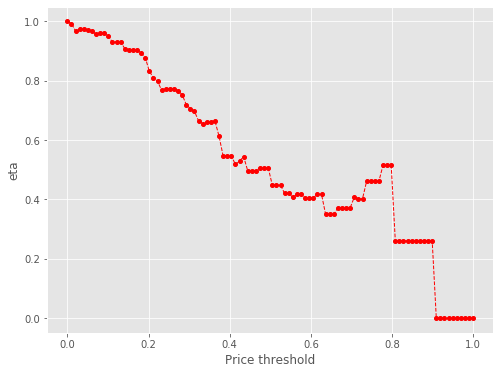

2212 110
Number of cells with price above 27.0th percentile:  110


eta =  1.0
eta =  0.9980706399835152
eta =  0.9980706399835152
eta =  0.9967602642316671
eta =  0.9913575855518093
eta =  0.9867001657470692
eta =  0.988349981201457
eta =  0.9830310960027945
eta =  0.9843402603104223
eta =  0.9527692336922228
eta =  0.9552896249447956
eta =  0.9624726183917885
eta =  0.9454616552895617
eta =  0.91718553399164
eta =  0.9335895933481767
eta =  0.9246796358001647
eta =  0.9273616041593531
eta =  0.9163551896706287
eta =  0.8895722435605421
eta =  0.8306171187719804
eta =  0.8311192993121697
eta =  0.8035414245956674
eta =  0.7873762329777638
eta =  0.7927356567601458
eta =  0.7927356567601458
eta =  0.7860204374873341
eta =  0.7791516351490639
eta =  0.7718808159749573
eta =  0.7379225537267434
eta =  0.7235648149298133
eta =  0.6877746509577081
eta =  0.6831244335843022
eta =  0.672184382781788
eta =  0.6788469700863843
eta =  0.6745509033223599
eta =  0.6811375945875421
eta =  0.6283460289630702
eta =  0.5602869777332914
eta =  0.5602869777332914
eta =

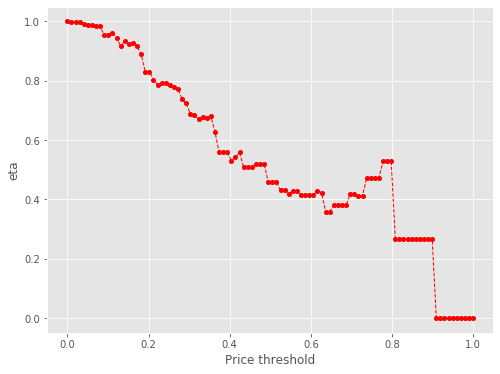

2212 109
Number of cells with price above 28.000000000000004th percentile:  109


eta =  1.0
eta =  1.0060784445049311
eta =  1.0047575552358528
eta =  1.0014945577850805
eta =  0.9946167417207715
eta =  0.989178660086063
eta =  0.9849807206829606
eta =  0.9922379020918254
eta =  0.9699577244326864
eta =  0.9629541852188269
eta =  0.9629541852188269
eta =  0.9630668121071811
eta =  0.9221976675225029
eta =  0.9355720867582153
eta =  0.9320986034280914
eta =  0.9348020899819772
eta =  0.9237073679004066
eta =  0.9073661044366684
eta =  0.8372813960814278
eta =  0.8372813960814278
eta =  0.8272105188808109
eta =  0.7936935763660022
eta =  0.7990960003292106
eta =  0.7990960003292106
eta =  0.7990960003292106
eta =  0.7923269029428658
eta =  0.7780738352268417
eta =  0.7623907273584546
eta =  0.7201421593097642
eta =  0.720476952086283
eta =  0.6869624415688046
eta =  0.677577509203936
eta =  0.6842935523408198
eta =  0.6842935523408198
eta =  0.686602555173633
eta =  0.686602555173633
eta =  0.5647823194594614
eta =  0.5647823194594614
eta =  0.5647823194594614
eta = 

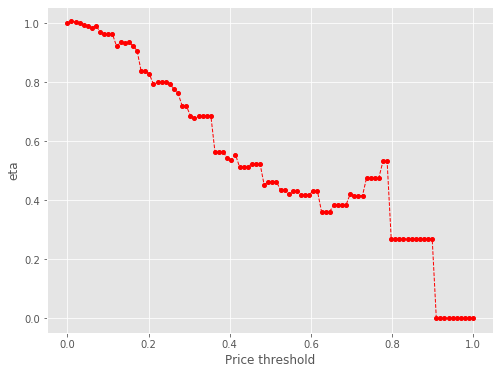

2212 107
Number of cells with price above 29.000000000000004th percentile:  107


eta =  1.0
eta =  1.0016106411421146
eta =  0.9932739686323035
eta =  0.9832023193507697
eta =  0.9856189874332266
eta =  0.9862430782721756
eta =  0.9771666233453051
eta =  0.954611022029422
eta =  0.9571362854242199
eta =  0.9688677348938475
eta =  0.9472893174226401
eta =  0.9189585358475116
eta =  0.9353943057212829
eta =  0.9264671244266209
eta =  0.9291542772710657
eta =  0.9181265863964937
eta =  0.8912918664506901
eta =  0.8322227761210363
eta =  0.8327259274212264
eta =  0.8026084633020053
eta =  0.7888983018183648
eta =  0.7942680858473495
eta =  0.7942680858473495
eta =  0.7942680858473495
eta =  0.7783006232494005
eta =  0.7733729307854463
eta =  0.7393490241722083
eta =  0.7249635305791222
eta =  0.716124031899733
eta =  0.6828120066789062
eta =  0.6734837754498924
eta =  0.6801592421329983
eta =  0.6801592421329983
eta =  0.6824542946166537
eta =  0.6824542946166537
eta =  0.5613700626866907
eta =  0.5613700626866907
eta =  0.5613700626866907
eta =  0.538143763960297
eta 

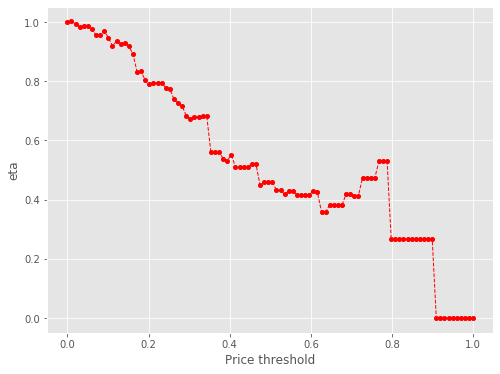

2212 103
Number of cells with price above 30.0th percentile:  103


eta =  1.0
eta =  0.9943809525337927
eta =  0.9816212797316587
eta =  0.9774554128206694
eta =  0.9846571489571878
eta =  0.9755952894340894
eta =  0.9555971613209084
eta =  0.9555971613209084
eta =  0.9557089277335289
eta =  0.9311263105892653
eta =  0.9241918311060416
eta =  0.9338901438334094
eta =  0.9249773179028837
eta =  0.9166501918845172
eta =  0.9130012265523935
eta =  0.8712238262162473
eta =  0.8308845193298575
eta =  0.8313868615370213
eta =  0.8038001086756823
eta =  0.7876297129978586
eta =  0.7929908621394667
eta =  0.7929908621394667
eta =  0.7862734810362049
eta =  0.7770490760380915
eta =  0.7721293075556647
eta =  0.7381601131245419
eta =  0.7237977521409539
eta =  0.7149724678275706
eta =  0.6817140100471683
eta =  0.6724007790910983
eta =  0.6790655112823358
eta =  0.6790655112823358
eta =  0.6813568732042085
eta =  0.6813568732042085
eta =  0.560467350912499
eta =  0.560467350912499
eta =  0.560467350912499
eta =  0.537278401262454
eta =  0.5308534107653973
eta =

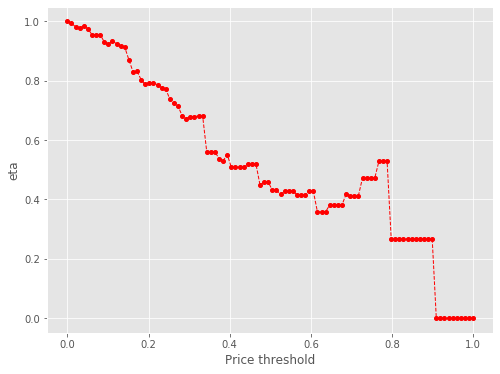

2212 99
Number of cells with price above 31.0th percentile:  99


eta =  1.0
eta =  1.0016720534886487
eta =  0.9962814744826797
eta =  0.9976082851522985
eta =  0.9752075183799711
eta =  0.9681660732483091
eta =  0.9681660732483091
eta =  0.9682793097178253
eta =  0.9271889651958024
eta =  0.9398771218590114
eta =  0.937143488873394
eta =  0.939861607763298
eta =  0.9287068366678751
eta =  0.9122771278380534
eta =  0.8841993600691387
eta =  0.8418130933859607
eta =  0.8423220428699298
eta =  0.7979893591906012
eta =  0.7979893591906012
eta =  0.80342102320408
eta =  0.80342102320408
eta =  0.7966152887916131
eta =  0.7896539011515599
eta =  0.7822850778488886
eta =  0.747869088648661
eta =  0.7333178203957978
eta =  0.7243764576492013
eta =  0.6906805533760685
eta =  0.6812448260539726
eta =  0.6879972190664453
eta =  0.6879972190664453
eta =  0.690318719133716
eta =  0.690318719133716
eta =  0.5678391442339287
eta =  0.5678391442339287
eta =  0.5678391442339287
eta =  0.5443451917253178
eta =  0.5378356937150949
eta =  0.5576360109661234
eta =  0.5

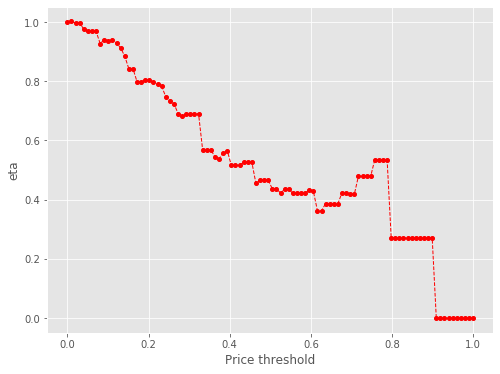

2212 93
Number of cells with price above 32.0th percentile:  93


eta =  1.0
eta =  1.0006331968508178
eta =  0.9914243087890044
eta =  0.9685396022203709
eta =  0.9711017113385955
eta =  0.983004332553492
eta =  0.9611110677662515
eta =  0.9323669161860266
eta =  0.9490424978086714
eta =  0.9399850614072986
eta =  0.9427114220788221
eta =  0.9315228278906251
eta =  0.9150433014929441
eta =  0.8443656085485239
eta =  0.8443656085485239
eta =  0.831368415421554
eta =  0.8004089936140876
eta =  0.8004089936140876
eta =  0.8058571273223969
eta =  0.8058571273223969
eta =  0.7990307568086187
eta =  0.7920482611011769
eta =  0.7846570943194625
eta =  0.7501367502036861
eta =  0.7355413601224244
eta =  0.7319566101593331
eta =  0.6927748099264018
eta =  0.6833104719337799
eta =  0.6900833393077034
eta =  0.6900833393077034
eta =  0.6924118785433692
eta =  0.6924118785433692
eta =  0.5695609255140514
eta =  0.5695609255140514
eta =  0.5695609255140514
eta =  0.5633175823651188
eta =  0.5394664996195905
eta =  0.5512316890067538
eta =  0.567429473859386
eta 

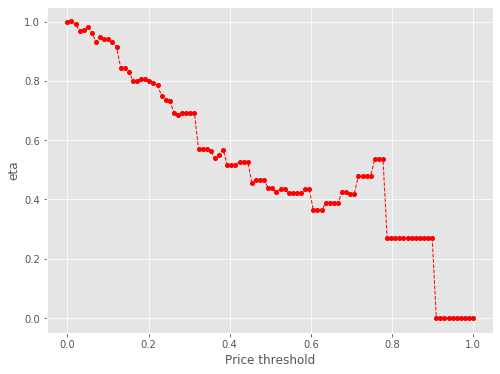

2212 90
Number of cells with price above 33.0th percentile:  90


eta =  1.0
eta =  0.9775455285348722
eta =  0.9704872018985943
eta =  0.9704872018985943
eta =  0.9706007098467554
eta =  0.9294118533250297
eta =  0.9421304291949885
eta =  0.9393902424640814
eta =  0.942114877905024
eta =  0.9309333638163354
eta =  0.9272275405904662
eta =  0.8847991680545119
eta =  0.8438312972284974
eta =  0.8443414668928275
eta =  0.8138038998540964
eta =  0.799902497871474
eta =  0.8053471840216593
eta =  0.8053471840216593
eta =  0.8053471840216593
eta =  0.7985251332089719
eta =  0.7841605663183342
eta =  0.7694058979489098
eta =  0.7257757013631189
eta =  0.7261131131630641
eta =  0.6902232675598594
eta =  0.6939921703180885
eta =  0.6828780756867625
eta =  0.689646657216177
eta =  0.689646657216177
eta =  0.6919737229611415
eta =  0.6919737229611415
eta =  0.5692005095439242
eta =  0.5692005095439242
eta =  0.5692005095439242
eta =  0.5456502314856138
eta =  0.5391251272867957
eta =  0.5589729147858798
eta =  0.5670704066636946
eta =  0.5167236787450501
eta =

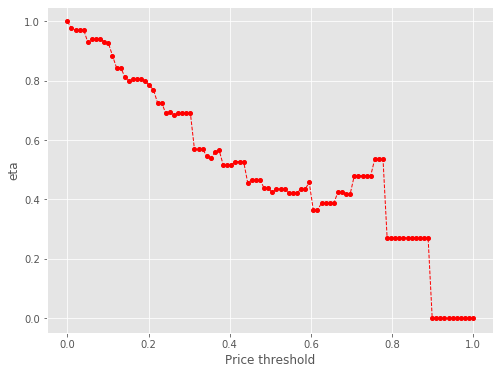

2212 87
Number of cells with price above 34.0th percentile:  87


eta =  1.0
eta =  0.9927795417909006
eta =  0.9927795417909006
eta =  0.9928956570457382
eta =  0.9507606819275369
eta =  0.9637714067466879
eta =  0.9609682772238983
eta =  0.9637554982396052
eta =  0.9523171419049931
eta =  0.9485261949693312
eta =  0.905123231836202
eta =  0.8632143185118105
eta =  0.8637362069041545
eta =  0.8324971841197116
eta =  0.8182764633687738
eta =  0.8238462153560246
eta =  0.8238462153560246
eta =  0.8238462153560246
eta =  0.8168674602867726
eta =  0.809729094852903
eta =  0.7854954687412494
eta =  0.7668819964503883
eta =  0.7519607945742626
eta =  0.7482960225074035
eta =  0.7082395698952741
eta =  0.6985639601975858
eta =  0.7054880177804169
eta =  0.7054880177804169
eta =  0.7078685368222791
eta =  0.7078685368222791
eta =  0.6530051896629125
eta =  0.5822751912097964
eta =  0.5822751912097964
eta =  0.5822751912097964
eta =  0.5515089697099089
eta =  0.5635367925347403
eta =  0.5718126659774695
eta =  0.5285929541506944
eta =  0.5285929541506944
eta

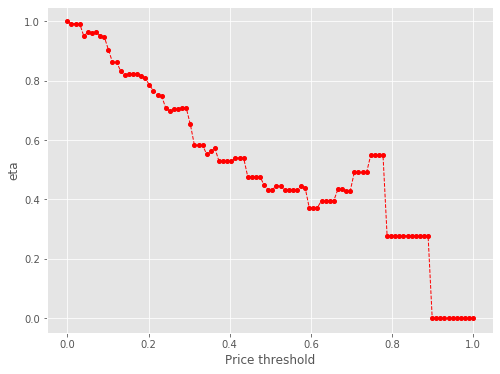

2212 85
Number of cells with price above 35.0th percentile:  85


eta =  1.0
eta =  1.0001169597578816
eta =  0.9576755381284704
eta =  0.9707808895901661
eta =  0.9772843428526998
eta =  0.967957372983717
eta =  0.9707648653809503
eta =  0.9592433181963879
eta =  0.9312068511284719
eta =  0.869492452427692
eta =  0.869492452427692
eta =  0.8590341384650932
eta =  0.8242277655043775
eta =  0.8242277655043775
eta =  0.8298380261441198
eta =  0.8298380261441198
eta =  0.8228085147818461
eta =  0.8156182322131779
eta =  0.8080071172337528
eta =  0.7724595080464592
eta =  0.7478467515524794
eta =  0.7481944241434061
eta =  0.7112131578959044
eta =  0.7150966740832956
eta =  0.7036445966014049
eta =  0.7106190126639484
eta =  0.7061218772907126
eta =  0.7130168451551054
eta =  0.6577544783859461
eta =  0.5865100626060598
eta =  0.5865100626060598
eta =  0.5865100626060598
eta =  0.5622436137417797
eta =  0.5555200792262778
eta =  0.567635380074575
eta =  0.5843151826776459
eta =  0.5324373961183285
eta =  0.5324373961183285
eta =  0.5324373961183285
eta =

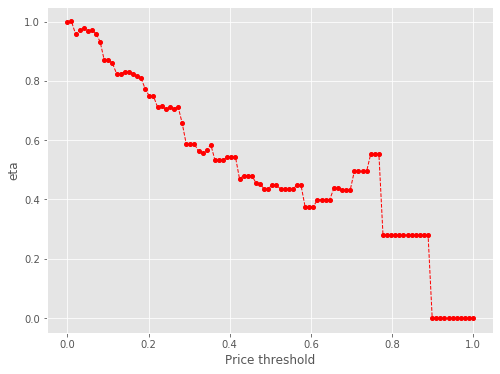

2212 80
Number of cells with price above 36.00000000000001th percentile:  80


eta =  1.0
eta =  0.9575635417284736
eta =  0.9706673605706903
eta =  0.9678441741634397
eta =  0.9706513382354429
eta =  0.959131138450658
eta =  0.959131138450658
eta =  0.9310979501376598
eta =  0.8693907686938811
eta =  0.8693907686938811
eta =  0.8589336777901027
eta =  0.8241313752982601
eta =  0.8241313752982601
eta =  0.8297409798400134
eta =  0.8297409798400134
eta =  0.822712290551537
eta =  0.8130603926457707
eta =  0.807912623968864
eta =  0.7723691719351146
eta =  0.7477592938065221
eta =  0.7481069257385022
eta =  0.7111299843051179
eta =  0.7150130463305147
eta =  0.7035623081241921
eta =  0.7105359085561176
eta =  0.7105359085561176
eta =  0.7129334606301645
eta =  0.7129334606301645
eta =  0.5864414725534182
eta =  0.5864414725534182
eta =  0.5864414725534182
eta =  0.5864414725534182
eta =  0.5554551133307086
eta =  0.5675689973420648
eta =  0.584246849307608
eta =  0.5323751296520622
eta =  0.5323751296520622
eta =  0.5323751296520622
eta =  0.5323751296520622
eta = 

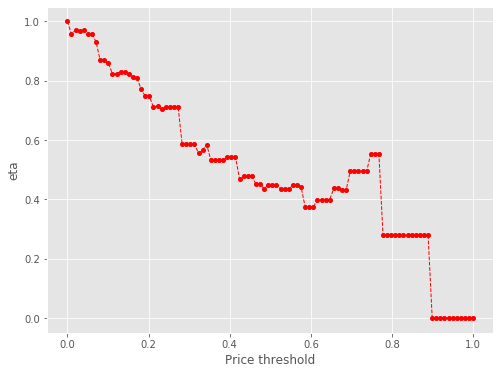

2212 75
Number of cells with price above 37.0th percentile:  75


eta =  1.0
eta =  1.0178852137856398
eta =  1.0081707588386286
eta =  1.0110948873380354
eta =  0.9990946822750271
eta =  0.981419745389565
eta =  0.9512139286985568
eta =  0.905615154173977
eta =  0.9061626775720005
eta =  0.8733892030958695
eta =  0.8584699646875815
eta =  0.8643133012686302
eta =  0.8643133012686302
eta =  0.8643133012686302
eta =  0.8569917517849759
eta =  0.8495027519221271
eta =  0.8415754363413158
eta =  0.8045510165378049
eta =  0.7888968895756793
eta =  0.7792778498316967
eta =  0.7430280910870274
eta =  0.744805067532311
eta =  0.7328772182618342
eta =  0.7401413835344811
eta =  0.7354574165454602
eta =  0.7426388329776585
eta =  0.7426388329776585
eta =  0.6108763788444119
eta =  0.6108763788444119
eta =  0.6108763788444119
eta =  0.6108763788444119
eta =  0.5785989295140923
eta =  0.5912175554894653
eta =  0.5998999374229376
eta =  0.5545572859515877
eta =  0.5545572859515877
eta =  0.5545572859515877
eta =  0.5545572859515877
eta =  0.5662214176874851
eta 

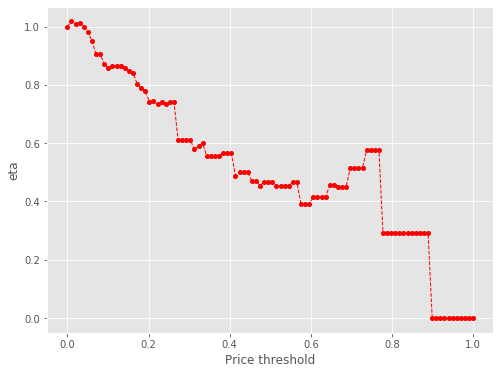

2212 71
Number of cells with price above 38.0th percentile:  71


eta =  1.0
eta =  0.9904562372893876
eta =  0.9933289860628288
eta =  0.9815396360452782
eta =  0.9528514990941864
eta =  0.8897026323880698
eta =  0.8897026323880698
eta =  0.8902405352779127
eta =  0.843385828835087
eta =  0.843385828835087
eta =  0.8491264924206365
eta =  0.8491264924206365
eta =  0.8491264924206365
eta =  0.8419335895426937
eta =  0.8267881534612275
eta =  0.8095989272662055
eta =  0.7904142880173897
eta =  0.7750352189925965
eta =  0.7655851949489146
eta =  0.7299723790304556
eta =  0.7419933872732244
eta =  0.7271363936821565
eta =  0.7271363936821565
eta =  0.7225347284594142
eta =  0.7295899605572358
eta =  0.6730430945674994
eta =  0.6001426983819599
eta =  0.6001426983819599
eta =  0.6001426983819599
eta =  0.5935641277032512
eta =  0.5684323946137424
eta =  0.5808292992985474
eta =  0.5893591235025767
eta =  0.5448131856529492
eta =  0.5448131856529492
eta =  0.5448131856529492
eta =  0.5448131856529492
eta =  0.5562723674722008
eta =  0.5562723674722008
eta

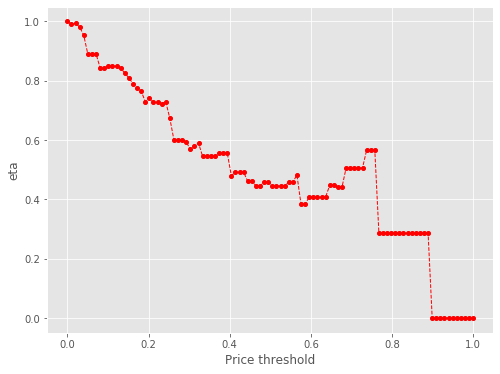

2212 69
Number of cells with price above 39.0th percentile:  69


eta =  1.0
eta =  0.9881314748860002
eta =  0.9592506737077315
eta =  0.8956777108805676
eta =  0.8956777108805676
eta =  0.8962192262268327
eta =  0.8490498522326843
eta =  0.8490498522326843
eta =  0.8548290690541962
eta =  0.8548290690541962
eta =  0.8548290690541962
eta =  0.8475878599695275
eta =  0.840181037962381
eta =  0.8150360440755302
eta =  0.7957225643341845
eta =  0.780240212323347
eta =  0.7707267236642289
eta =  0.7326317456048517
eta =  0.7366322160852775
eta =  0.7248352527934544
eta =  0.7320197073521869
eta =  0.7320197073521869
eta =  0.734489751929064
eta =  0.734489751929064
eta =  0.6041731458584461
eta =  0.6041731458584461
eta =  0.6041731458584461
eta =  0.6041731458584461
eta =  0.5722498815491011
eta =  0.5722498815491011
eta =  0.5933171504826089
eta =  0.5484720503449493
eta =  0.5484720503449493
eta =  0.5484720503449493
eta =  0.5484720503449493
eta =  0.5600081899120339
eta =  0.5600081899120339
eta =  0.5600081899120339
eta =  0.5600081899120339
eta =

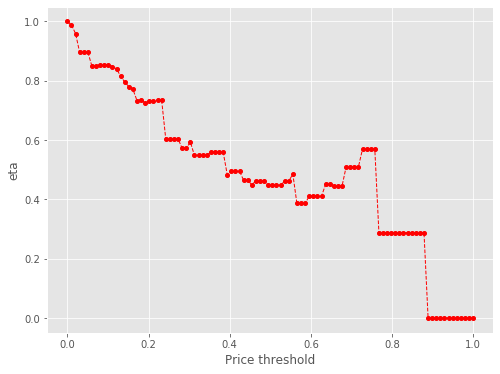

2212 68
Number of cells with price above 40.0th percentile:  68


eta =  1.0
eta =  0.9707723092399212
eta =  0.9064357665399749
eta =  0.9064357665399749
eta =  0.8924831367838141
eta =  0.859247857002671
eta =  0.859247857002671
eta =  0.8650964884534388
eta =  0.8650964884534388
eta =  0.8650964884534388
eta =  0.8577683046350819
eta =  0.8502725187043676
eta =  0.8248255063118601
eta =  0.8052800508413988
eta =  0.789611739078914
eta =  0.7799839831568435
eta =  0.7414314433100866
eta =  0.7454799637571125
eta =  0.7335413062083443
eta =  0.7408120538176758
eta =  0.7408120538176758
eta =  0.7433117662948662
eta =  0.7433117662948662
eta =  0.6857013918248454
eta =  0.6114299171860192
eta =  0.6114299171860192
eta =  0.6114299171860192
eta =  0.5861324265452641
eta =  0.5791232200301291
eta =  0.6004435295931235
eta =  0.6091417803944691
eta =  0.5550597914191793
eta =  0.5550597914191793
eta =  0.5550597914191793
eta =  0.5550597914191793
eta =  0.5667344924688706
eta =  0.5667344924688706
eta =  0.5667344924688706
eta =  0.4893633557606585
eta 

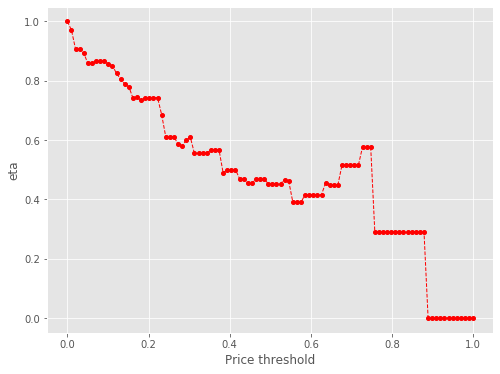

2212 62
Number of cells with price above 41.0th percentile:  62


eta =  1.0
eta =  0.9738637360523252
eta =  0.9744525216744714
eta =  0.9421186201730161
eta =  0.9231656109618791
eta =  0.9294493105749027
eta =  0.9294493105749027
eta =  0.9294493105749027
eta =  0.9215759976108026
eta =  0.9107642502435896
eta =  0.9049978843968979
eta =  0.8867564543435139
eta =  0.8376160476471288
eta =  0.8380054538200952
eta =  0.8442148659078158
eta =  0.7990238562624894
eta =  0.7881079977014084
eta =  0.7959196018901369
eta =  0.7959196018901369
eta =  0.7908826437844233
eta =  0.7986052630499846
eta =  0.7986052630499846
eta =  0.6569129832088112
eta =  0.6569129832088112
eta =  0.6569129832088112
eta =  0.6569129832088112
eta =  0.6222030545485119
eta =  0.6222030545485119
eta =  0.6451093399040272
eta =  0.6544546364327084
eta =  0.5963495949274936
eta =  0.5963495949274936
eta =  0.5963495949274936
eta =  0.5963495949274936
eta =  0.6088927539700214
eta =  0.6088927539700214
eta =  0.6088927539700214
eta =  0.5257661309497329
eta =  0.5379168833664589
e

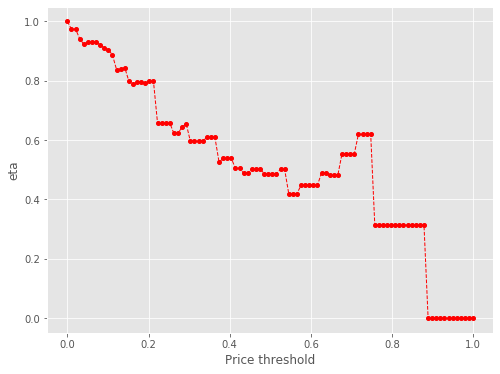

2212 60
Number of cells with price above 42.00000000000001th percentile:  60


eta =  1.0
eta =  0.9473684868458626
eta =  0.9473684868458626
eta =  0.9538169278660836
eta =  0.9538169278660836
eta =  0.9538169278660836
eta =  0.9457371981830296
eta =  0.9374726778621144
eta =  0.9287244522101245
eta =  0.9100047817822225
eta =  0.859576048105241
eta =  0.8599756634423712
eta =  0.8275281918334793
eta =  0.8199720750780854
eta =  0.8087700325790589
eta =  0.8167864356515301
eta =  0.8167864356515301
eta =  0.8116174222889722
eta =  0.8195425074971165
eta =  0.8195425074971165
eta =  0.6741354438490145
eta =  0.6741354438490145
eta =  0.6741354438490145
eta =  0.6741354438490145
eta =  0.6462435553397655
eta =  0.6385155158502088
eta =  0.6524408587137922
eta =  0.6716126459482216
eta =  0.6119842492713176
eta =  0.6119842492713176
eta =  0.6119842492713176
eta =  0.6119842492713176
eta =  0.6248562556169668
eta =  0.6248562556169668
eta =  0.6248562556169668
eta =  0.5395502800344458
eta =  0.5520195919264675
eta =  0.5520195919264675
eta =  0.5520195919264675
et

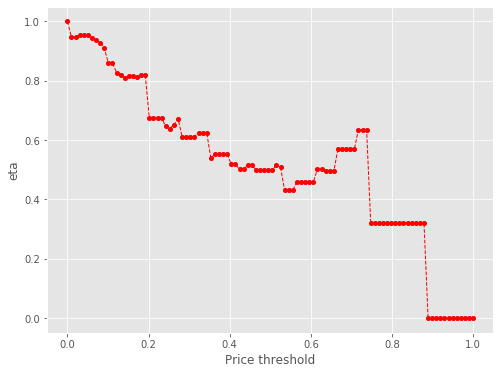

2212 54
Number of cells with price above 43.0th percentile:  54


eta =  1.0
eta =  1.006806687270853
eta =  1.006806687270853
eta =  0.998278084308816
eta =  0.998278084308816
eta =  0.9803201870290081
eta =  0.959938974057047
eta =  0.9371918059248595
eta =  0.9189568907780931
eta =  0.9077520261472342
eta =  0.8628842507637255
eta =  0.8675959534628146
eta =  0.8537016417674512
eta =  0.8621633999785151
eta =  0.8621633999785151
eta =  0.8567072195858493
eta =  0.8650725867245957
eta =  0.7980251405185801
eta =  0.7115873635331261
eta =  0.7115873635331261
eta =  0.7115873635331261
eta =  0.7115873635331261
eta =  0.6739885532566755
eta =  0.6739885532566755
eta =  0.6988013117514904
eta =  0.7089244103783381
eta =  0.6459833293683197
eta =  0.6459833293683197
eta =  0.6459833293683197
eta =  0.6459833293683197
eta =  0.6595704462340125
eta =  0.6595704462340125
eta =  0.6595704462340125
eta =  0.6595704462340125
eta =  0.5695252560392912
eta =  0.5826873065667862
eta =  0.5826873065667862
eta =  0.5826873065667862
eta =  0.5469566203296743
eta = 

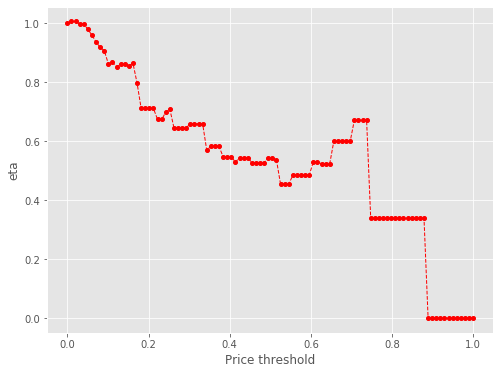

2212 54
Number of cells with price above 44.0th percentile:  54


eta =  1.0
eta =  1.006806687270853
eta =  1.006806687270853
eta =  0.998278084308816
eta =  0.998278084308816
eta =  0.9803201870290081
eta =  0.959938974057047
eta =  0.9371918059248595
eta =  0.9189568907780931
eta =  0.9077520261472342
eta =  0.8628842507637255
eta =  0.8675959534628146
eta =  0.8537016417674512
eta =  0.8621633999785151
eta =  0.8621633999785151
eta =  0.8567072195858493
eta =  0.8650725867245957
eta =  0.7980251405185801
eta =  0.7115873635331261
eta =  0.7115873635331261
eta =  0.7115873635331261
eta =  0.7115873635331261
eta =  0.6739885532566755
eta =  0.6739885532566755
eta =  0.6988013117514904
eta =  0.7089244103783381
eta =  0.6459833293683197
eta =  0.6459833293683197
eta =  0.6459833293683197
eta =  0.6459833293683197
eta =  0.6595704462340125
eta =  0.6595704462340125
eta =  0.6595704462340125
eta =  0.6595704462340125
eta =  0.5695252560392912
eta =  0.5826873065667862
eta =  0.5826873065667862
eta =  0.5826873065667862
eta =  0.5469566203296743
eta = 

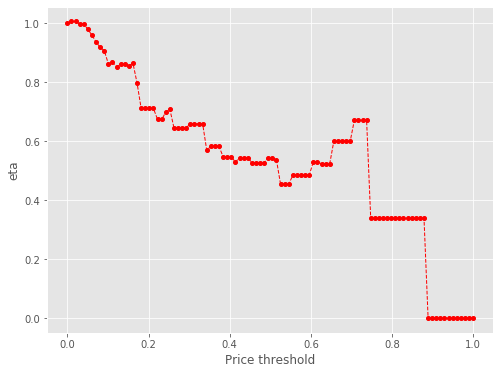

2212 53
Number of cells with price above 45.0th percentile:  53


eta =  1.0
eta =  0.9915290561039524
eta =  0.9736925662327077
eta =  0.9534491439058175
eta =  0.9308557618596095
eta =  0.9011960503031939
eta =  0.9016150147034423
eta =  0.8570505755208505
eta =  0.8596744837739029
eta =  0.847930047109219
eta =  0.8563345981695634
eta =  0.8563345981695634
eta =  0.8563345981695634
eta =  0.8592241168655173
eta =  0.8592241168655173
eta =  0.7926299562846406
eta =  0.7067765565423718
eta =  0.7067765565423718
eta =  0.7067765565423718
eta =  0.7067765565423718
eta =  0.6694319393960857
eta =  0.6840315365061284
eta =  0.694076947031141
eta =  0.704131606733778
eta =  0.6416160495709302
eta =  0.6416160495709302
eta =  0.6416160495709302
eta =  0.6416160495709302
eta =  0.6551113084299306
eta =  0.6551113084299306
eta =  0.6551113084299306
eta =  0.6551113084299306
eta =  0.5656748840068803
eta =  0.5787479502607144
eta =  0.5787479502607144
eta =  0.5787479502607144
eta =  0.5493868133747851
eta =  0.5432588273845375
eta =  0.5432588273845375
eta 

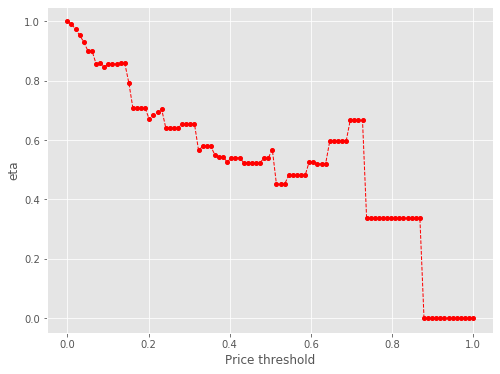

2212 52
Number of cells with price above 46.0th percentile:  52


eta =  1.0
eta =  0.9820111273981923
eta =  0.9615947591614072
eta =  0.9388083547619387
eta =  0.9205419864689877
eta =  0.9093177947262461
eta =  0.8643726275541409
eta =  0.8690924574023052
eta =  0.85517417960601
eta =  0.8636505333836478
eta =  0.8636505333836478
eta =  0.8581849417029053
eta =  0.8665647381446336
eta =  0.8665647381446336
eta =  0.799401642750791
eta =  0.7128147704713083
eta =  0.7128147704713083
eta =  0.7128147704713083
eta =  0.7128147704713083
eta =  0.6751511065409486
eta =  0.6898754325908671
eta =  0.7000066642105278
eta =  0.7101472240264399
eta =  0.6470975768396069
eta =  0.6470975768396069
eta =  0.6470975768396069
eta =  0.6470975768396069
eta =  0.6607081299302322
eta =  0.6607081299302322
eta =  0.6607081299302322
eta =  0.6607081299302322
eta =  0.5705076220656661
eta =  0.5836923756272031
eta =  0.5836923756272031
eta =  0.5836923756272031
eta =  0.5836923756272031
eta =  0.5479000580368084
eta =  0.5479000580368084
eta =  0.5302319967732121
eta 

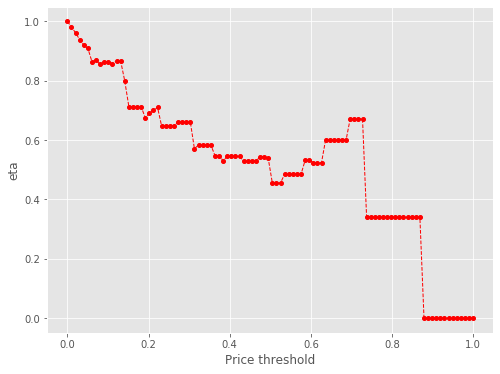

2212 49
Number of cells with price above 47.0th percentile:  49


eta =  1.0
eta =  0.9560058216949965
eta =  0.9255447577154579
eta =  0.9259750417853768
eta =  0.9328362866510029
eta =  0.8829013526313038
eta =  0.8974407581518649
eta =  0.8708396022678148
eta =  0.8794712292841964
eta =  0.8794712292841964
eta =  0.8739055167090004
eta =  0.8824388176135741
eta =  0.8140454017754163
eta =  0.7258723965377956
eta =  0.7258723965377956
eta =  0.7258723965377956
eta =  0.7258723965377956
eta =  0.6958399273346068
eta =  0.6875187945474104
eta =  0.7025128466911271
eta =  0.7128296662637353
eta =  0.6589513690685682
eta =  0.6589513690685682
eta =  0.6589513690685682
eta =  0.6589513690685682
eta =  0.6589513690685682
eta =  0.672811245714453
eta =  0.672811245714453
eta =  0.672811245714453
eta =  0.672811245714453
eta =  0.5809584088697733
eta =  0.5943846860204912
eta =  0.5943846860204912
eta =  0.5943846860204912
eta =  0.5943846860204912
eta =  0.5579367104407997
eta =  0.5579367104407997
eta =  0.5399449985643698
eta =  0.5553104189245743
eta =

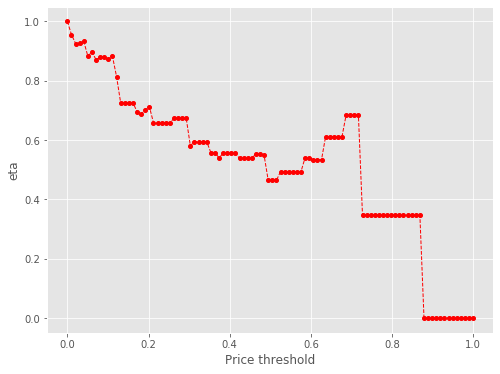

2212 43
Number of cells with price above 48.00000000000001th percentile:  43


eta =  1.0
eta =  0.9805430275515784
eta =  0.9685872415961074
eta =  0.9207125428419594
eta =  0.9257400117862054
eta =  0.9109145389133905
eta =  0.919943382483692
eta =  0.919943382483692
eta =  0.9141215428579373
eta =  0.923047535473175
eta =  0.923047535473175
eta =  0.8515067411745624
eta =  0.7592761257989258
eta =  0.7592761257989258
eta =  0.7592761257989258
eta =  0.7592761257989258
eta =  0.7191575395727621
eta =  0.7191575395727621
eta =  0.7348415990245469
eta =  0.7564347083452594
eta =  0.689275477319007
eta =  0.689275477319007
eta =  0.689275477319007
eta =  0.689275477319007
eta =  0.689275477319007
eta =  0.7037731679515925
eta =  0.7037731679515925
eta =  0.7037731679515925
eta =  0.6076933797743357
eta =  0.6076933797743357
eta =  0.6217375172116089
eta =  0.6217375172116089
eta =  0.6217375172116089
eta =  0.5836122519124193
eta =  0.5836122519124193
eta =  0.5836122519124193
eta =  0.5647925842198831
eta =  0.5808651017835958
eta =  0.5808651017835958
eta =  0.5

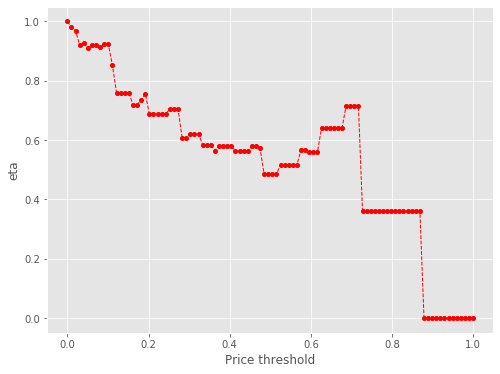

2212 40
Number of cells with price above 49.0th percentile:  40


eta =  1.0
eta =  0.9534828832200245
eta =  0.9557631693152437
eta =  0.940456883793266
eta =  0.9497785465021648
eta =  0.9497785465021648
eta =  0.9437678957566924
eta =  0.9529833718975187
eta =  0.9529833718975187
eta =  0.8791224007569919
eta =  0.7839006061526643
eta =  0.7839006061526643
eta =  0.7839006061526643
eta =  0.7839006061526643
eta =  0.7424809131159757
eta =  0.7424809131159757
eta =  0.758673630486421
eta =  0.7698152046186095
eta =  0.7116297301037844
eta =  0.7116297301037844
eta =  0.7116297301037844
eta =  0.7116297301037844
eta =  0.7116297301037844
eta =  0.7265976029086081
eta =  0.7265976029086081
eta =  0.7265976029086081
eta =  0.7265976029086081
eta =  0.6274018009703856
eta =  0.6419014111594793
eta =  0.6419014111594793
eta =  0.6419014111594793
eta =  0.6419014111594793
eta =  0.6025396854811975
eta =  0.6025396854811975
eta =  0.5831096673224576
eta =  0.5831096673224576
eta =  0.5997034410926214
eta =  0.5997034410926214
eta =  0.5997034410926214
eta

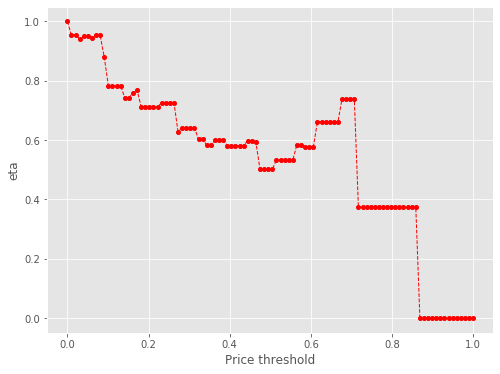

2212 36
Number of cells with price above 50.0th percentile:  36


eta =  1.0
eta =  0.9863385073229965
eta =  0.9961149415652332
eta =  0.9961149415652332
eta =  0.9961149415652332
eta =  0.9898110520552572
eta =  0.9994761192557344
eta =  0.9220117279799418
eta =  0.822144392886571
eta =  0.822144392886571
eta =  0.822144392886571
eta =  0.822144392886571
eta =  0.8131323112411719
eta =  0.7787039769487312
eta =  0.7956866807344148
eta =  0.8073718135545889
eta =  0.8190677053047987
eta =  0.7463476719168011
eta =  0.7463476719168011
eta =  0.7463476719168011
eta =  0.7463476719168011
eta =  0.7463476719168011
eta =  0.7620457752265065
eta =  0.7620457752265065
eta =  0.7620457752265065
eta =  0.7620457752265065
eta =  0.6580105547900088
eta =  0.6732175505780474
eta =  0.6732175505780474
eta =  0.6732175505780474
eta =  0.6732175505780474
eta =  0.6319355030751572
eta =  0.6319355030751572
eta =  0.6115575618444531
eta =  0.6115575618444531
eta =  0.6289608881780362
eta =  0.6289608881780362
eta =  0.6289608881780362
eta =  0.6096336336761546
eta =

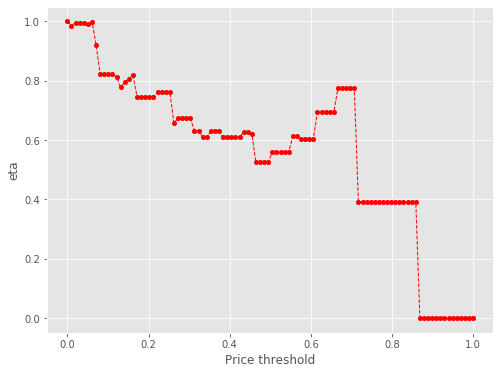

2212 33
Number of cells with price above 51.0th percentile:  33


eta =  1.0
eta =  1.0099118448379052
eta =  1.0099118448379052
eta =  1.0035206419565688
eta =  1.0133195772396582
eta =  1.0133195772396582
eta =  0.9347822488268831
eta =  0.8335316798265722
eta =  0.8335316798265722
eta =  0.8335316798265722
eta =  0.8335316798265722
eta =  0.7894895831069169
eta =  0.7894895831069169
eta =  0.8067075094674886
eta =  0.8185544897216495
eta =  0.756685120144452
eta =  0.756685120144452
eta =  0.756685120144452
eta =  0.756685120144452
eta =  0.756685120144452
eta =  0.7726006533951119
eta =  0.7726006533951119
eta =  0.7726006533951119
eta =  0.7726006533951119
eta =  0.6671244708633584
eta =  0.6825420944024734
eta =  0.6825420944024734
eta =  0.6825420944024734
eta =  0.6825420944024734
eta =  0.6479152558017801
eta =  0.6406882610618964
eta =  0.6406882610618964
eta =  0.62002807079313
eta =  0.62002807079313
eta =  0.637672445624259
eta =  0.637672445624259
eta =  0.637672445624259
eta =  0.6180774948458113
eta =  0.6180774948458113
eta =  0.6180

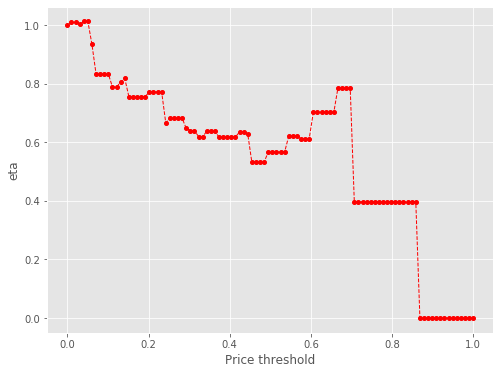

2212 32
Number of cells with price above 52.0th percentile:  32


eta =  1.0
eta =  1.0033742869926432
eta =  1.0033742869926432
eta =  0.9256077682472564
eta =  0.8253509294767775
eta =  0.8253509294767775
eta =  0.8253509294767775
eta =  0.8253509294767775
eta =  0.8163036988115712
eta =  0.7817410867516194
eta =  0.7817410867516194
eta =  0.8105207339686472
eta =  0.8222622421643093
eta =  0.7492585853034557
eta =  0.7492585853034557
eta =  0.7492585853034557
eta =  0.7492585853034557
eta =  0.7492585853034557
eta =  0.7650179145280915
eta =  0.7650179145280915
eta =  0.7650179145280915
eta =  0.7650179145280915
eta =  0.6605769347822972
eta =  0.6758432410623167
eta =  0.6758432410623167
eta =  0.6758432410623167
eta =  0.6758432410623167
eta =  0.6758432410623167
eta =  0.6344001848643822
eta =  0.6344001848643822
eta =  0.6139427653634927
eta =  0.6139427653634927
eta =  0.6314139683415713
eta =  0.6314139683415713
eta =  0.6314139683415713
eta =  0.6314139683415713
eta =  0.6120113334694228
eta =  0.6120113334694228
eta =  0.6120113334694228
e

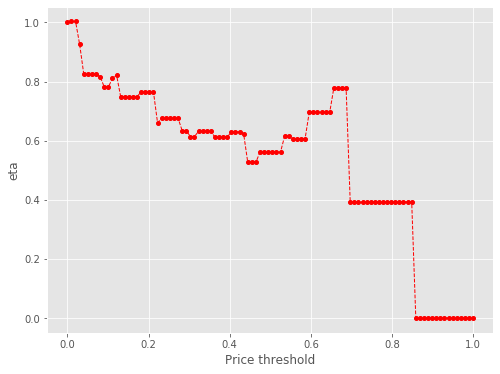

2212 30
Number of cells with price above 53.0th percentile:  30


eta =  1.0
eta =  0.8225753242596587
eta =  0.8225753242596587
eta =  0.8225753242596587
eta =  0.8225753242596587
eta =  0.8225753242596587
eta =  0.7885418381938404
eta =  0.7791121387958699
eta =  0.7961037441564162
eta =  0.8077950018013467
eta =  0.8194970240156634
eta =  0.746738874033902
eta =  0.746738874033902
eta =  0.746738874033902
eta =  0.746738874033902
eta =  0.746738874033902
eta =  0.7624452055882718
eta =  0.7624452055882718
eta =  0.7624452055882718
eta =  0.7624452055882718
eta =  0.6583554545355222
eta =  0.6735704211515956
eta =  0.6735704211515956
eta =  0.6735704211515956
eta =  0.6735704211515956
eta =  0.6735704211515956
eta =  0.6322667354430955
eta =  0.6322667354430955
eta =  0.6118781130056944
eta =  0.6118781130056944
eta =  0.6292905613856943
eta =  0.6292905613856943
eta =  0.6292905613856943
eta =  0.6292905613856943
eta =  0.6099531764001743
eta =  0.6099531764001743
eta =  0.6099531764001743
eta =  0.6099531764001743
eta =  0.6099531764001743
eta = 

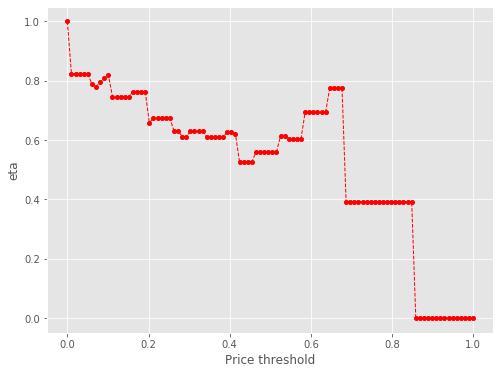

2212 29
Number of cells with price above 54.0th percentile:  29


eta =  1.0
eta =  0.8916853961151096
eta =  0.8916853961151096
eta =  0.8916853961151096
eta =  0.8916853961151096
eta =  0.8547925285456981
eta =  0.8445705768350832
eta =  0.8629897609629157
eta =  0.87566327960218
eta =  0.8883484672145269
eta =  0.8094774169001002
eta =  0.8094774169001002
eta =  0.8094774169001002
eta =  0.8094774169001002
eta =  0.8094774169001002
eta =  0.8265033427460747
eta =  0.8265033427460747
eta =  0.8265033427460747
eta =  0.8265033427460747
eta =  0.7136683133431072
eta =  0.7136683133431072
eta =  0.7301615913856284
eta =  0.7301615913856284
eta =  0.7301615913856284
eta =  0.7301615913856284
eta =  0.6853877059239586
eta =  0.6853877059239586
eta =  0.6853877059239586
eta =  0.6632860985232039
eta =  0.682161483516096
eta =  0.682161483516096
eta =  0.682161483516096
eta =  0.682161483516096
eta =  0.661199435078571
eta =  0.661199435078571
eta =  0.661199435078571
eta =  0.661199435078571
eta =  0.661199435078571
eta =  0.6805600636392597
eta =  0.680

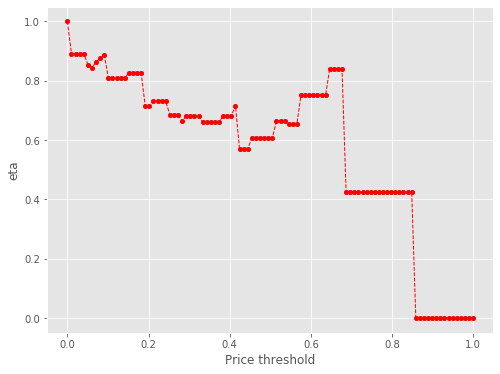

2212 28
Number of cells with price above 55.00000000000001th percentile:  28


eta =  1.0
eta =  0.9471620602004966
eta =  0.9471620602004966
eta =  0.9678186552373573
eta =  0.9820316486254741
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9269001671968391
eta =  0.9269001671968391
eta =  0.9269001671968391
eta =  0.9269001671968391
eta =  0.8003588669865108
eta =  0.8003588669865108
eta =  0.8188556127158668
eta =  0.8188556127158668
eta =  0.8188556127158668
eta =  0.8188556127158668
eta =  0.7686429641104948
eta =  0.7686429641104948
eta =  0.7686429641104948
eta =  0.7438566353256489
eta =  0.7438566353256489
eta =  0.7650248467543975
eta =  0.7650248467543975
eta =  0.7650248467543975
eta =  0.7650248467543975
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7632288995696469
eta =  0.7632288995696469
eta =  0.7632288995696469
eta =  0.7551356586134287
e

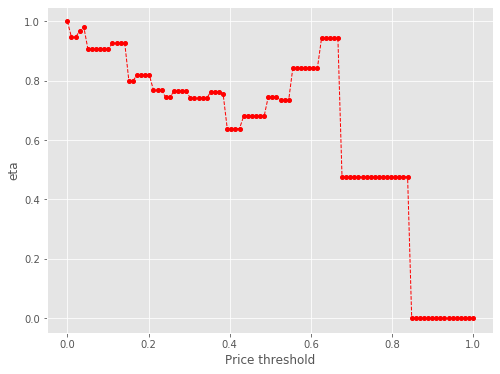

2212 28
Number of cells with price above 56.00000000000001th percentile:  28


eta =  1.0
eta =  0.9471620602004966
eta =  0.9471620602004966
eta =  0.9678186552373573
eta =  0.9820316486254741
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9078060719922377
eta =  0.9269001671968391
eta =  0.9269001671968391
eta =  0.9269001671968391
eta =  0.9269001671968391
eta =  0.8003588669865108
eta =  0.8003588669865108
eta =  0.8188556127158668
eta =  0.8188556127158668
eta =  0.8188556127158668
eta =  0.8188556127158668
eta =  0.7686429641104948
eta =  0.7686429641104948
eta =  0.7686429641104948
eta =  0.7438566353256489
eta =  0.7438566353256489
eta =  0.7650248467543975
eta =  0.7650248467543975
eta =  0.7650248467543975
eta =  0.7650248467543975
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7415165011777488
eta =  0.7632288995696469
eta =  0.7632288995696469
eta =  0.7632288995696469
eta =  0.7551356586134287
e

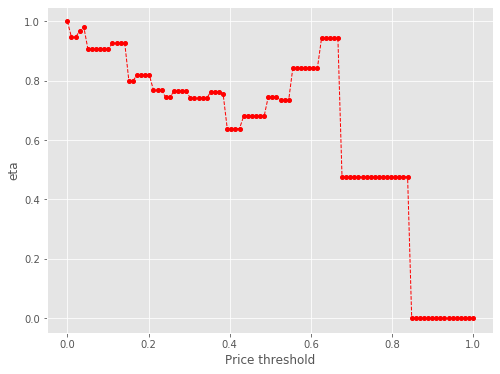

2212 25
Number of cells with price above 57.00000000000001th percentile:  25


eta =  1.0
eta =  1.0368148069799124
eta =  1.0368148069799124
eta =  0.9584485170363264
eta =  0.9584485170363264
eta =  0.9584485170363264
eta =  0.9584485170363264
eta =  0.9584485170363264
eta =  0.9584485170363264
eta =  0.9786077865076558
eta =  0.9786077865076558
eta =  0.9786077865076558
eta =  0.9786077865076558
eta =  0.8450073124942206
eta =  0.8450073124942206
eta =  0.8645359090317978
eta =  0.8645359090317978
eta =  0.8645359090317978
eta =  0.8645359090317978
eta =  0.8645359090317978
eta =  0.8115221210906477
eta =  0.8115221210906477
eta =  0.7853530737582418
eta =  0.7853530737582418
eta =  0.8077021651315467
eta =  0.8077021651315467
eta =  0.8077021651315467
eta =  0.8077021651315467
eta =  0.7828823939810083
eta =  0.7828823939810083
eta =  0.7828823939810083
eta =  0.7828823939810083
eta =  0.7828823939810083
eta =  0.7828823939810083
eta =  0.8058060300769283
eta =  0.8058060300769283
eta =  0.7972613033651078
eta =  0.6746646388675067
eta =  0.6746646388675067
e

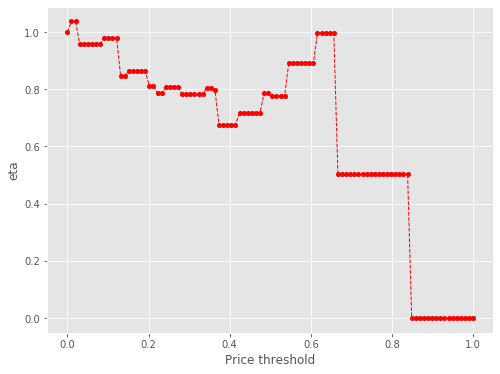

2212 23
Number of cells with price above 58.00000000000001th percentile:  23


eta =  1.0
eta =  0.9244163090495829
eta =  0.9244163090495829
eta =  0.9244163090495829
eta =  0.9244163090495829
eta =  0.9244163090495829
eta =  0.9244163090495829
eta =  0.9438597712142972
eta =  0.9438597712142972
eta =  0.9438597712142972
eta =  0.9438597712142972
eta =  0.9438597712142972
eta =  0.8150031295903281
eta =  0.8338383125044891
eta =  0.8338383125044891
eta =  0.8338383125044891
eta =  0.8338383125044891
eta =  0.8338383125044891
eta =  0.7827069170187598
eta =  0.7827069170187598
eta =  0.7827069170187598
eta =  0.7574670697902731
eta =  0.7574670697902731
eta =  0.7790225985335445
eta =  0.7790225985335445
eta =  0.7790225985335445
eta =  0.7790225985335445
eta =  0.7550841179259664
eta =  0.7550841179259664
eta =  0.7550841179259664
eta =  0.7550841179259664
eta =  0.7550841179259664
eta =  0.7771937906868072
eta =  0.7771937906868072
eta =  0.7771937906868072
eta =  0.7689524667258675
eta =  0.6507089157346283
eta =  0.6507089157346283
eta =  0.6507089157346283
e

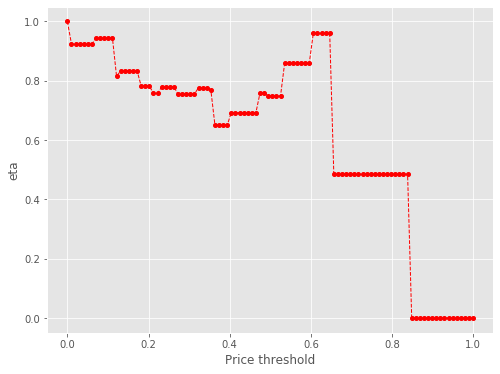

2212 21
Number of cells with price above 59.0th percentile:  21


eta =  1.0
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  0.8816407949663443
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.8467039247971313
eta =  0.8467039247971313
eta =  0.8467039247971313
eta =  0.8194003744579595
eta =  0.8194003744579595
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8407400248983716
eta =  0.8407400248983716
eta =  0.8407400248983716
eta =  0.8318248598582689
eta =  0.7039132795089255
eta =  0.7039132795089255
eta =  0.7039132795089255
eta =  0.7039132795089255
eta =  0.7494208156760142
eta =  0.7494208156760142
eta =  0.7494208156760142
e

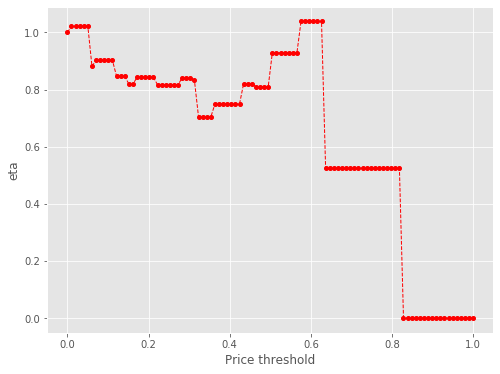

2212 21
Number of cells with price above 60.0th percentile:  21


eta =  1.0
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  1.0210332314287105
eta =  0.8816407949663443
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.9020160119868293
eta =  0.8467039247971313
eta =  0.8467039247971313
eta =  0.8467039247971313
eta =  0.8194003744579595
eta =  0.8194003744579595
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8427183628277592
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8168225836498803
eta =  0.8407400248983716
eta =  0.8407400248983716
eta =  0.8407400248983716
eta =  0.8318248598582689
eta =  0.7039132795089255
eta =  0.7039132795089255
eta =  0.7039132795089255
eta =  0.7039132795089255
eta =  0.7494208156760142
eta =  0.7494208156760142
eta =  0.7494208156760142
e

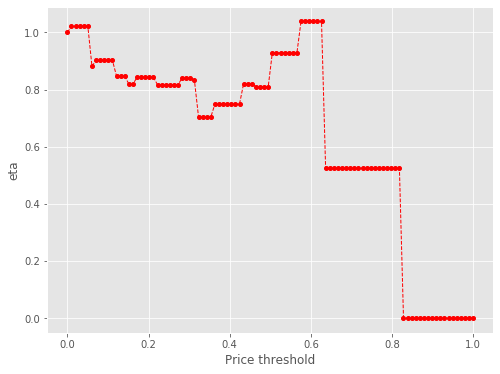

2212 20
Number of cells with price above 61.0th percentile:  20


eta =  1.0
eta =  0.8634790404742093
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8292618680122255
eta =  0.8292618680122255
eta =  0.8292618680122255
eta =  0.8025207693890527
eta =  0.8025207693890527
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.8234208241409945
eta =  0.8234208241409945
eta =  0.8234208241409945
eta =  0.8146893110367365
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
e

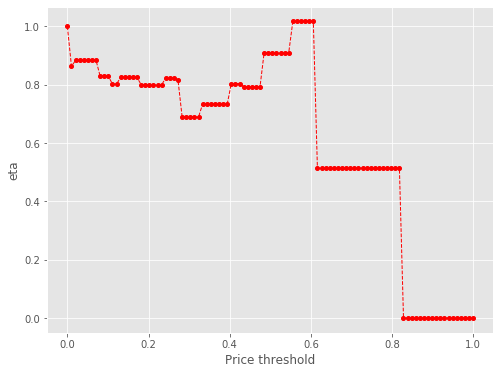

2212 20
Number of cells with price above 62.0th percentile:  20


eta =  1.0
eta =  0.8634790404742093
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8834345290844815
eta =  0.8292618680122255
eta =  0.8292618680122255
eta =  0.8292618680122255
eta =  0.8025207693890527
eta =  0.8025207693890527
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.8253584084119976
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.7999960809374611
eta =  0.8234208241409945
eta =  0.8234208241409945
eta =  0.8234208241409945
eta =  0.8146893110367365
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.6894127025855509
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
eta =  0.7339827858759946
e

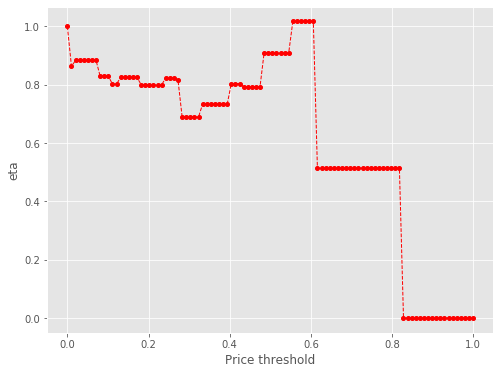

2212 18
Number of cells with price above 63.0th percentile:  18


eta =  1.0
eta =  1.0231105651381103
eta =  1.0231105651381103
eta =  1.0231105651381103
eta =  1.0231105651381103
eta =  1.0231105651381103
eta =  0.9603728974785626
eta =  0.9603728974785626
eta =  0.9603728974785626
eta =  0.9294038786955625
eta =  0.9294038786955625
eta =  0.9294038786955625
eta =  0.9558522786595068
eta =  0.9558522786595068
eta =  0.9558522786595068
eta =  0.9558522786595068
eta =  0.9264800226049675
eta =  0.9264800226049675
eta =  0.9264800226049675
eta =  0.9264800226049675
eta =  0.9264800226049675
eta =  0.9264800226049675
eta =  0.9264800226049675
eta =  0.9536083512678948
eta =  0.9536083512678948
eta =  0.9536083512678948
eta =  0.9434963361581096
eta =  0.7984127816315449
eta =  0.7984127816315449
eta =  0.7984127816315449
eta =  0.7984127816315449
eta =  0.7984127816315449
eta =  0.8500296492117546
eta =  0.8500296492117546
eta =  0.8500296492117546
eta =  0.8500296492117546
eta =  0.8500296492117546
eta =  0.8500296492117546
eta =  0.8500296492117546
e

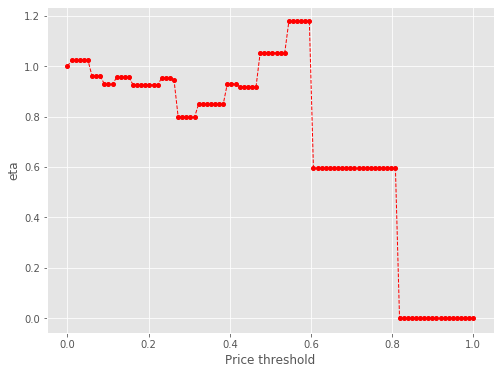

2212 17
Number of cells with price above 64.0th percentile:  17


eta =  1.0
eta =  0.9386794841170673
eta =  0.9386794841170673
eta =  0.9386794841170673
eta =  0.9084100099876319
eta =  0.9084100099876319
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.932067739070964
eta =  0.932067739070964
eta =  0.932067739070964
eta =  0.9221841395321203
eta =  0.981282107855643
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.9103163909440005
eta =  0.9103163909440005
eta =  0.9103163909440005
eta =

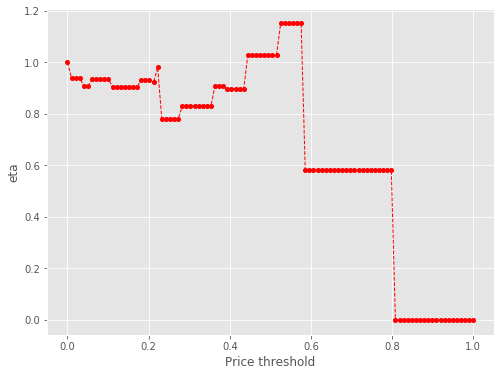

2212 17
Number of cells with price above 65.0th percentile:  17


eta =  1.0
eta =  0.9386794841170673
eta =  0.9386794841170673
eta =  0.9386794841170673
eta =  0.9084100099876319
eta =  0.9084100099876319
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9342609794382055
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.9055521995121821
eta =  0.932067739070964
eta =  0.932067739070964
eta =  0.932067739070964
eta =  0.9221841395321203
eta =  0.981282107855643
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.7803778094342781
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.8308287277797866
eta =  0.9103163909440005
eta =  0.9103163909440005
eta =  0.9103163909440005
eta =

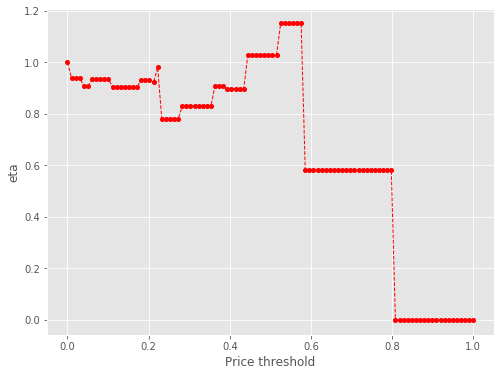

2212 15
Number of cells with price above 66.0th percentile:  15


eta =  1.0
eta =  0.9677531312427615
eta =  0.9677531312427615
eta =  0.9952928504845102
eta =  0.9952928504845102
eta =  0.9952928504845102
eta =  0.9952928504845102
eta =  0.9952928504845102
eta =  0.9647086304053561
eta =  0.9647086304053561
eta =  0.9647086304053561
eta =  0.9647086304053561
eta =  0.9647086304053561
eta =  0.9647086304053561
eta =  0.9647086304053561
eta =  0.9929563337028482
eta =  0.9929563337028482
eta =  0.9929563337028482
eta =  0.9824270745615978
eta =  1.0453856981636795
eta =  0.8313570527945549
eta =  0.8313570527945549
eta =  0.8313570527945549
eta =  0.8313570527945549
eta =  0.8313570527945549
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.8851037461005911
eta =  0.9697840491318019
eta =  0.9697840491318019
eta =  0.9697840491318019
eta =  0.9568769274988528
eta =  0.9568769274988528
eta =  0.9568769274988528
e

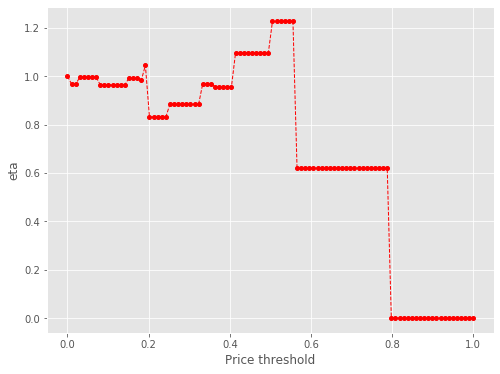

2212 14
Number of cells with price above 67.0th percentile:  14


eta =  1.0
eta =  1.0284573806611021
eta =  1.0284573806611021
eta =  1.0284573806611021
eta =  1.0284573806611021
eta =  1.0284573806611021
eta =  0.9968540521966632
eta =  0.9968540521966632
eta =  0.9968540521966632
eta =  0.9968540521966632
eta =  0.9968540521966632
eta =  0.9968540521966632
eta =  0.9968540521966632
eta =  1.0260430079184775
eta =  1.0260430079184775
eta =  1.0260430079184775
eta =  1.0151628993439603
eta =  1.0802193910974223
eta =  0.8590590161428352
eta =  0.8590590161428352
eta =  0.8590590161428352
eta =  0.8590590161428352
eta =  0.8590590161428352
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  0.9145966233805574
eta =  1.0020985908735138
eta =  1.0020985908735138
eta =  1.0020985908735138
eta =  0.9887613861502657
eta =  0.9887613861502657
eta =  0.9887613861502657
eta =  0.9887613861502657
e

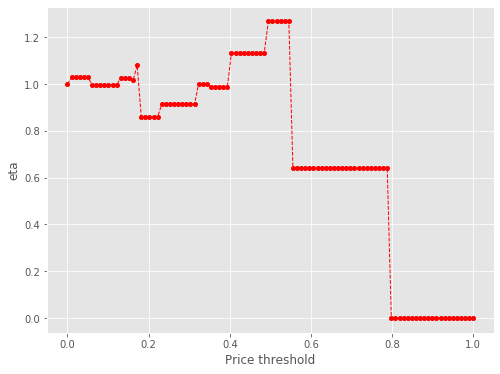

2212 13
Number of cells with price above 68.0th percentile:  13


eta =  1.0
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.997652432868854
eta =  0.997652432868854
eta =  0.997652432868854
eta =  0.997652432868854
eta =  0.9870733765276729
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.9743705570272201
eta =  0.9743705570272201
eta =  0.9743705570272201
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  1.10210446366465
eta =  1.10210446366465
eta =  1.102104463

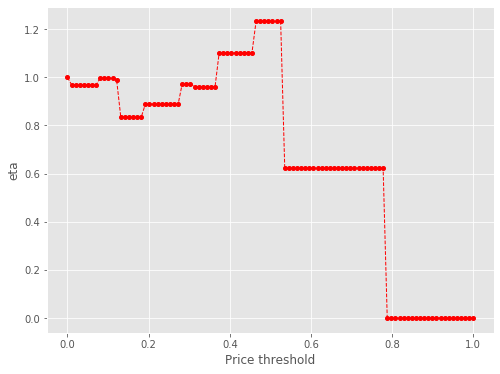

2212 13
Number of cells with price above 69.0th percentile:  13


eta =  1.0
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.9692711345567632
eta =  0.997652432868854
eta =  0.997652432868854
eta =  0.997652432868854
eta =  0.997652432868854
eta =  0.9870733765276729
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.8352888824528869
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.889289765991709
eta =  0.9743705570272201
eta =  0.9743705570272201
eta =  0.9743705570272201
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  0.9614023923039771
eta =  1.10210446366465
eta =  1.10210446366465
eta =  1.102104463

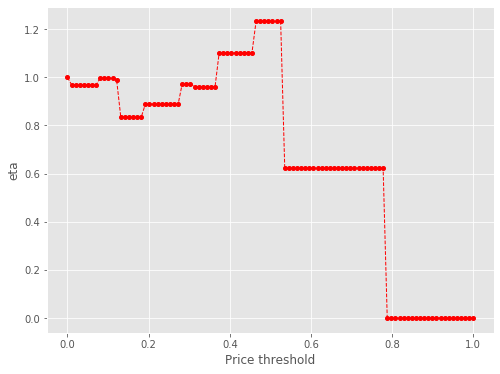

2212 12
Number of cells with price above 70.0th percentile:  12


eta =  1.0
eta =  1.0292810724473593
eta =  1.0292810724473593
eta =  1.0292810724473593
eta =  1.0183666275990468
eta =  1.0183666275990468
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  1.0052610897907208
eta =  1.0052610897907208
eta =  1.0052610897907208
eta =  1.0052610897907208
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
e

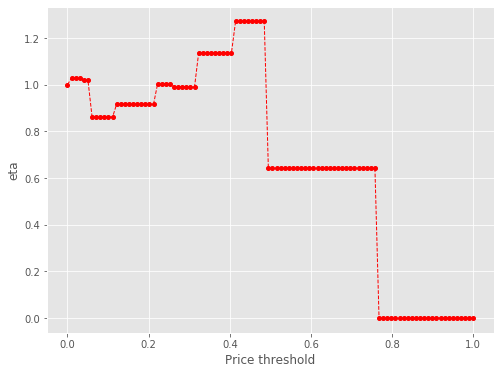

2212 12
Number of cells with price above 71.00000000000001th percentile:  12


eta =  1.0
eta =  1.0292810724473593
eta =  1.0292810724473593
eta =  1.0292810724473593
eta =  1.0183666275990468
eta =  1.0183666275990468
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.8617700998955831
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  0.9174829769364494
eta =  1.0052610897907208
eta =  1.0052610897907208
eta =  1.0052610897907208
eta =  1.0052610897907208
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  0.9918817945028515
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
eta =  1.1370445527284068
e

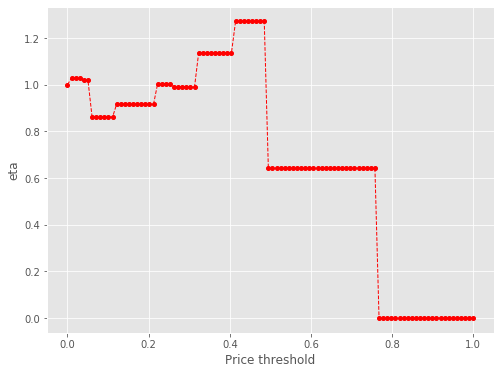

2212 11
Number of cells with price above 72.0th percentile:  11


eta =  1.0
eta =  0.989396050174749
eta =  0.8372543933471163
eta =  0.8372543933471163
eta =  0.8372543933471163
eta =  0.8372543933471163
eta =  0.8372543933471163
eta =  0.8372543933471163
eta =  0.8372543933471163
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.8913823458882
eta =  0.9766633397818875
eta =  0.9766633397818875
eta =  0.9766633397818875
eta =  0.9766633397818875
eta =  0.9636646597847348
eta =  0.9636646597847348
eta =  0.9636646597847348
eta =  0.9636646597847348
eta =  0.9636646597847348
eta =  0.9636646597847348
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.1046978159472167
eta =  1.2352114549218312
eta = 

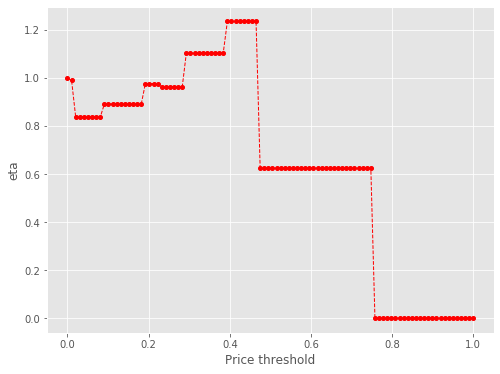

2212 10
Number of cells with price above 73.0th percentile:  10


eta =  1.0
eta =  0.8462277499483032
eta =  0.8462277499483032
eta =  0.8462277499483032
eta =  0.8462277499483032
eta =  0.8462277499483032
eta =  0.8462277499483032
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9009358241633999
eta =  0.9871308255267316
eta =  0.9871308255267316
eta =  0.9871308255267316
eta =  0.9871308255267316
eta =  0.9739928308936857
eta =  0.9739928308936857
eta =  0.9739928308936857
eta =  0.9739928308936857
eta =  0.9739928308936857
eta =  0.9739928308936857
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.1165375238278978
eta =  1.2484499556104613
e

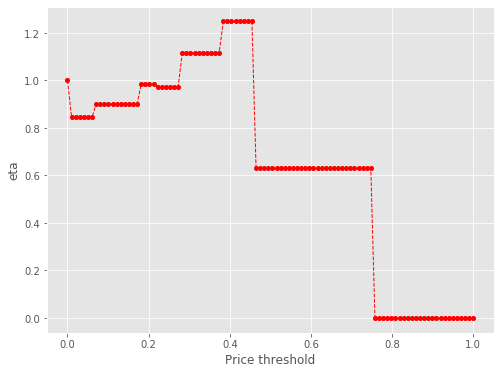

2212 8
Number of cells with price above 74.0th percentile:  8


eta =  1.0
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.064649350270585
eta =  1.1665072737062054
eta =  1.1665072737062054
eta =  1.1665072737062054
eta =  1.1665072737062054
eta =  1.1665072737062054
eta =  1.1509819087747806
eta =  1.1509819087747806
eta =  1.1509819087747806
eta =  1.1509819087747806
eta =  1.1509819087747806
eta =  1.1509819087747806
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.3194291062850492
eta =  1.4753120016292662
eta =  1.4753120016292662
eta =  1.4753120016292662
eta =  1.4753120016292662
eta =  1.4753120016292662
eta =  1.47

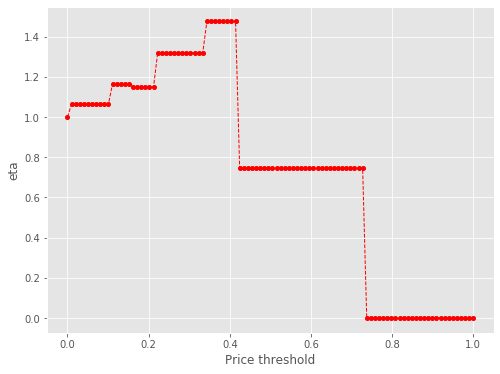

2212 7
Number of cells with price above 75.0th percentile:  7


eta =  1.0
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117

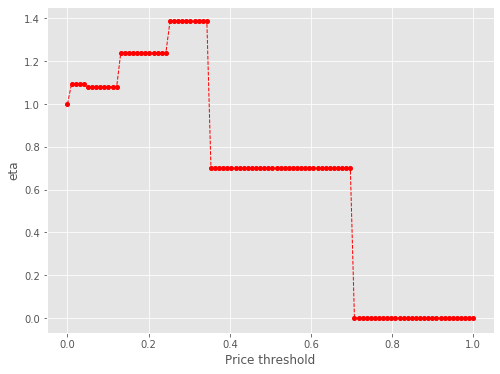

2212 7
Number of cells with price above 76.0th percentile:  7


eta =  1.0
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117

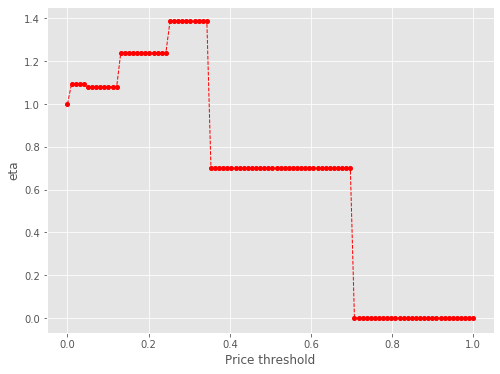

2212 7
Number of cells with price above 77.0th percentile:  7


eta =  1.0
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.095672742776514
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.0810901340260566
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.2393086098720778
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  1.385725733317087
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117
eta =  0.70008057559117

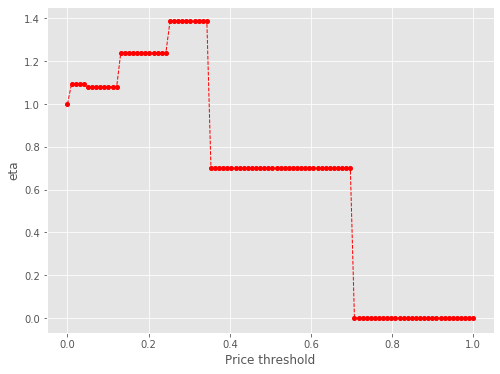

2212 6
Number of cells with price above 78.0th percentile:  6


eta =  1.0
eta =  0.9866907259977061
eta =  0.9866907259977061
eta =  0.9866907259977061
eta =  0.9866907259977061
eta =  0.9866907259977061
eta =  0.9866907259977061
eta =  0.9866907259977061
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.1310937668592356
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  1.264725934320094
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6389504349785275
eta =  0.6

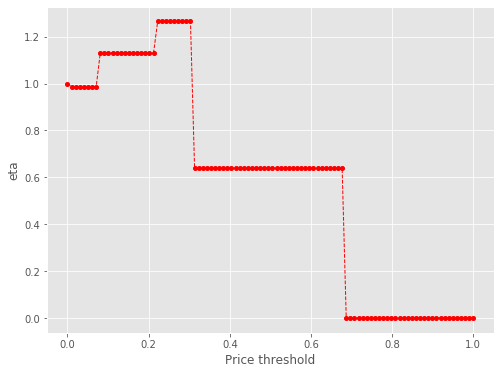

2212 5
Number of cells with price above 79.0th percentile:  5


eta =  1.0
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
e

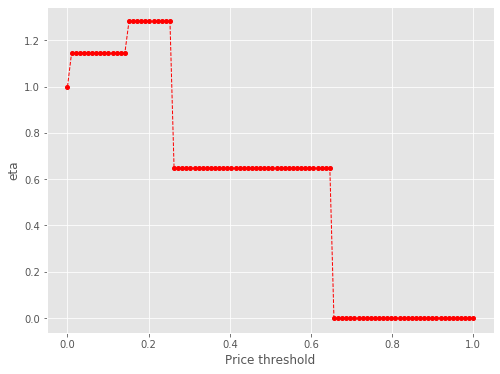

2212 5
Number of cells with price above 80.0th percentile:  5


eta =  1.0
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.1463508646192193
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  1.2817855696791403
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
eta =  0.6475691096948782
e

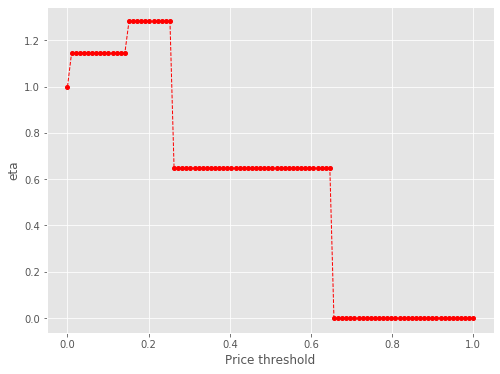

2212 4
Number of cells with price above 81.0th percentile:  4


eta =  1.0
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5

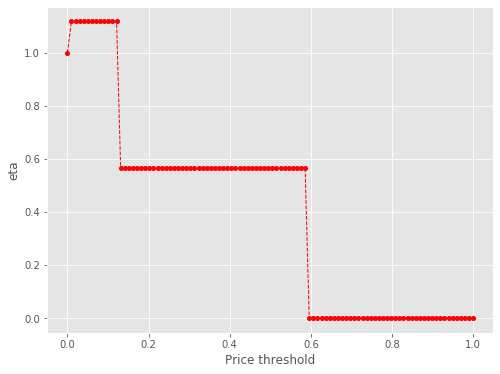

2212 4
Number of cells with price above 82.0th percentile:  4


eta =  1.0
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5

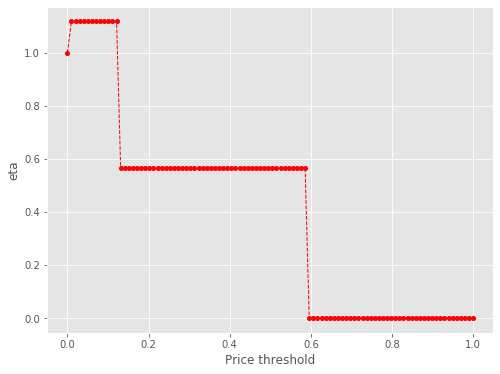

2212 4
Number of cells with price above 83.0th percentile:  4


eta =  1.0
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  1.1181441993371792
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5648960799711
eta =  0.5

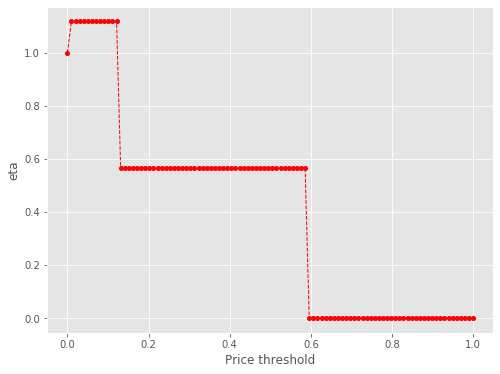

2212 3
Number of cells with price above 84.00000000000001th percentile:  3


eta =  1.0
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
e

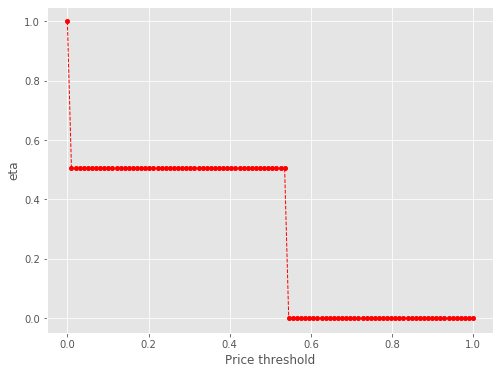

2212 3
Number of cells with price above 85.0th percentile:  3


eta =  1.0
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
eta =  0.5052086129015942
e

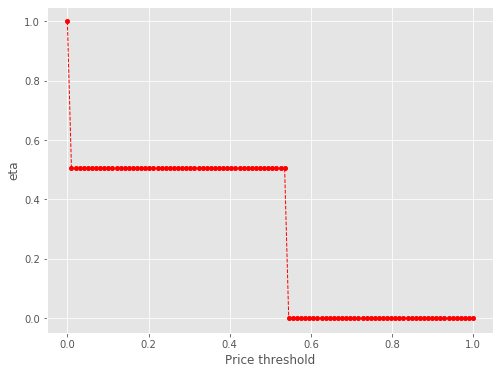

2212 2
Number of cells with price above 86.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

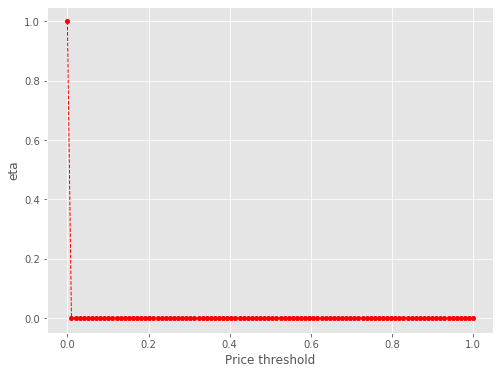

2212 2
Number of cells with price above 87.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

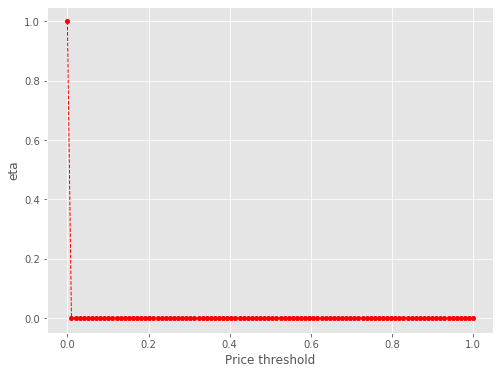

2212 2
Number of cells with price above 88.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

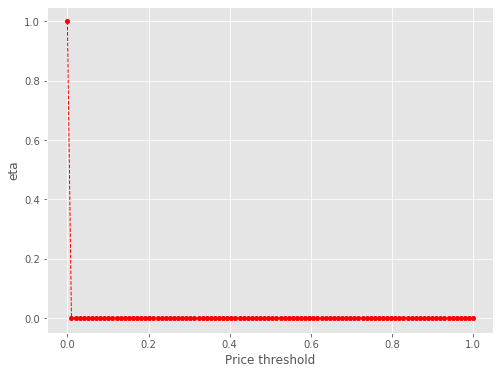

2212 2
Number of cells with price above 89.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

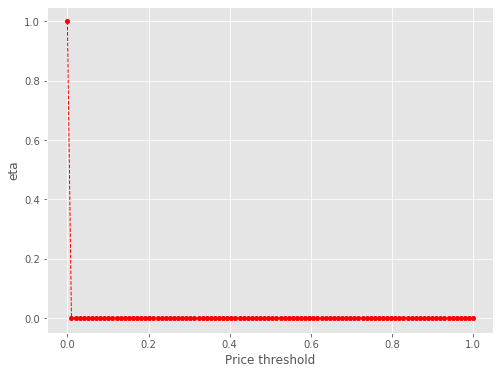

2212 2
Number of cells with price above 90.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

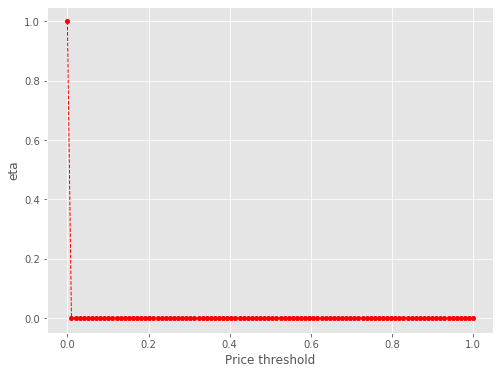

2212 2
Number of cells with price above 91.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

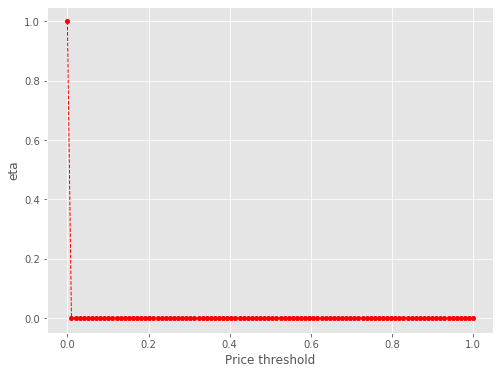

2212 2
Number of cells with price above 92.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

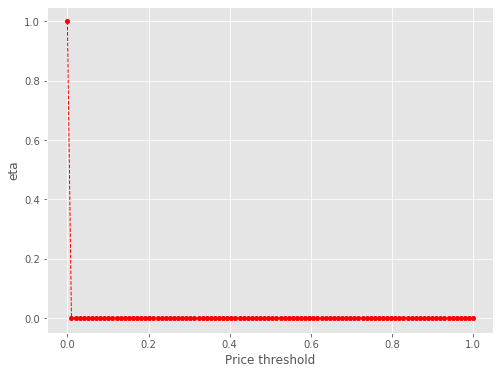

2212 2
Number of cells with price above 93.0th percentile:  2


eta =  1.0
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

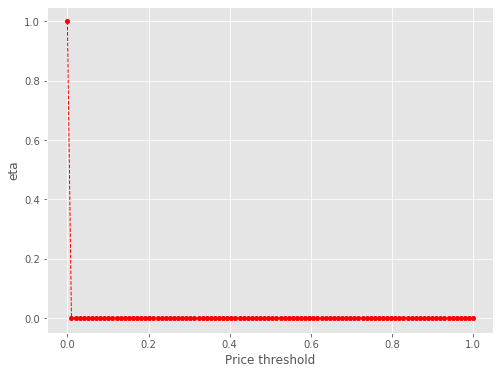

2212 1
Number of cells with price above 94.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning:

invalid value encountered in true_divide



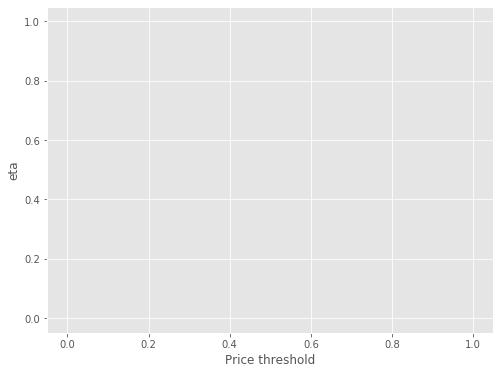

2212 1
Number of cells with price above 95.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

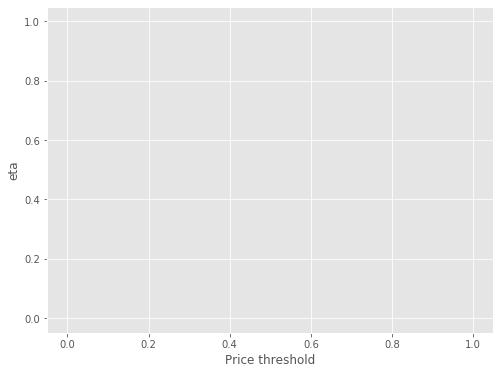

2212 1
Number of cells with price above 96.00000000000001th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

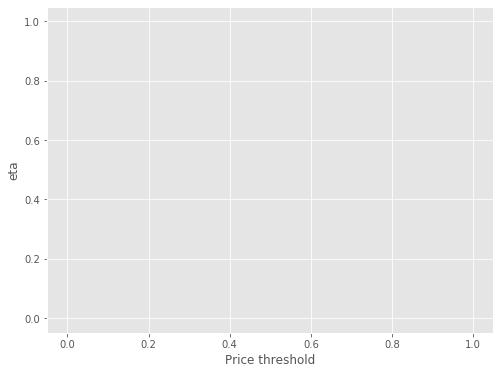

2212 1
Number of cells with price above 97.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

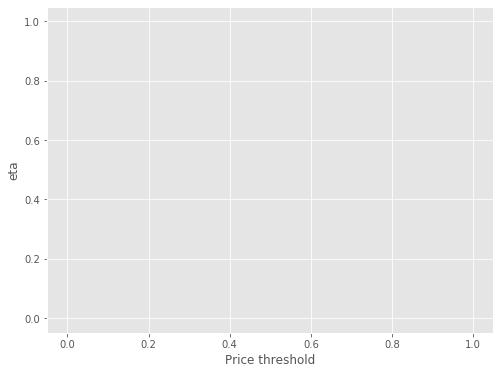

2212 1
Number of cells with price above 98.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

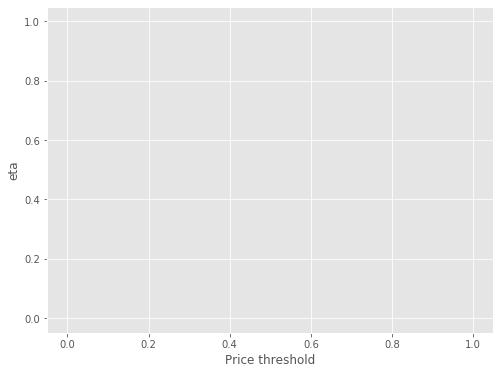

2212 1
Number of cells with price above 99.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

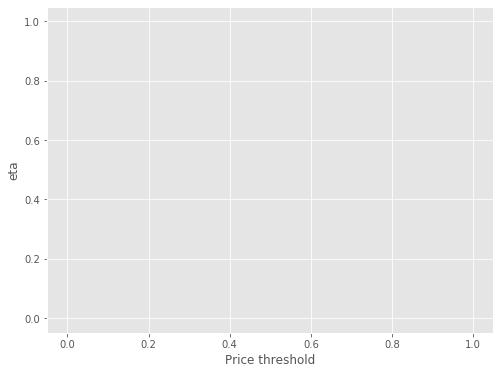

2212 1
Number of cells with price above 100.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

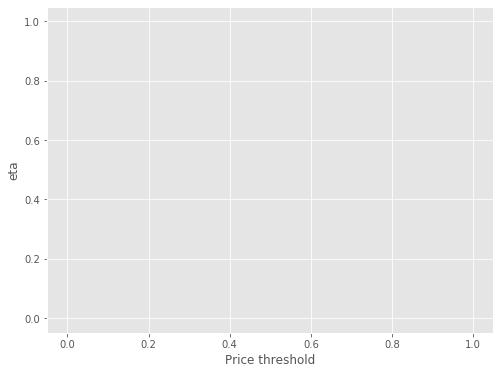


time: 1min 11s


In [30]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
#keys = np.array(keys)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_2d = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    etas = []
    lval = np.linspace(min(vals_cut), max(vals_cut), 100)
    for k in tqdm_notebook(lval):
        loubar_keys = keys[vals_cut>=k]
        dist_mat = mat[keys.reshape(-1,1), keys]

        total_dist = dist_mat.sum()
        dist_corr = dist_mat[dist_mat>0]

        loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

        loubar_dist = loubar_dist_mat.sum()

        loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
        eta = loubar_dist_corr.mean()/dist_corr.mean()
        etas.append(eta)
        print('eta = ', eta)
    etas_array = np.array(etas)
    etas_array = np.where(np.isnan(etas_array), 0, etas_array)
    lval = (lval - lval.min())/(lval - lval.min()).max()
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(lval, etas_array, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
    plt.xlabel("Price threshold")
    plt.ylabel("eta")
    plt.show()
    etas_2d.append(etas)
etas_2d = np.array(etas_2d)
etas_2d = np.where(np.isnan(etas_2d), 0, etas_2d)
lval = lval/lval.max()

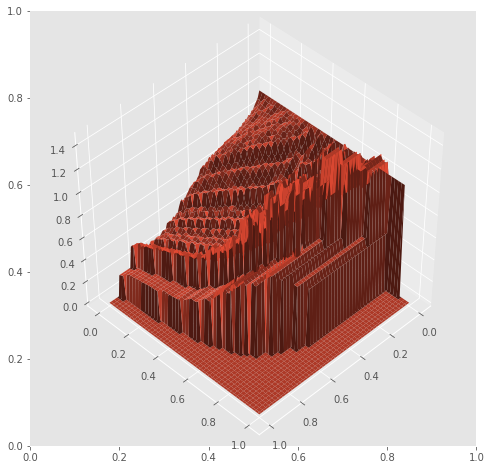

time: 1.04 s


In [31]:
X,Y = np.meshgrid(np.linspace(0,1, 100),np.linspace(0,1, 100))
etas_surface = etas_2d
fig, ax = plt.subplots(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
# Plot a 3D surface
ax.plot_surface(X, Y, etas_surface)
ax.view_init(45, 45)
plt.show()

In [34]:
pickle_in = open("etas_surface_dict.pickle","rb")
etas_surface_dict = pickle.load(pickle_in)
#etas_surface_dict = {}
etas_surface_dict['Boston'] = etas_surface


pickle_out = open("etas_surface_dict.pickle","wb")
pickle.dump(etas_surface_dict, pickle_out)
pickle_out.close()

etas_surface_dict

{'NY': array([[1.        , 0.40697941, 0.38848337, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.95418349, 0.92471336, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.96911482, 0.94572765, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]]),
 'Boston': array([[1.        , 0.94621367, 0.92299712, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.97340556, 0.95206791, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.96708982, 0.94781127, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.       

time: 38 ms


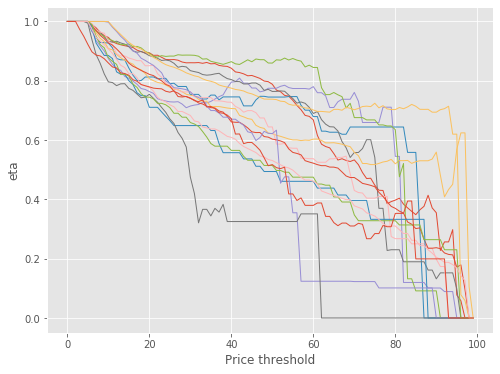

time: 234 ms


In [33]:
fig, ax = plt.subplots(figsize=(8, 6))
for key in etas_cut_threshold_dict:
    plt.plot(np.arange(100), etas_cut_threshold_dict[key], linestyle='-', linewidth=1)
plt.xlabel("Price threshold")
plt.ylabel("eta")
plt.show()

2212 354
Number of cells with price above 5th percentile:  354
total number of cells:  2212
number of cells within urban airbnb territory:  354



Mean travel times in minutes:  10.917222715435607
Mean travel times in minutes:  20.040708155776514
Mean travel times in minutes:  24.610008907433713
Mean travel times in minutes:  30.0813398881392
Mean travel times in minutes:  34.46320825935132
Mean travel times in minutes:  40.7069082179214
Mean travel times in minutes:  44.69820575875947


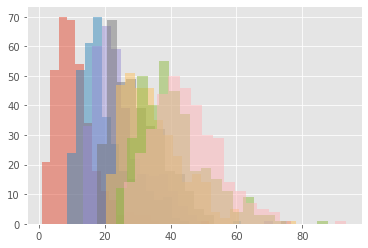

time: 8min 58s


In [36]:
from tqdm import tqdm_notebook

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.02*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.02*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

print('total number of cells: ', len(polylist))

times_names = ['times_{}'.format(c) for c in range(1, len(centers)+1)]
times_dict = {name:[] for name in times_names}

plist = poly_prices[poly_prices.index.isin(keys)].geometry.tolist()
print('number of cells within urban airbnb territory: ', len(plist))
for poly in tqdm_notebook(plist):
    origin = ox.get_nearest_node(G, poly.centroid.coords[0][::-1])
    dists_to_centers = []
    for node, target in centers.items():
        try:
            if origin!=target:
                path = nx.shortest_path(G, origin, target, weight='length')
                edges = [ tuple( path[i:i+2] ) for i in range( len(path) - 1 ) ]
                dist = np.sum([G.get_edge_data(*edge)[0]['length'] for edge in edges])
                dists_to_centers.append(dist)
        except:
            pass
    if len(dists_to_centers) != 0:
        dists_to_centers = sorted(dists_to_centers)
        #print('distance list length equal to # of centers: ', len(dists_to_centers)==len(centers))
        if len(dists_to_centers)==len(centers):
            for n, dist in enumerate(dists_to_centers):
                time = (dist/3.2)/60
                times_dict['times_{}'.format(n+1)].append(time)
                #print(times_dict['times_{}'.format(n+1)][-1])
        else:
            print('Distance list length NOT equal to # of centers')

#print(distances_dict)
for center in range(1, len(centers)+1):
    print("Mean travel times in minutes: ", np.mean(times_dict['times_{}'.format(center)]))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=0.5)
plt.show()

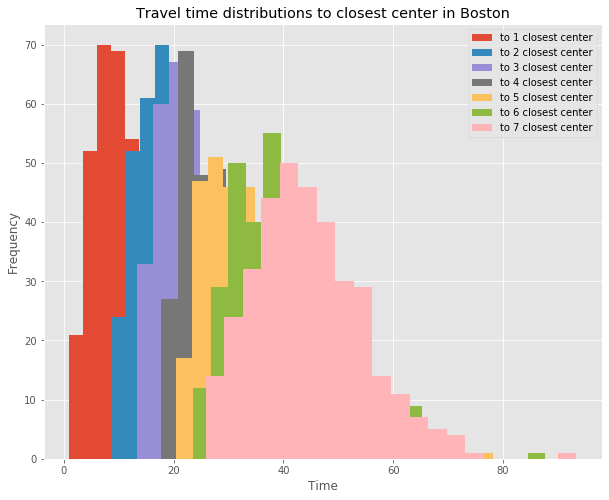

time: 629 ms


In [37]:
for center in range(1, len(centers)+1):
    times_dict['times_{}'.format(center)] = np.array(times_dict['times_{}'.format(center)])

fig, ax = plt.subplots(figsize=(10,8))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=1, label='to {} closest center'.format(center))
plt.title('Travel time distributions to closest center in Boston')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [38]:
pickle_in = open("City_Accessibility.pickle","rb")
access_dict = pickle.load(pickle_in)
#access_dict = {}
access_dict['Boston'] = times_dict


pickle_out = open("City_Accessibility.pickle","wb")
pickle.dump(access_dict, pickle_out)
pickle_out.close()

access_dict

{'Paris': {'times_1': array([ 4.73219737,  4.40047807,  7.81577632,  7.07926754,  6.7129386 ,
          7.48037281, 10.85755263,  8.41227193, 14.20045614, 15.15502193,
         16.00692982, 15.80582895, 14.35941228, 14.10681579, 12.26687281,
         13.89203947, 14.31310965, 15.99389474, 16.77728947, 17.82112281,
         20.19769737, 20.40849561, 21.93033333, 22.03087719, 20.6584386 ,
         20.62538596, 19.53197368, 20.61141228, 21.70609211, 23.22407018,
         21.70395614, 23.12607456, 22.79396053, 23.95434211, 21.49400439,
         21.55605702, 22.35374123, 22.36948246, 22.44162719, 21.54410965,
         21.93589912, 21.86757456, 21.86757456, 21.41060088, 21.92571491,
         22.93862281, 23.57200877, 25.13889474, 24.49192982, 26.04400877,
         26.815     , 38.90660088, 38.56507018, 37.89241228, 36.57546491,
         29.87379386, 27.54254825, 25.54755702, 26.98263158, 25.76562281,
         25.03485526, 25.37799123, 25.69687719, 26.07382018, 23.81846491,
         24.034649

time: 690 ms


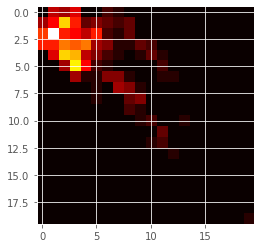

time: 203 ms


In [39]:
x = times_dict['times_{}'.format(1)]
y = times_dict['times_{}'.format(2)]
c_xy = np.histogram2d(x, y, 20)[0]
c_xx = np.histogram2d(x, x, 20)[0]
plt.imshow(c_xy, cmap='hot', interpolation='nearest')
plt.show()

In [40]:
from sklearn.metrics import mutual_info_score

def calc_MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

mi_list = []
for center in range(1, len(centers)+1):
    mi_list.append(times_dict['times_{}'.format(center)])

mis = []
for pair in combinations_with_replacement(mi_list, 2):
    MI = calc_MI(pair[0], pair[1], 20)
    print(MI)
    mis.append(MI)
mis = np.array(mis)
avg_mi = np.mean(mis)
print('average mutual information = ', avg_mi)

2.15703794636697
0.5159080364858263
0.5174094797852727
0.4001710429100034
0.543323547803486
0.5801432394348935
0.7297510224633432
2.3043244070806668
0.9325502265601242
0.6510318284786956
0.6745129849988674
0.6761620881959276
0.6535481059709807
2.240533757813455
0.8366081602505068
0.7400684248796279
0.7204863743855313
0.7468531794499126
2.270630656088403
1.0162804614330738
0.8353241439359624
0.8264408046941962
2.404807187275417
1.0156319399092424
0.9033787771922722
2.446544832034353
1.2699289581319766
2.45418029723353
average mutual information =  1.1451275682586615
time: 79.3 ms


In [41]:
pickle_in = open("Time_distribution_mutual_information.pickle","rb")
MI_dict = pickle.load(pickle_in)
#MI_dict = {}
MI_dict['Boston'] = avg_mi


pickle_out = open("Time_distribution_mutual_information.pickle","wb")
pickle.dump(MI_dict, pickle_out)
pickle_out.close()

MI_dict

{'Beijing': 1.629373608642793,
 'Florence': 2.0836399429599792,
 'Palermo': 1.8596013030930105,
 'Los_Angeles': 1.5602500680599918,
 'Moscow': 1.5631970905638934,
 'Porto': 1.6277816420571996,
 'Prague': 2.176480497902222,
 'Reykjavik': 1.3730161847793374,
 'Riga': 2.240374487910287,
 'Rome': 1.6095563575725969,
 'Seoul': 1.2910685865906735,
 'Siena': 2.7660068415344448,
 'Sydney': 1.2791891753795948,
 'Tallin': 2.3884073435187867,
 'Treviso': 2.631909071373147,
 'Valencia': 2.1872520197930965,
 'Venezia': 2.719891808939249,
 'Verona': 2.7080241467515376,
 'Vicenza': 2.6192607829416756,
 'Vienna': 1.4481542925032476,
 'Wellington': 2.1855226822614866,
 'Zurich': 2.462051055806955,
 'Aarhus': 2.2910468431831847,
 'Milan': 1.6107461389394335,
 'Busan': 1.903641833377143,
 'Barcelona': 1.6449937230537024,
 'Bologna': 2.7317991260148045,
 'Bremen': 1.9447717965210316,
 'Brno': 2.4300669174144036,
 'Budapest': 2.219525897631017,
 'Dublin': 1.830502368836079,
 'Boston': 1.1451275682586615,
 

time: 5.05 ms
